In [1]:
#%pip install opencv-python
#%pip install matplotlib
# %pip install keras
# %pip install tensorflow --user

In [2]:
# import os 
# !pip install -U -q segmentation-models --user
# os.kill(os.getpid(), 9)
# import os 
# os.environ["SM_FRAMEWORK"] = "tf.keras"
# import segmentation_models as sm

In [1]:
import numpy as np
import cv2
import os
import random
import matplotlib.pyplot as plt
import pickle
from keras.utils import np_utils
from PIL import Image
import tensorflow as tf

In [2]:
tf.debugging.set_log_device_placement(True)
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(physical_devices)
if physical_devices:
  tf.config.experimental.set_memory_growth(physical_devices[0], True)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [9]:
from tensorflow.keras.callbacks import TensorBoard
import time
NAME = f'sat-img-classification-handcrafted-{int(time.time())}'
tensorboard = TensorBoard(log_dir=f'logs\\{NAME}\\')

In [4]:
DIRECTORY = R'D:\kaggle_sat\data'
CATEGORIES = ['cloudy', 'desert', 'green_area', 'water']

In [5]:
IMG_SIZE = 200
data = []

for category in CATEGORIES:
    folder = os.path.join(DIRECTORY, category)
    label = CATEGORIES.index(category)
    for img in os.listdir(folder):
        img_path = os.path.join(folder, img)
        img_arr = cv2.imread(img_path)
        img_arr = cv2.resize(img_arr, (IMG_SIZE, IMG_SIZE))
        data.append([img_arr, label])

In [6]:
print(len(data))
random.shuffle(data)
#data[:5] 

5631


In [7]:
#msk = np.random.rand(len(data)) < 0.9
train_data = data[0:int(len(data)*0.9)]
test_data = data[int(len(data)*0.9):]
X = []
Y = []
x = []
y = []
for features, label in train_data:
    X.append(features)
    Y.append(label)
for features, label in test_data:
    x.append(features)
    y.append(label)

In [8]:
X = np.array(X)
Y = np.array(Y)
x = np.array(x)
y = np.array(y)

In [11]:
# # use pickle to save as binary
# pickle.dump(X, open('X.pkl', 'wb'))
# pickle.dump(Y, open('Y.pkl', 'wb'))

In [12]:
# # use pickle to load as binary
# X = pickle.load(open('X.pkl', 'rb'))
# Y = pickle.load(open('Y.pkl', 'rb'))

In [9]:
X = X/255
x = x/255
print(f'X shape: {X.shape}')
print(f'x shape: {x.shape}')

X shape: (5067, 200, 200, 3)
x shape: (564, 200, 200, 3)


In [10]:
print(Y)
print(Y.shape)


[3 1 0 ... 3 1 3]
(5067,)


In [11]:
Y = np.reshape(
               Y,     # the array to be reshaped
               (5067,1)  # dimensions of the new array
              )
y = np.reshape(
               y,     # the array to be reshaped
               (564,1)  # dimensions of the new array
              )
Y = np_utils.to_categorical(Y)
y = np_utils.to_categorical(y)
num_classes = y.shape[1]

print(Y.shape)
print(Y[0:5])

(5067, 4)
[[0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]


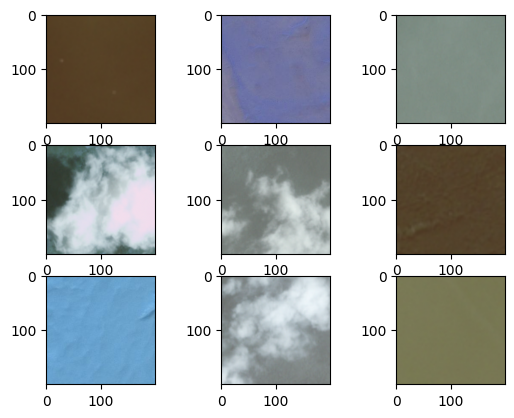

In [12]:
for i in range(0,9):
    plt.subplot(330 + 1 + i)
    img = X[i]
    plt.imshow(img)
    
plt.show()

In [17]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Activation, Conv2D, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
def allcnn(weights=None):
    model = Sequential()

    model.add(Conv2D(96, (3, 3), padding = 'same', input_shape=(200, 200, 3)))
    model.add(Activation('relu'))
    model.add(Conv2D(96, (3, 3), padding = 'same'))
    model.add(Activation('relu'))
    model.add(Conv2D(96, (3, 3), padding = 'same', strides = (2,2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(192, (3, 3), padding = 'same'))
    model.add(Activation('relu'))
    model.add(Conv2D(192, (3, 3), padding = 'same'))
    model.add(Activation('relu'))
    model.add(Conv2D(192, (3, 3), padding = 'same', strides = (2,2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(192, (3, 3), padding = 'same'))
    model.add(Activation('relu'))
    model.add(Conv2D(192, (1, 1), padding = 'valid'))
    model.add(Activation('relu'))
    model.add(Conv2D(4, (1, 1), padding = 'valid'))

    # add GlobalAveragePooling2D layer with Softmax activation
    model.add(GlobalAveragePooling2D())
    model.add(Activation('sigmoid'))
    
    if weights:
        model.load_weights(weights)
    
    return model

In [18]:
learning_rate = 0.01
weight_decay = 1e-6
momentum = 0.9

# build model 
model = allcnn()

# define optimizer and compile model
# sgd = Adam(lr=learning_rate, momentum=momentum, nesterov=True)
sgd = Adam()
model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

# print model summary
print (model.summary())

# define additional training parameters
epochs = 50
batch_size = 8

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executin

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executi

In [19]:

def training_with_gpu():
    model.fit(X, Y, validation_data=(x, y), epochs=epochs, batch_size=batch_size, verbose = 1, callbacks=[tensorboard])
training_with_gpu()

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapData

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteGraphSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
  1/634 [..............................] - ETA: 1:09:17 - loss: 1.3878 - accuracy: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/634 [..............................] - ETA: 1:17 - loss: 1.4214 - accuracy: 0.0625       Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_14

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/634 [>.............................] - ETA: 1:17 - loss: 1.0838 - accuracy: 0.4062Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/634 [>.............................] - ETA: 1:16 - loss: 1.0753 - accuracy: 0.4050Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/634 [>.............................] - ETA: 1:16 - loss: 1.0714 - accuracy: 0.4135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/634 [=>............................] - ETA: 1:14 - loss: 0.9280 - accuracy: 0.4583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/634 [=>............................] - ETA: 1:14 - loss: 0.9270 - accuracy: 0.4617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/634 [=>............................] - ETA: 1:13 - loss: 0.9238 - accuracy: 0.4650Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/634 [===>..........................] - ETA: 1:10 - loss: 0.8398 - accuracy: 0.5132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/634 [===>..........................] - ETA: 1:09 - loss: 0.8399 - accuracy: 0.5117Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/634 [===>..........................] - ETA: 1:09 - loss: 0.8384 - accuracy: 0.5103Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
119/634 [====>.........................] - ETA: 1:07 - loss: 0.8242 - accuracy: 0.5053Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
120/634 [====>.........................] - ETA: 1:06 - loss: 0.8234 - accuracy: 0.5042Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
121/634 [====>.........................] - ETA: 1:06 - loss: 0.8224 - accuracy: 0.5041Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
166/634 [======>.......................] - ETA: 1:01 - loss: 0.8131 - accuracy: 0.5158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
167/634 [======>.......................] - ETA: 1:00 - loss: 0.8124 - accuracy: 0.5165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
168/634 [======>.......................] - ETA: 1:00 - loss: 0.8111 - accuracy: 0.5186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
190/634 [=======>......................] - ETA: 57s - loss: 0.7997 - accuracy: 0.5224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
191/634 [========>.....................] - ETA: 57s - loss: 0.7987 - accuracy: 0.5242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
192/634 [========>.....................] - ETA: 57s - loss: 0.7985 - accuracy: 0.5254Executing op ReadVariableOp in device /job:local

237/634 [==========>...................] - ETA: 51s - loss: 0.7889 - accuracy: 0.5327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
238/634 [==========>...................] - ETA: 51s - loss: 0.7884 - accuracy: 0.5331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
239/634 [==========>...................] - ETA: 51s - loss: 0.7886 - accuracy: 0.5324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

261/634 [===========>..................] - ETA: 48s - loss: 0.8019 - accuracy: 0.5287Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
262/634 [===========>..................] - ETA: 48s - loss: 0.8020 - accuracy: 0.5281Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
263/634 [===========>..................] - ETA: 47s - loss: 0.8013 - accuracy: 0.5290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

285/634 [============>.................] - ETA: 45s - loss: 0.7924 - accuracy: 0.5307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
286/634 [============>.................] - ETA: 45s - loss: 0.7918 - accuracy: 0.5306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
287/634 [============>.................] - ETA: 45s - loss: 0.7935 - accuracy: 0.5301Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

309/634 [=============>................] - ETA: 42s - loss: 0.7900 - accuracy: 0.5287Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
310/634 [=============>................] - ETA: 42s - loss: 0.7900 - accuracy: 0.5282Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
311/634 [=============>................] - ETA: 42s - loss: 0.7896 - accuracy: 0.5285Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

333/634 [==============>...............] - ETA: 39s - loss: 0.7839 - accuracy: 0.5315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
334/634 [==============>...............] - ETA: 39s - loss: 0.7845 - accuracy: 0.5314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
335/634 [==============>...............] - ETA: 39s - loss: 0.7843 - accuracy: 0.5306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

357/634 [===============>..............] - ETA: 36s - loss: 0.7940 - accuracy: 0.5228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
358/634 [===============>..............] - ETA: 36s - loss: 0.7938 - accuracy: 0.5230Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
359/634 [===============>..............] - ETA: 36s - loss: 0.7938 - accuracy: 0.5237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

381/634 [=================>............] - ETA: 33s - loss: 0.7929 - accuracy: 0.5217Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
382/634 [=================>............] - ETA: 33s - loss: 0.7929 - accuracy: 0.5213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
383/634 [=================>............] - ETA: 33s - loss: 0.7927 - accuracy: 0.5212Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

405/634 [==================>...........] - ETA: 30s - loss: 0.7910 - accuracy: 0.5244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
406/634 [==================>...........] - ETA: 30s - loss: 0.7908 - accuracy: 0.5240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
407/634 [==================>...........] - ETA: 29s - loss: 0.7905 - accuracy: 0.5243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

429/634 [===================>..........] - ETA: 27s - loss: 0.7845 - accuracy: 0.5300Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
430/634 [===================>..........] - ETA: 26s - loss: 0.7841 - accuracy: 0.5302Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
431/634 [===================>..........] - ETA: 26s - loss: 0.7843 - accuracy: 0.5299Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

453/634 [====================>.........] - ETA: 23s - loss: 0.7908 - accuracy: 0.5317Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
454/634 [====================>.........] - ETA: 23s - loss: 0.7908 - accuracy: 0.5319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
455/634 [====================>.........] - ETA: 23s - loss: 0.7904 - accuracy: 0.5324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

477/634 [=====================>........] - ETA: 20s - loss: 0.7861 - accuracy: 0.5356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
478/634 [=====================>........] - ETA: 20s - loss: 0.7859 - accuracy: 0.5350Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
479/634 [=====================>........] - ETA: 20s - loss: 0.7854 - accuracy: 0.5355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

501/634 [======================>.......] - ETA: 17s - loss: 0.7833 - accuracy: 0.5389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
502/634 [======================>.......] - ETA: 17s - loss: 0.7829 - accuracy: 0.5393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
503/634 [======================>.......] - ETA: 17s - loss: 0.7825 - accuracy: 0.5398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

525/634 [=======================>......] - ETA: 14s - loss: 0.7759 - accuracy: 0.5438Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
526/634 [=======================>......] - ETA: 14s - loss: 0.7773 - accuracy: 0.5433Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
527/634 [=======================>......] - ETA: 14s - loss: 0.7770 - accuracy: 0.5434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

549/634 [========================>.....] - ETA: 11s - loss: 0.7716 - accuracy: 0.5485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
550/634 [=========================>....] - ETA: 11s - loss: 0.7714 - accuracy: 0.5482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
551/634 [=========================>....] - ETA: 11s - loss: 0.7711 - accuracy: 0.5483Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

573/634 [==========================>...] - ETA: 8s - loss: 0.7658 - accuracy: 0.5510Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
574/634 [==========================>...] - ETA: 7s - loss: 0.7661 - accuracy: 0.5507Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
575/634 [==========================>...] - ETA: 7s - loss: 0.7664 - accuracy: 0.5509Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

597/634 [===========================>..] - ETA: 4s - loss: 0.7616 - accuracy: 0.5551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
598/634 [===========================>..] - ETA: 4s - loss: 0.7617 - accuracy: 0.5550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
599/634 [===========================>..] - ETA: 4s - loss: 0.7614 - accuracy: 0.5549Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

621/634 [============================>.] - ETA: 1s - loss: 0.7557 - accuracy: 0.5580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
622/634 [============================>.] - ETA: 1s - loss: 0.7558 - accuracy: 0.5575Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
623/634 [============================>.] - ETA: 1s - loss: 0.7556 - accuracy: 0.5572Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

 12/634 [..............................] - ETA: 1:24 - loss: 0.7487 - accuracy: 0.5521Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 13/634 [..............................] - ETA: 1:23 - loss: 0.7235 - accuracy: 0.5673Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/634 [..............................] - ETA: 1:23 - loss: 0.7092 - accuracy: 0.5804Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/634 [>.............................] - ETA: 1:21 - loss: 0.6367 - accuracy: 0.6667Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 37/634 [>.............................] - ETA: 1:21 - loss: 0.6340 - accuracy: 0.6689Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 38/634 [>.............................] - ETA: 1:21 - loss: 0.6414 - accuracy: 0.6645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/634 [=>............................] - ETA: 1:17 - loss: 0.6431 - accuracy: 0.6604Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 61/634 [=>............................] - ETA: 1:17 - loss: 0.6423 - accuracy: 0.6578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 62/634 [=>............................] - ETA: 1:17 - loss: 0.6432 - accuracy: 0.6532Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
107/634 [====>.........................] - ETA: 1:11 - loss: 0.6476 - accuracy: 0.6449Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
108/634 [====>.........................] - ETA: 1:11 - loss: 0.6471 - accuracy: 0.6458Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
109/634 [====>.........................] - ETA: 1:10 - loss: 0.6458 - accuracy: 0.6468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
131/634 [=====>........................] - ETA: 1:08 - loss: 0.6511 - accuracy: 0.6527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
132/634 [=====>........................] - ETA: 1:07 - loss: 0.6501 - accuracy: 0.6534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
133/634 [=====>........................] - ETA: 1:07 - loss: 0.6508 - accuracy: 0.6532Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
178/634 [=======>......................] - ETA: 1:01 - loss: 0.6221 - accuracy: 0.6629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
179/634 [=======>......................] - ETA: 1:01 - loss: 0.6227 - accuracy: 0.6620Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
180/634 [=======>......................] - ETA: 1:01 - loss: 0.6220 - accuracy: 0.6632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
202/634 [========>.....................] - ETA: 58s - loss: 0.6290 - accuracy: 0.6609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
203/634 [========>.....................] - ETA: 58s - loss: 0.6295 - accuracy: 0.6601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
204/634 [========>.....................] - ETA: 58s - loss: 0.6293 - accuracy: 0.6605Executing op ReadVariableOp in device /job:local

249/634 [==========>...................] - ETA: 52s - loss: 0.6066 - accuracy: 0.6782Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
250/634 [==========>...................] - ETA: 52s - loss: 0.6057 - accuracy: 0.6790Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
251/634 [==========>...................] - ETA: 52s - loss: 0.6060 - accuracy: 0.6793Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

273/634 [===========>..................] - ETA: 49s - loss: 0.5986 - accuracy: 0.6873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
274/634 [===========>..................] - ETA: 48s - loss: 0.5990 - accuracy: 0.6870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
275/634 [============>.................] - ETA: 48s - loss: 0.5986 - accuracy: 0.6873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

297/634 [=============>................] - ETA: 45s - loss: 0.5963 - accuracy: 0.6894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
298/634 [=============>................] - ETA: 45s - loss: 0.5958 - accuracy: 0.6896Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
299/634 [=============>................] - ETA: 45s - loss: 0.5958 - accuracy: 0.6894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

321/634 [==============>...............] - ETA: 42s - loss: 0.5886 - accuracy: 0.6939Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
322/634 [==============>...............] - ETA: 42s - loss: 0.5876 - accuracy: 0.6949Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
323/634 [==============>...............] - ETA: 42s - loss: 0.5882 - accuracy: 0.6943Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

345/634 [===============>..............] - ETA: 39s - loss: 0.5913 - accuracy: 0.7022Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
346/634 [===============>..............] - ETA: 39s - loss: 0.5929 - accuracy: 0.7016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
347/634 [===============>..............] - ETA: 39s - loss: 0.5940 - accuracy: 0.7010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

369/634 [================>.............] - ETA: 36s - loss: 0.6065 - accuracy: 0.6951Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
370/634 [================>.............] - ETA: 35s - loss: 0.6066 - accuracy: 0.6949Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
371/634 [================>.............] - ETA: 35s - loss: 0.6069 - accuracy: 0.6947Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

393/634 [=================>............] - ETA: 32s - loss: 0.6142 - accuracy: 0.6912Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
394/634 [=================>............] - ETA: 32s - loss: 0.6140 - accuracy: 0.6910Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
395/634 [=================>............] - ETA: 32s - loss: 0.6139 - accuracy: 0.6915Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

417/634 [==================>...........] - ETA: 29s - loss: 0.6136 - accuracy: 0.6903Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
418/634 [==================>...........] - ETA: 29s - loss: 0.6141 - accuracy: 0.6902Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
419/634 [==================>...........] - ETA: 29s - loss: 0.6146 - accuracy: 0.6891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

441/634 [===================>..........] - ETA: 26s - loss: 0.6217 - accuracy: 0.6840Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
442/634 [===================>..........] - ETA: 26s - loss: 0.6219 - accuracy: 0.6838Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
443/634 [===================>..........] - ETA: 26s - loss: 0.6221 - accuracy: 0.6834Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

465/634 [=====================>........] - ETA: 23s - loss: 0.6240 - accuracy: 0.6833Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
466/634 [=====================>........] - ETA: 22s - loss: 0.6238 - accuracy: 0.6835Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
467/634 [=====================>........] - ETA: 22s - loss: 0.6236 - accuracy: 0.6836Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

489/634 [======================>.......] - ETA: 19s - loss: 0.6247 - accuracy: 0.6846Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
490/634 [======================>.......] - ETA: 19s - loss: 0.6250 - accuracy: 0.6839Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
491/634 [======================>.......] - ETA: 19s - loss: 0.6253 - accuracy: 0.6833Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

513/634 [=======================>......] - ETA: 16s - loss: 0.6255 - accuracy: 0.6823Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
514/634 [=======================>......] - ETA: 16s - loss: 0.6253 - accuracy: 0.6821Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
515/634 [=======================>......] - ETA: 16s - loss: 0.6250 - accuracy: 0.6828Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

537/634 [========================>.....] - ETA: 13s - loss: 0.6212 - accuracy: 0.6848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
538/634 [========================>.....] - ETA: 13s - loss: 0.6206 - accuracy: 0.6852Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
539/634 [========================>.....] - ETA: 12s - loss: 0.6204 - accuracy: 0.6853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

561/634 [=========================>....] - ETA: 9s - loss: 0.6178 - accuracy: 0.6861 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
562/634 [=========================>....] - ETA: 9s - loss: 0.6184 - accuracy: 0.6859Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
563/634 [=========================>....] - ETA: 9s - loss: 0.6181 - accuracy: 0.6863Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localho

585/634 [==========================>...] - ETA: 6s - loss: 0.6166 - accuracy: 0.6870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
586/634 [==========================>...] - ETA: 6s - loss: 0.6164 - accuracy: 0.6869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
587/634 [==========================>...] - ETA: 6s - loss: 0.6160 - accuracy: 0.6872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

609/634 [===========================>..] - ETA: 3s - loss: 0.6155 - accuracy: 0.6856Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
610/634 [===========================>..] - ETA: 3s - loss: 0.6153 - accuracy: 0.6857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
611/634 [===========================>..] - ETA: 3s - loss: 0.6162 - accuracy: 0.6858Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

633/634 [============================>.] - ETA: 0s - loss: 0.6132 - accuracy: 0.6856Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
634/634 [==============================] - ETA: 0s - loss: 0.6131 - accuracy: 0.6858Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  5/634 [..............................] - ETA: 1:30 - loss: 0.6770 - accuracy: 0.6750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/634 [..............................] - ETA: 1:30 - loss: 0.6390 - accuracy: 0.7083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/634 [..............................] - ETA: 1:30 - loss: 0.6165 - accuracy: 0.7321Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 52/634 [=>............................] - ETA: 1:20 - loss: 0.6836 - accuracy: 0.7091Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/634 [=>............................] - ETA: 1:20 - loss: 0.6786 - accuracy: 0.7146Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/634 [=>............................] - ETA: 1:20 - loss: 0.6762 - accuracy: 0.7153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 76/634 [==>...........................] - ETA: 1:16 - loss: 0.6313 - accuracy: 0.7303Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/634 [==>...........................] - ETA: 1:16 - loss: 0.6291 - accuracy: 0.7321Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/634 [==>...........................] - ETA: 1:16 - loss: 0.6238 - accuracy: 0.7340Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
123/634 [====>.........................] - ETA: 1:10 - loss: 0.6503 - accuracy: 0.6992Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
124/634 [====>.........................] - ETA: 1:10 - loss: 0.6494 - accuracy: 0.6986Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
125/634 [====>.........................] - ETA: 1:10 - loss: 0.6478 - accuracy: 0.6990Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
147/634 [=====>........................] - ETA: 1:07 - loss: 0.6286 - accuracy: 0.7024Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
148/634 [======>.......................] - ETA: 1:06 - loss: 0.6265 - accuracy: 0.7035Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
149/634 [======>.......................] - ETA: 1:06 - loss: 0.6255 - accuracy: 0.7047Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
194/634 [========>.....................] - ETA: 1:00 - loss: 0.6143 - accuracy: 0.7010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
195/634 [========>.....................] - ETA: 1:00 - loss: 0.6145 - accuracy: 0.7006Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
196/634 [========>.....................] - ETA: 1:00 - loss: 0.6143 - accuracy: 0.7003Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
218/634 [=========>....................] - ETA: 57s - loss: 0.6052 - accuracy: 0.7030Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
219/634 [=========>....................] - ETA: 57s - loss: 0.6036 - accuracy: 0.7043Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
220/634 [=========>....................] - ETA: 56s - loss: 0.6028 - accuracy: 0.7045Executing op ReadVariableOp in device /job:local

265/634 [===========>..................] - ETA: 50s - loss: 0.6217 - accuracy: 0.6892Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
266/634 [===========>..................] - ETA: 50s - loss: 0.6215 - accuracy: 0.6884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
267/634 [===========>..................] - ETA: 50s - loss: 0.6214 - accuracy: 0.6882Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

289/634 [============>.................] - ETA: 47s - loss: 0.6217 - accuracy: 0.6834Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
290/634 [============>.................] - ETA: 47s - loss: 0.6216 - accuracy: 0.6836Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
291/634 [============>.................] - ETA: 47s - loss: 0.6208 - accuracy: 0.6843Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

313/634 [=============>................] - ETA: 43s - loss: 0.6112 - accuracy: 0.6917Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
314/634 [=============>................] - ETA: 43s - loss: 0.6104 - accuracy: 0.6923Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
315/634 [=============>................] - ETA: 43s - loss: 0.6103 - accuracy: 0.6917Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

337/634 [==============>...............] - ETA: 40s - loss: 0.5981 - accuracy: 0.6984Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
338/634 [==============>...............] - ETA: 40s - loss: 0.5975 - accuracy: 0.6990Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
339/634 [===============>..............] - ETA: 40s - loss: 0.5965 - accuracy: 0.6995Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

361/634 [================>.............] - ETA: 37s - loss: 0.6003 - accuracy: 0.6953Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
362/634 [================>.............] - ETA: 37s - loss: 0.6000 - accuracy: 0.6951Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
363/634 [================>.............] - ETA: 37s - loss: 0.5993 - accuracy: 0.6956Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

385/634 [=================>............] - ETA: 34s - loss: 0.6019 - accuracy: 0.6942Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
386/634 [=================>............] - ETA: 33s - loss: 0.6016 - accuracy: 0.6943Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
387/634 [=================>............] - ETA: 33s - loss: 0.6024 - accuracy: 0.6932Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

409/634 [==================>...........] - ETA: 30s - loss: 0.5990 - accuracy: 0.6922Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
410/634 [==================>...........] - ETA: 30s - loss: 0.5985 - accuracy: 0.6924Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
411/634 [==================>...........] - ETA: 30s - loss: 0.5975 - accuracy: 0.6931Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

433/634 [===================>..........] - ETA: 27s - loss: 0.5910 - accuracy: 0.6966Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
434/634 [===================>..........] - ETA: 27s - loss: 0.5909 - accuracy: 0.6967Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
435/634 [===================>..........] - ETA: 27s - loss: 0.5903 - accuracy: 0.6968Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

457/634 [====================>.........] - ETA: 24s - loss: 0.5878 - accuracy: 0.6950Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
458/634 [====================>.........] - ETA: 24s - loss: 0.5875 - accuracy: 0.6954Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
459/634 [====================>.........] - ETA: 23s - loss: 0.5869 - accuracy: 0.6961Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

481/634 [=====================>........] - ETA: 20s - loss: 0.5840 - accuracy: 0.6962Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
482/634 [=====================>........] - ETA: 20s - loss: 0.5835 - accuracy: 0.6966Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
483/634 [=====================>........] - ETA: 20s - loss: 0.5830 - accuracy: 0.6967Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

505/634 [======================>.......] - ETA: 17s - loss: 0.5805 - accuracy: 0.6973Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
506/634 [======================>.......] - ETA: 17s - loss: 0.5811 - accuracy: 0.6969Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
507/634 [======================>.......] - ETA: 17s - loss: 0.5810 - accuracy: 0.6972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

529/634 [========================>.....] - ETA: 14s - loss: 0.5817 - accuracy: 0.6968Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
530/634 [========================>.....] - ETA: 14s - loss: 0.5818 - accuracy: 0.6965Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
531/634 [========================>.....] - ETA: 14s - loss: 0.5820 - accuracy: 0.6961Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

553/634 [=========================>....] - ETA: 11s - loss: 0.5804 - accuracy: 0.6937Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
554/634 [=========================>....] - ETA: 10s - loss: 0.5801 - accuracy: 0.6943Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
555/634 [=========================>....] - ETA: 10s - loss: 0.5801 - accuracy: 0.6941Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

577/634 [==========================>...] - ETA: 7s - loss: 0.5758 - accuracy: 0.6952Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
578/634 [==========================>...] - ETA: 7s - loss: 0.5760 - accuracy: 0.6951Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
579/634 [==========================>...] - ETA: 7s - loss: 0.5760 - accuracy: 0.6952Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

601/634 [===========================>..] - ETA: 4s - loss: 0.5722 - accuracy: 0.6963Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
602/634 [===========================>..] - ETA: 4s - loss: 0.5723 - accuracy: 0.6962Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
603/634 [===========================>..] - ETA: 4s - loss: 0.5729 - accuracy: 0.6961Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

625/634 [============================>.] - ETA: 1s - loss: 0.5697 - accuracy: 0.6980Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
626/634 [============================>.] - ETA: 1s - loss: 0.5696 - accuracy: 0.6975Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
627/634 [============================>.] - ETA: 0s - loss: 0.5701 - accuracy: 0.6972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
634/634 [==============================] - 90s 142ms/step - loss: 0.5693 - accuracy: 0.6973 - val_loss: 0.6159 - val_accuracy: 0.6206
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repl

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/634 [=>............................] - ETA: 1:21 - loss: 0.5450 - accuracy: 0.7301Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 45/634 [=>............................] - ETA: 1:21 - loss: 0.5429 - accuracy: 0.7306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/634 [=>............................] - ETA: 1:21 - loss: 0.5658 - accuracy: 0.7310Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/634 [==>...........................] - ETA: 1:18 - loss: 0.5727 - accuracy: 0.6930Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/634 [==>...........................] - ETA: 1:17 - loss: 0.5729 - accuracy: 0.6902Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/634 [==>...........................] - ETA: 1:17 - loss: 0.5705 - accuracy: 0.6893Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
115/634 [====>.........................] - ETA: 1:11 - loss: 0.5674 - accuracy: 0.6859Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
116/634 [====>.........................] - ETA: 1:11 - loss: 0.5669 - accuracy: 0.6853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
117/634 [====>.........................] - ETA: 1:11 - loss: 0.5636 - accuracy: 0.6870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
139/634 [=====>........................] - ETA: 1:08 - loss: 0.5512 - accuracy: 0.6888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
140/634 [=====>........................] - ETA: 1:08 - loss: 0.5498 - accuracy: 0.6911Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
141/634 [=====>........................] - ETA: 1:07 - loss: 0.5480 - accuracy: 0.6924Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
186/634 [=======>......................] - ETA: 1:01 - loss: 0.5324 - accuracy: 0.6942Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
187/634 [=======>......................] - ETA: 1:01 - loss: 0.5314 - accuracy: 0.6945Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
188/634 [=======>......................] - ETA: 1:01 - loss: 0.5302 - accuracy: 0.6955Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
210/634 [========>.....................] - ETA: 58s - loss: 0.5315 - accuracy: 0.6952Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
211/634 [========>.....................] - ETA: 58s - loss: 0.5329 - accuracy: 0.6937Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
212/634 [=========>....................] - ETA: 58s - loss: 0.5318 - accuracy: 0.6946Executing op ReadVariableOp in device /job:local

257/634 [===========>..................] - ETA: 52s - loss: 0.5262 - accuracy: 0.7057Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
258/634 [===========>..................] - ETA: 51s - loss: 0.5258 - accuracy: 0.7054Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
259/634 [===========>..................] - ETA: 51s - loss: 0.5264 - accuracy: 0.7051Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

281/634 [============>.................] - ETA: 48s - loss: 0.5235 - accuracy: 0.7069Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
282/634 [============>.................] - ETA: 48s - loss: 0.5227 - accuracy: 0.7074Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
283/634 [============>.................] - ETA: 48s - loss: 0.5225 - accuracy: 0.7076Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

305/634 [=============>................] - ETA: 45s - loss: 0.5244 - accuracy: 0.7033Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
306/634 [=============>................] - ETA: 45s - loss: 0.5242 - accuracy: 0.7026Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
307/634 [=============>................] - ETA: 45s - loss: 0.5245 - accuracy: 0.7020Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

329/634 [==============>...............] - ETA: 41s - loss: 0.5247 - accuracy: 0.7017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
330/634 [==============>...............] - ETA: 41s - loss: 0.5241 - accuracy: 0.7019Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
331/634 [==============>...............] - ETA: 41s - loss: 0.5239 - accuracy: 0.7020Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

353/634 [===============>..............] - ETA: 38s - loss: 0.5256 - accuracy: 0.7008Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
354/634 [===============>..............] - ETA: 38s - loss: 0.5251 - accuracy: 0.7013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
355/634 [===============>..............] - ETA: 38s - loss: 0.5251 - accuracy: 0.7018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

377/634 [================>.............] - ETA: 35s - loss: 0.5303 - accuracy: 0.6983Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
378/634 [================>.............] - ETA: 35s - loss: 0.5309 - accuracy: 0.6978Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
379/634 [================>.............] - ETA: 35s - loss: 0.5306 - accuracy: 0.6985Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

401/634 [=================>............] - ETA: 31s - loss: 0.5290 - accuracy: 0.7011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
402/634 [==================>...........] - ETA: 31s - loss: 0.5285 - accuracy: 0.7015Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
403/634 [==================>...........] - ETA: 31s - loss: 0.5291 - accuracy: 0.7007Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

425/634 [===================>..........] - ETA: 28s - loss: 0.5251 - accuracy: 0.7044Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
426/634 [===================>..........] - ETA: 28s - loss: 0.5249 - accuracy: 0.7045Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
427/634 [===================>..........] - ETA: 28s - loss: 0.5243 - accuracy: 0.7052Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

449/634 [====================>.........] - ETA: 25s - loss: 0.5215 - accuracy: 0.7066Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
450/634 [====================>.........] - ETA: 25s - loss: 0.5212 - accuracy: 0.7064Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
451/634 [====================>.........] - ETA: 25s - loss: 0.5208 - accuracy: 0.7070Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

473/634 [=====================>........] - ETA: 22s - loss: 0.5191 - accuracy: 0.7077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
474/634 [=====================>........] - ETA: 21s - loss: 0.5213 - accuracy: 0.7073Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
475/634 [=====================>........] - ETA: 21s - loss: 0.5216 - accuracy: 0.7066Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

497/634 [======================>.......] - ETA: 18s - loss: 0.5245 - accuracy: 0.7027Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
498/634 [======================>.......] - ETA: 18s - loss: 0.5244 - accuracy: 0.7026Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
499/634 [======================>.......] - ETA: 18s - loss: 0.5241 - accuracy: 0.7029Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

521/634 [=======================>......] - ETA: 15s - loss: 0.5220 - accuracy: 0.7054Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
522/634 [=======================>......] - ETA: 15s - loss: 0.5217 - accuracy: 0.7055Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
523/634 [=======================>......] - ETA: 15s - loss: 0.5216 - accuracy: 0.7058Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

545/634 [========================>.....] - ETA: 12s - loss: 0.5268 - accuracy: 0.7057Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
546/634 [========================>.....] - ETA: 12s - loss: 0.5270 - accuracy: 0.7058Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
547/634 [========================>.....] - ETA: 11s - loss: 0.5269 - accuracy: 0.7059Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

569/634 [=========================>....] - ETA: 8s - loss: 0.5263 - accuracy: 0.7072Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
570/634 [=========================>....] - ETA: 8s - loss: 0.5266 - accuracy: 0.7070Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
571/634 [==========================>...] - ETA: 8s - loss: 0.5269 - accuracy: 0.7069Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

593/634 [===========================>..] - ETA: 5s - loss: 0.5258 - accuracy: 0.7070Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
594/634 [===========================>..] - ETA: 5s - loss: 0.5258 - accuracy: 0.7066Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
595/634 [===========================>..] - ETA: 5s - loss: 0.5258 - accuracy: 0.7065Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

617/634 [============================>.] - ETA: 2s - loss: 0.5246 - accuracy: 0.7052Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
618/634 [============================>.] - ETA: 2s - loss: 0.5242 - accuracy: 0.7053Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
619/634 [============================>.] - ETA: 2s - loss: 0.5244 - accuracy: 0.7052Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/tas

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 13/634 [..............................] - ETA: 1:23 - loss: 0.6060 - accuracy: 0.6250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/634 [..............................] - ETA: 1:24 - loss: 0.6021 - accuracy: 0.6339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 15/634 [..............................] - ETA: 1:24 - loss: 0.7046 - accuracy: 0.6333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 37/634 [>.............................] - ETA: 1:21 - loss: 0.6005 - accuracy: 0.6622Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 38/634 [>.............................] - ETA: 1:21 - loss: 0.5971 - accuracy: 0.6612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 39/634 [>.............................] - ETA: 1:21 - loss: 0.5972 - accuracy: 0.6571Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/634 [==>...........................] - ETA: 1:15 - loss: 0.5461 - accuracy: 0.6860Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 85/634 [===>..........................] - ETA: 1:15 - loss: 0.5436 - accuracy: 0.6882Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/634 [===>..........................] - ETA: 1:14 - loss: 0.5405 - accuracy: 0.6904Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
108/634 [====>.........................] - ETA: 1:11 - loss: 0.5367 - accuracy: 0.6887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
109/634 [====>.........................] - ETA: 1:11 - loss: 0.5415 - accuracy: 0.6869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
110/634 [====>.........................] - ETA: 1:11 - loss: 0.5440 - accuracy: 0.6864Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
155/634 [======>.......................] - ETA: 1:05 - loss: 0.5381 - accuracy: 0.6863Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
156/634 [======>.......................] - ETA: 1:05 - loss: 0.5379 - accuracy: 0.6859Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
157/634 [======>.......................] - ETA: 1:05 - loss: 0.5392 - accuracy: 0.6847Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
179/634 [=======>......................] - ETA: 1:02 - loss: 0.5379 - accuracy: 0.6913Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
180/634 [=======>......................] - ETA: 1:01 - loss: 0.5373 - accuracy: 0.6924Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
181/634 [=======>......................] - ETA: 1:01 - loss: 0.5378 - accuracy: 0.6920Executing op ReadVariableOp in device /job:lo

226/634 [=========>....................] - ETA: 55s - loss: 0.5325 - accuracy: 0.6997Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
227/634 [=========>....................] - ETA: 55s - loss: 0.5330 - accuracy: 0.6993Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
228/634 [=========>....................] - ETA: 55s - loss: 0.5329 - accuracy: 0.6990Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

250/634 [==========>...................] - ETA: 52s - loss: 0.5323 - accuracy: 0.6985Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
251/634 [==========>...................] - ETA: 52s - loss: 0.5320 - accuracy: 0.6987Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
252/634 [==========>...................] - ETA: 52s - loss: 0.5313 - accuracy: 0.6994Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

274/634 [===========>..................] - ETA: 49s - loss: 0.5298 - accuracy: 0.7044Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
275/634 [============>.................] - ETA: 48s - loss: 0.5291 - accuracy: 0.7050Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
276/634 [============>.................] - ETA: 48s - loss: 0.5286 - accuracy: 0.7047Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

298/634 [=============>................] - ETA: 45s - loss: 0.5338 - accuracy: 0.7001Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
299/634 [=============>................] - ETA: 45s - loss: 0.5335 - accuracy: 0.6998Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
300/634 [=============>................] - ETA: 45s - loss: 0.5334 - accuracy: 0.7000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

322/634 [==============>...............] - ETA: 42s - loss: 0.5318 - accuracy: 0.6976Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
323/634 [==============>...............] - ETA: 42s - loss: 0.5310 - accuracy: 0.6978Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
324/634 [==============>...............] - ETA: 42s - loss: 0.5315 - accuracy: 0.6979Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

346/634 [===============>..............] - ETA: 39s - loss: 0.5300 - accuracy: 0.7016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
347/634 [===============>..............] - ETA: 39s - loss: 0.5305 - accuracy: 0.7010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
348/634 [===============>..............] - ETA: 39s - loss: 0.5306 - accuracy: 0.7004Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

370/634 [================>.............] - ETA: 36s - loss: 0.5275 - accuracy: 0.7014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
371/634 [================>.............] - ETA: 35s - loss: 0.5276 - accuracy: 0.7011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
372/634 [================>.............] - ETA: 35s - loss: 0.5278 - accuracy: 0.7006Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

394/634 [=================>............] - ETA: 32s - loss: 0.5270 - accuracy: 0.7008Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
395/634 [=================>............] - ETA: 32s - loss: 0.5271 - accuracy: 0.7006Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
396/634 [=================>............] - ETA: 32s - loss: 0.5272 - accuracy: 0.7001Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

418/634 [==================>...........] - ETA: 29s - loss: 0.5276 - accuracy: 0.7010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
419/634 [==================>...........] - ETA: 29s - loss: 0.5269 - accuracy: 0.7017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
420/634 [==================>...........] - ETA: 29s - loss: 0.5265 - accuracy: 0.7018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

442/634 [===================>..........] - ETA: 26s - loss: 0.5228 - accuracy: 0.7050Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
443/634 [===================>..........] - ETA: 26s - loss: 0.5228 - accuracy: 0.7051Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
444/634 [====================>.........] - ETA: 25s - loss: 0.5226 - accuracy: 0.7052Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

466/634 [=====================>........] - ETA: 22s - loss: 0.5224 - accuracy: 0.7065Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
467/634 [=====================>........] - ETA: 22s - loss: 0.5225 - accuracy: 0.7064Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
468/634 [=====================>........] - ETA: 22s - loss: 0.5226 - accuracy: 0.7065Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

490/634 [======================>.......] - ETA: 19s - loss: 0.5236 - accuracy: 0.7066Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
491/634 [======================>.......] - ETA: 19s - loss: 0.5236 - accuracy: 0.7065Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
492/634 [======================>.......] - ETA: 19s - loss: 0.5237 - accuracy: 0.7066Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

514/634 [=======================>......] - ETA: 16s - loss: 0.5226 - accuracy: 0.7077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
515/634 [=======================>......] - ETA: 16s - loss: 0.5225 - accuracy: 0.7075Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
516/634 [=======================>......] - ETA: 16s - loss: 0.5227 - accuracy: 0.7078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

538/634 [========================>.....] - ETA: 13s - loss: 0.5219 - accuracy: 0.7075Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
539/634 [========================>.....] - ETA: 12s - loss: 0.5216 - accuracy: 0.7078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
540/634 [========================>.....] - ETA: 12s - loss: 0.5210 - accuracy: 0.7081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

562/634 [=========================>....] - ETA: 9s - loss: 0.5196 - accuracy: 0.7100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
563/634 [=========================>....] - ETA: 9s - loss: 0.5197 - accuracy: 0.7098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
564/634 [=========================>....] - ETA: 9s - loss: 0.5198 - accuracy: 0.7094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

586/634 [==========================>...] - ETA: 6s - loss: 0.5179 - accuracy: 0.7103Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
587/634 [==========================>...] - ETA: 6s - loss: 0.5176 - accuracy: 0.7102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
588/634 [==========================>...] - ETA: 6s - loss: 0.5176 - accuracy: 0.7105Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

610/634 [===========================>..] - ETA: 3s - loss: 0.5185 - accuracy: 0.7117Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
611/634 [===========================>..] - ETA: 3s - loss: 0.5197 - accuracy: 0.7109Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
612/634 [===========================>..] - ETA: 3s - loss: 0.5195 - accuracy: 0.7110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

634/634 [==============================] - ETA: 0s - loss: 0.5196 - accuracy: 0.7115Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/634 [..............................] - ETA: 1:22 - loss: 0.4962 - accuracy: 0.7917Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/634 [..............................] - ETA: 1:23 - loss: 0.5053 - accuracy: 0.7679Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:24 - loss: 0.4761 - accuracy: 0.7969Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/634 [=>............................] - ETA: 1:20 - loss: 0.4792 - accuracy: 0.7264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/634 [=>............................] - ETA: 1:20 - loss: 0.4775 - accuracy: 0.7269Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/634 [=>............................] - ETA: 1:20 - loss: 0.4760 - accuracy: 0.7250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/634 [==>...........................] - ETA: 1:16 - loss: 0.4811 - accuracy: 0.7110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/634 [==>...........................] - ETA: 1:16 - loss: 0.4845 - accuracy: 0.7115Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:16 - loss: 0.4829 - accuracy: 0.7120Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
124/634 [====>.........................] - ETA: 1:10 - loss: 0.4657 - accuracy: 0.7308Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
125/634 [====>.........................] - ETA: 1:10 - loss: 0.4663 - accuracy: 0.7310Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
126/634 [====>.........................] - ETA: 1:10 - loss: 0.4668 - accuracy: 0.7312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
148/634 [======>.......................] - ETA: 1:07 - loss: 0.4685 - accuracy: 0.7323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
149/634 [======>.......................] - ETA: 1:06 - loss: 0.4681 - accuracy: 0.7324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 1:06 - loss: 0.4662 - accuracy: 0.7342Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
195/634 [========>.....................] - ETA: 1:00 - loss: 0.4737 - accuracy: 0.7340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
196/634 [========>.....................] - ETA: 1:00 - loss: 0.4740 - accuracy: 0.7334Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
197/634 [========>.....................] - ETA: 1:00 - loss: 0.4731 - accuracy: 0.7335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
219/634 [=========>....................] - ETA: 57s - loss: 0.4808 - accuracy: 0.7306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
220/634 [=========>....................] - ETA: 57s - loss: 0.4804 - accuracy: 0.7307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
221/634 [=========>....................] - ETA: 57s - loss: 0.4811 - accuracy: 0.7296Executing op ReadVariableOp in device /job:local

266/634 [===========>..................] - ETA: 51s - loss: 0.4841 - accuracy: 0.7331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
267/634 [===========>..................] - ETA: 50s - loss: 0.4842 - accuracy: 0.7327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
268/634 [===========>..................] - ETA: 50s - loss: 0.4841 - accuracy: 0.7327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

290/634 [============>.................] - ETA: 47s - loss: 0.4850 - accuracy: 0.7306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
291/634 [============>.................] - ETA: 47s - loss: 0.4854 - accuracy: 0.7307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
292/634 [============>.................] - ETA: 47s - loss: 0.4852 - accuracy: 0.7307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

314/634 [=============>................] - ETA: 44s - loss: 0.4882 - accuracy: 0.7301Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
315/634 [=============>................] - ETA: 44s - loss: 0.4906 - accuracy: 0.7290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
316/634 [=============>................] - ETA: 44s - loss: 0.4906 - accuracy: 0.7294Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

338/634 [==============>...............] - ETA: 41s - loss: 0.4893 - accuracy: 0.7274Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
339/634 [===============>..............] - ETA: 41s - loss: 0.4890 - accuracy: 0.7279Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
340/634 [===============>..............] - ETA: 40s - loss: 0.4890 - accuracy: 0.7279Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

362/634 [================>.............] - ETA: 37s - loss: 0.4923 - accuracy: 0.7279Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
363/634 [================>.............] - ETA: 37s - loss: 0.4931 - accuracy: 0.7280Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
364/634 [================>.............] - ETA: 37s - loss: 0.4932 - accuracy: 0.7273Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

386/634 [=================>............] - ETA: 34s - loss: 0.4967 - accuracy: 0.7286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
387/634 [=================>............] - ETA: 34s - loss: 0.4967 - accuracy: 0.7290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
388/634 [=================>............] - ETA: 34s - loss: 0.4965 - accuracy: 0.7291Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

410/634 [==================>...........] - ETA: 31s - loss: 0.4999 - accuracy: 0.7277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
411/634 [==================>...........] - ETA: 31s - loss: 0.4998 - accuracy: 0.7281Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
412/634 [==================>...........] - ETA: 30s - loss: 0.4992 - accuracy: 0.7285Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

434/634 [===================>..........] - ETA: 27s - loss: 0.4993 - accuracy: 0.7293Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
435/634 [===================>..........] - ETA: 27s - loss: 0.4989 - accuracy: 0.7293Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
436/634 [===================>..........] - ETA: 27s - loss: 0.4992 - accuracy: 0.7294Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

458/634 [====================>.........] - ETA: 24s - loss: 0.4966 - accuracy: 0.7312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
459/634 [====================>.........] - ETA: 24s - loss: 0.4966 - accuracy: 0.7312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
460/634 [====================>.........] - ETA: 24s - loss: 0.4967 - accuracy: 0.7312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

482/634 [=====================>........] - ETA: 21s - loss: 0.4962 - accuracy: 0.7355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
483/634 [=====================>........] - ETA: 20s - loss: 0.4962 - accuracy: 0.7355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
484/634 [=====================>........] - ETA: 20s - loss: 0.4960 - accuracy: 0.7358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

506/634 [======================>.......] - ETA: 17s - loss: 0.4996 - accuracy: 0.7347Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
507/634 [======================>.......] - ETA: 17s - loss: 0.4994 - accuracy: 0.7352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
508/634 [=======================>......] - ETA: 17s - loss: 0.4991 - accuracy: 0.7355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

530/634 [========================>.....] - ETA: 14s - loss: 0.4968 - accuracy: 0.7384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
531/634 [========================>.....] - ETA: 14s - loss: 0.4967 - accuracy: 0.7387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
532/634 [========================>.....] - ETA: 14s - loss: 0.4965 - accuracy: 0.7390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

554/634 [=========================>....] - ETA: 11s - loss: 0.4929 - accuracy: 0.7419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
555/634 [=========================>....] - ETA: 10s - loss: 0.4925 - accuracy: 0.7421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
556/634 [=========================>....] - ETA: 10s - loss: 0.4927 - accuracy: 0.7419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

578/634 [==========================>...] - ETA: 7s - loss: 0.4923 - accuracy: 0.7418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
579/634 [==========================>...] - ETA: 7s - loss: 0.4926 - accuracy: 0.7414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
580/634 [==========================>...] - ETA: 7s - loss: 0.4926 - accuracy: 0.7414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

602/634 [===========================>..] - ETA: 4s - loss: 0.4919 - accuracy: 0.7429Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
603/634 [===========================>..] - ETA: 4s - loss: 0.4919 - accuracy: 0.7427Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
604/634 [===========================>..] - ETA: 4s - loss: 0.4919 - accuracy: 0.7428Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

626/634 [============================>.] - ETA: 1s - loss: 0.4854 - accuracy: 0.7472Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
627/634 [============================>.] - ETA: 0s - loss: 0.4849 - accuracy: 0.7476Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
628/634 [============================>.] - ETA: 0s - loss: 0.4848 - accuracy: 0.7478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
634/634 [==============================] - 91s 144ms/step - loss: 0.4859 - accuracy: 0.7480 - val_loss: 0.3945 - val_accuracy: 0.8050
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 7/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/634 [>.............................] - ETA: 1:26 - loss: 0.3854 - accuracy: 0.8125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/634 [>.............................] - ETA: 1:26 - loss: 0.3803 - accuracy: 0.8152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/634 [>.............................] - ETA: 1:26 - loss: 0.3667 - accuracy: 0.8229Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/634 [==>...........................] - ETA: 1:21 - loss: 0.4217 - accuracy: 0.8261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/634 [==>...........................] - ETA: 1:20 - loss: 0.4215 - accuracy: 0.8268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/634 [==>...........................] - ETA: 1:20 - loss: 0.4194 - accuracy: 0.8275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/634 [===>..........................] - ETA: 1:17 - loss: 0.4139 - accuracy: 0.8253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/634 [===>..........................] - ETA: 1:17 - loss: 0.4108 - accuracy: 0.8271Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/634 [===>..........................] - ETA: 1:17 - loss: 0.4092 - accuracy: 0.8276Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
140/634 [=====>........................] - ETA: 1:10 - loss: 0.4461 - accuracy: 0.7973Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
141/634 [=====>........................] - ETA: 1:10 - loss: 0.4458 - accuracy: 0.7970Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
142/634 [=====>........................] - ETA: 1:09 - loss: 0.4440 - accuracy: 0.7975Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
164/634 [======>.......................] - ETA: 1:06 - loss: 0.4354 - accuracy: 0.8026Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
165/634 [======>.......................] - ETA: 1:06 - loss: 0.4339 - accuracy: 0.8038Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
166/634 [======>.......................] - ETA: 1:06 - loss: 0.4326 - accuracy: 0.8050Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
211/634 [========>.....................] - ETA: 59s - loss: 0.4175 - accuracy: 0.8140Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
212/634 [=========>....................] - ETA: 59s - loss: 0.4164 - accuracy: 0.8149Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
213/634 [=========>....................] - ETA: 59s - loss: 0.4152 - accuracy: 0.8157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
235/634 [==========>...................] - ETA: 56s - loss: 0.4254 - accuracy: 0.8106Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
236/634 [==========>...................] - ETA: 56s - loss: 0.4264 - accuracy: 0.8104Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
237/634 [==========>...................] - ETA: 55s - loss: 0.4293 - accuracy: 0.8096Executing op ReadVariableOp in device /job:local

282/634 [============>.................] - ETA: 49s - loss: 0.4359 - accuracy: 0.8023Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
283/634 [============>.................] - ETA: 49s - loss: 0.4384 - accuracy: 0.8008Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
284/634 [============>.................] - ETA: 49s - loss: 0.4378 - accuracy: 0.8006Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

306/634 [=============>................] - ETA: 46s - loss: 0.4370 - accuracy: 0.7982Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
307/634 [=============>................] - ETA: 45s - loss: 0.4363 - accuracy: 0.7985Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
308/634 [=============>................] - ETA: 45s - loss: 0.4366 - accuracy: 0.7983Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

330/634 [==============>...............] - ETA: 42s - loss: 0.4433 - accuracy: 0.7966Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
331/634 [==============>...............] - ETA: 42s - loss: 0.4439 - accuracy: 0.7961Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
332/634 [==============>...............] - ETA: 42s - loss: 0.4440 - accuracy: 0.7956Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

354/634 [===============>..............] - ETA: 39s - loss: 0.4402 - accuracy: 0.7991Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
355/634 [===============>..............] - ETA: 39s - loss: 0.4394 - accuracy: 0.7996Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
356/634 [===============>..............] - ETA: 39s - loss: 0.4392 - accuracy: 0.7999Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

378/634 [================>.............] - ETA: 35s - loss: 0.4357 - accuracy: 0.8026Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
379/634 [================>.............] - ETA: 35s - loss: 0.4362 - accuracy: 0.8024Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
380/634 [================>.............] - ETA: 35s - loss: 0.4357 - accuracy: 0.8026Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

402/634 [==================>...........] - ETA: 32s - loss: 0.4333 - accuracy: 0.8047Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
403/634 [==================>...........] - ETA: 32s - loss: 0.4358 - accuracy: 0.8043Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
404/634 [==================>...........] - ETA: 32s - loss: 0.4350 - accuracy: 0.8048Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

426/634 [===================>..........] - ETA: 29s - loss: 0.4309 - accuracy: 0.8072Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
427/634 [===================>..........] - ETA: 29s - loss: 0.4309 - accuracy: 0.8074Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
428/634 [===================>..........] - ETA: 28s - loss: 0.4303 - accuracy: 0.8078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

450/634 [====================>.........] - ETA: 25s - loss: 0.4249 - accuracy: 0.8122Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
451/634 [====================>.........] - ETA: 25s - loss: 0.4248 - accuracy: 0.8121Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
452/634 [====================>.........] - ETA: 25s - loss: 0.4241 - accuracy: 0.8125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

474/634 [=====================>........] - ETA: 22s - loss: 0.4346 - accuracy: 0.8067Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
475/634 [=====================>........] - ETA: 22s - loss: 0.4345 - accuracy: 0.8068Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
476/634 [=====================>........] - ETA: 22s - loss: 0.4349 - accuracy: 0.8065Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

498/634 [======================>.......] - ETA: 19s - loss: 0.4365 - accuracy: 0.8037Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
499/634 [======================>.......] - ETA: 18s - loss: 0.4366 - accuracy: 0.8039Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
500/634 [======================>.......] - ETA: 18s - loss: 0.4365 - accuracy: 0.8040Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

522/634 [=======================>......] - ETA: 15s - loss: 0.4402 - accuracy: 0.7998Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
523/634 [=======================>......] - ETA: 15s - loss: 0.4401 - accuracy: 0.8002Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
524/634 [=======================>......] - ETA: 15s - loss: 0.4399 - accuracy: 0.8003Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

546/634 [========================>.....] - ETA: 12s - loss: 0.4425 - accuracy: 0.7978Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
547/634 [========================>.....] - ETA: 12s - loss: 0.4436 - accuracy: 0.7978Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
548/634 [========================>.....] - ETA: 12s - loss: 0.4440 - accuracy: 0.7972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

570/634 [=========================>....] - ETA: 8s - loss: 0.4479 - accuracy: 0.7932Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
571/634 [==========================>...] - ETA: 8s - loss: 0.4481 - accuracy: 0.7931Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
572/634 [==========================>...] - ETA: 8s - loss: 0.4483 - accuracy: 0.7926Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

594/634 [===========================>..] - ETA: 5s - loss: 0.4478 - accuracy: 0.7917Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
595/634 [===========================>..] - ETA: 5s - loss: 0.4474 - accuracy: 0.7920Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
596/634 [===========================>..] - ETA: 5s - loss: 0.4470 - accuracy: 0.7924Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

618/634 [============================>.] - ETA: 2s - loss: 0.4461 - accuracy: 0.7931Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
619/634 [============================>.] - ETA: 2s - loss: 0.4461 - accuracy: 0.7930Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
620/634 [============================>.] - ETA: 1s - loss: 0.4458 - accuracy: 0.7933Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/634 [..............................] - ETA: 1:26 - loss: 0.5274 - accuracy: 0.6875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 15/634 [..............................] - ETA: 1:26 - loss: 0.5299 - accuracy: 0.6917Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/634 [..............................] - ETA: 1:26 - loss: 0.5483 - accuracy: 0.6875Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 61/634 [=>............................] - ETA: 1:20 - loss: 0.4865 - accuracy: 0.7316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 62/634 [=>............................] - ETA: 1:20 - loss: 0.4863 - accuracy: 0.7298Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 63/634 [=>............................] - ETA: 1:19 - loss: 0.4828 - accuracy: 0.7321Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 85/634 [===>..........................] - ETA: 1:16 - loss: 0.4633 - accuracy: 0.7412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/634 [===>..........................] - ETA: 1:16 - loss: 0.4640 - accuracy: 0.7427Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/634 [===>..........................] - ETA: 1:16 - loss: 0.4618 - accuracy: 0.7457Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
132/634 [=====>........................] - ETA: 1:10 - loss: 0.4643 - accuracy: 0.7386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
133/634 [=====>........................] - ETA: 1:10 - loss: 0.4640 - accuracy: 0.7387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
134/634 [=====>........................] - ETA: 1:10 - loss: 0.4643 - accuracy: 0.7397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
156/634 [======>.......................] - ETA: 1:06 - loss: 0.4655 - accuracy: 0.7428Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
157/634 [======>.......................] - ETA: 1:06 - loss: 0.4643 - accuracy: 0.7436Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
158/634 [======>.......................] - ETA: 1:06 - loss: 0.4633 - accuracy: 0.7437Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
203/634 [========>.....................] - ETA: 1:00 - loss: 0.4797 - accuracy: 0.7395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
204/634 [========>.....................] - ETA: 1:00 - loss: 0.4796 - accuracy: 0.7396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
205/634 [========>.....................] - ETA: 1:00 - loss: 0.4790 - accuracy: 0.7409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
227/634 [=========>....................] - ETA: 56s - loss: 0.4754 - accuracy: 0.7467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
228/634 [=========>....................] - ETA: 56s - loss: 0.4738 - accuracy: 0.7478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
229/634 [=========>....................] - ETA: 56s - loss: 0.4732 - accuracy: 0.7489Executing op ReadVariableOp in device /job:local

274/634 [===========>..................] - ETA: 50s - loss: 0.4546 - accuracy: 0.7669Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
275/634 [============>.................] - ETA: 50s - loss: 0.4537 - accuracy: 0.7677Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
276/634 [============>.................] - ETA: 50s - loss: 0.4525 - accuracy: 0.7686Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

298/634 [=============>................] - ETA: 46s - loss: 0.4490 - accuracy: 0.7710Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
299/634 [=============>................] - ETA: 46s - loss: 0.4508 - accuracy: 0.7709Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
300/634 [=============>................] - ETA: 46s - loss: 0.4504 - accuracy: 0.7713Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

322/634 [==============>...............] - ETA: 43s - loss: 0.4481 - accuracy: 0.7729Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
323/634 [==============>...............] - ETA: 43s - loss: 0.4484 - accuracy: 0.7728Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
324/634 [==============>...............] - ETA: 43s - loss: 0.4491 - accuracy: 0.7728Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

346/634 [===============>..............] - ETA: 40s - loss: 0.4490 - accuracy: 0.7746Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
347/634 [===============>..............] - ETA: 40s - loss: 0.4495 - accuracy: 0.7745Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
348/634 [===============>..............] - ETA: 39s - loss: 0.4496 - accuracy: 0.7744Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

370/634 [================>.............] - ETA: 36s - loss: 0.4449 - accuracy: 0.7791Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
371/634 [================>.............] - ETA: 36s - loss: 0.4453 - accuracy: 0.7786Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
372/634 [================>.............] - ETA: 36s - loss: 0.4449 - accuracy: 0.7789Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

394/634 [=================>............] - ETA: 33s - loss: 0.4443 - accuracy: 0.7805Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
395/634 [=================>............] - ETA: 33s - loss: 0.4442 - accuracy: 0.7804Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
396/634 [=================>............] - ETA: 33s - loss: 0.4443 - accuracy: 0.7803Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

418/634 [==================>...........] - ETA: 30s - loss: 0.4386 - accuracy: 0.7853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
419/634 [==================>...........] - ETA: 30s - loss: 0.4377 - accuracy: 0.7858Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
420/634 [==================>...........] - ETA: 29s - loss: 0.4381 - accuracy: 0.7857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

442/634 [===================>..........] - ETA: 26s - loss: 0.4323 - accuracy: 0.7904Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
443/634 [===================>..........] - ETA: 26s - loss: 0.4329 - accuracy: 0.7903Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
444/634 [====================>.........] - ETA: 26s - loss: 0.4322 - accuracy: 0.7908Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

466/634 [=====================>........] - ETA: 23s - loss: 0.4314 - accuracy: 0.7910Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
467/634 [=====================>........] - ETA: 23s - loss: 0.4309 - accuracy: 0.7915Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
468/634 [=====================>........] - ETA: 23s - loss: 0.4302 - accuracy: 0.7919Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

490/634 [======================>.......] - ETA: 20s - loss: 0.4292 - accuracy: 0.7921Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
491/634 [======================>.......] - ETA: 19s - loss: 0.4309 - accuracy: 0.7918Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
492/634 [======================>.......] - ETA: 19s - loss: 0.4316 - accuracy: 0.7914Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

514/634 [=======================>......] - ETA: 16s - loss: 0.4305 - accuracy: 0.7930Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
515/634 [=======================>......] - ETA: 16s - loss: 0.4303 - accuracy: 0.7932Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
516/634 [=======================>......] - ETA: 16s - loss: 0.4302 - accuracy: 0.7934Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

538/634 [========================>.....] - ETA: 13s - loss: 0.4295 - accuracy: 0.7944Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
539/634 [========================>.....] - ETA: 13s - loss: 0.4300 - accuracy: 0.7941Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
540/634 [========================>.....] - ETA: 13s - loss: 0.4303 - accuracy: 0.7937Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

562/634 [=========================>....] - ETA: 10s - loss: 0.4278 - accuracy: 0.7972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
563/634 [=========================>....] - ETA: 9s - loss: 0.4282 - accuracy: 0.7968 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
564/634 [=========================>....] - ETA: 9s - loss: 0.4278 - accuracy: 0.7972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localh

586/634 [==========================>...] - ETA: 6s - loss: 0.4257 - accuracy: 0.7982Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
587/634 [==========================>...] - ETA: 6s - loss: 0.4257 - accuracy: 0.7981Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
588/634 [==========================>...] - ETA: 6s - loss: 0.4252 - accuracy: 0.7985Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

610/634 [===========================>..] - ETA: 3s - loss: 0.4279 - accuracy: 0.7982Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
611/634 [===========================>..] - ETA: 3s - loss: 0.4276 - accuracy: 0.7983Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
612/634 [===========================>..] - ETA: 3s - loss: 0.4273 - accuracy: 0.7984Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

634/634 [==============================] - ETA: 0s - loss: 0.4247 - accuracy: 0.8001Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/634 [..............................] - ETA: 1:27 - loss: 0.3880 - accuracy: 0.8125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/634 [..............................] - ETA: 1:27 - loss: 0.3873 - accuracy: 0.8214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:27 - loss: 0.3747 - accuracy: 0.8281Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/634 [=>............................] - ETA: 1:20 - loss: 0.3795 - accuracy: 0.8420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/634 [=>............................] - ETA: 1:19 - loss: 0.3734 - accuracy: 0.8449Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/634 [=>............................] - ETA: 1:19 - loss: 0.3827 - accuracy: 0.8432Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/634 [==>...........................] - ETA: 1:17 - loss: 0.3857 - accuracy: 0.8360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/634 [==>...........................] - ETA: 1:17 - loss: 0.3894 - accuracy: 0.8333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:16 - loss: 0.3882 - accuracy: 0.8339Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
124/634 [====>.........................] - ETA: 1:11 - loss: 0.3725 - accuracy: 0.8498Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
125/634 [====>.........................] - ETA: 1:10 - loss: 0.3723 - accuracy: 0.8500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
126/634 [====>.........................] - ETA: 1:10 - loss: 0.3722 - accuracy: 0.8502Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
148/634 [======>.......................] - ETA: 1:07 - loss: 0.3755 - accuracy: 0.8471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
149/634 [======>.......................] - ETA: 1:07 - loss: 0.3756 - accuracy: 0.8465Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 1:07 - loss: 0.3752 - accuracy: 0.8467Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
195/634 [========>.....................] - ETA: 1:01 - loss: 0.3725 - accuracy: 0.8494Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
196/634 [========>.....................] - ETA: 1:01 - loss: 0.3751 - accuracy: 0.8482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
197/634 [========>.....................] - ETA: 1:00 - loss: 0.3746 - accuracy: 0.8484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
219/634 [=========>....................] - ETA: 57s - loss: 0.3711 - accuracy: 0.8522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
220/634 [=========>....................] - ETA: 57s - loss: 0.3708 - accuracy: 0.8523Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
221/634 [=========>....................] - ETA: 57s - loss: 0.3716 - accuracy: 0.8518Executing op ReadVariableOp in device /job:local

266/634 [===========>..................] - ETA: 51s - loss: 0.3708 - accuracy: 0.8487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
267/634 [===========>..................] - ETA: 51s - loss: 0.3719 - accuracy: 0.8483Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
268/634 [===========>..................] - ETA: 50s - loss: 0.3729 - accuracy: 0.8479Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

290/634 [============>.................] - ETA: 47s - loss: 0.3688 - accuracy: 0.8504Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
291/634 [============>.................] - ETA: 47s - loss: 0.3694 - accuracy: 0.8505Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
292/634 [============>.................] - ETA: 47s - loss: 0.3703 - accuracy: 0.8506Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

314/634 [=============>................] - ETA: 44s - loss: 0.3703 - accuracy: 0.8507Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
315/634 [=============>................] - ETA: 44s - loss: 0.3707 - accuracy: 0.8504Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
316/634 [=============>................] - ETA: 44s - loss: 0.3706 - accuracy: 0.8505Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

338/634 [==============>...............] - ETA: 41s - loss: 0.3654 - accuracy: 0.8532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
339/634 [===============>..............] - ETA: 41s - loss: 0.3664 - accuracy: 0.8521Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
340/634 [===============>..............] - ETA: 40s - loss: 0.3668 - accuracy: 0.8515Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

362/634 [================>.............] - ETA: 37s - loss: 0.3676 - accuracy: 0.8512Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
363/634 [================>.............] - ETA: 37s - loss: 0.3673 - accuracy: 0.8512Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
364/634 [================>.............] - ETA: 37s - loss: 0.3681 - accuracy: 0.8510Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

386/634 [=================>............] - ETA: 34s - loss: 0.3682 - accuracy: 0.8491Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
387/634 [=================>............] - ETA: 34s - loss: 0.3680 - accuracy: 0.8492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
388/634 [=================>............] - ETA: 34s - loss: 0.3685 - accuracy: 0.8489Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

410/634 [==================>...........] - ETA: 31s - loss: 0.3732 - accuracy: 0.8476Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
411/634 [==================>...........] - ETA: 31s - loss: 0.3727 - accuracy: 0.8479Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
412/634 [==================>...........] - ETA: 30s - loss: 0.3724 - accuracy: 0.8483Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

434/634 [===================>..........] - ETA: 27s - loss: 0.3789 - accuracy: 0.8442Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
435/634 [===================>..........] - ETA: 27s - loss: 0.3790 - accuracy: 0.8440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
436/634 [===================>..........] - ETA: 27s - loss: 0.3792 - accuracy: 0.8440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

458/634 [====================>.........] - ETA: 24s - loss: 0.3840 - accuracy: 0.8392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
459/634 [====================>.........] - ETA: 24s - loss: 0.3842 - accuracy: 0.8391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
460/634 [====================>.........] - ETA: 24s - loss: 0.3841 - accuracy: 0.8391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

482/634 [=====================>........] - ETA: 21s - loss: 0.3828 - accuracy: 0.8390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
483/634 [=====================>........] - ETA: 21s - loss: 0.3826 - accuracy: 0.8390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
484/634 [=====================>........] - ETA: 20s - loss: 0.3823 - accuracy: 0.8391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

506/634 [======================>.......] - ETA: 17s - loss: 0.3839 - accuracy: 0.8372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
507/634 [======================>.......] - ETA: 17s - loss: 0.3852 - accuracy: 0.8368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
508/634 [=======================>......] - ETA: 17s - loss: 0.3850 - accuracy: 0.8369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

530/634 [========================>.....] - ETA: 14s - loss: 0.3850 - accuracy: 0.8370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
531/634 [========================>.....] - ETA: 14s - loss: 0.3849 - accuracy: 0.8371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
532/634 [========================>.....] - ETA: 14s - loss: 0.3851 - accuracy: 0.8372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

554/634 [=========================>....] - ETA: 11s - loss: 0.3832 - accuracy: 0.8389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
555/634 [=========================>....] - ETA: 11s - loss: 0.3836 - accuracy: 0.8385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
556/634 [=========================>....] - ETA: 10s - loss: 0.3838 - accuracy: 0.8384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

578/634 [==========================>...] - ETA: 7s - loss: 0.3846 - accuracy: 0.8382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
579/634 [==========================>...] - ETA: 7s - loss: 0.3847 - accuracy: 0.8383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
580/634 [==========================>...] - ETA: 7s - loss: 0.3844 - accuracy: 0.8386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

602/634 [===========================>..] - ETA: 4s - loss: 0.3821 - accuracy: 0.8389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
603/634 [===========================>..] - ETA: 4s - loss: 0.3820 - accuracy: 0.8389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
604/634 [===========================>..] - ETA: 4s - loss: 0.3824 - accuracy: 0.8386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

626/634 [============================>.] - ETA: 1s - loss: 0.3830 - accuracy: 0.8393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
627/634 [============================>.] - ETA: 0s - loss: 0.3827 - accuracy: 0.8395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
628/634 [============================>.] - ETA: 0s - loss: 0.3827 - accuracy: 0.8396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
634/634 [==============================] - 92s 144ms/step - loss: 0.3823 - accuracy: 0.8396 - val_loss: 0.3439 - val_accuracy: 0.8245
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 10/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/634 [>.............................] - ETA: 1:26 - loss: 0.3713 - accuracy: 0.8409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/634 [>.............................] - ETA: 1:25 - loss: 0.4268 - accuracy: 0.8261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/634 [>.............................] - ETA: 1:25 - loss: 0.4255 - accuracy: 0.8229Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/634 [==>...........................] - ETA: 1:18 - loss: 0.4575 - accuracy: 0.7935Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/634 [==>...........................] - ETA: 1:18 - loss: 0.4589 - accuracy: 0.7929Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/634 [==>...........................] - ETA: 1:17 - loss: 0.4545 - accuracy: 0.7958Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/634 [===>..........................] - ETA: 1:14 - loss: 0.4385 - accuracy: 0.8024Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/634 [===>..........................] - ETA: 1:14 - loss: 0.4444 - accuracy: 0.8019Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/634 [===>..........................] - ETA: 1:14 - loss: 0.4480 - accuracy: 0.8013Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
140/634 [=====>........................] - ETA: 1:08 - loss: 0.4288 - accuracy: 0.8134Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
141/634 [=====>........................] - ETA: 1:08 - loss: 0.4275 - accuracy: 0.8147Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
142/634 [=====>........................] - ETA: 1:08 - loss: 0.4262 - accuracy: 0.8160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
164/634 [======>.......................] - ETA: 1:05 - loss: 0.4104 - accuracy: 0.8232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
165/634 [======>.......................] - ETA: 1:05 - loss: 0.4098 - accuracy: 0.8235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
166/634 [======>.......................] - ETA: 1:04 - loss: 0.4080 - accuracy: 0.8245Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
211/634 [========>.....................] - ETA: 58s - loss: 0.4168 - accuracy: 0.8205Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
212/634 [=========>....................] - ETA: 58s - loss: 0.4174 - accuracy: 0.8202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
213/634 [=========>....................] - ETA: 58s - loss: 0.4163 - accuracy: 0.8210Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
235/634 [==========>...................] - ETA: 55s - loss: 0.4182 - accuracy: 0.8165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
236/634 [==========>...................] - ETA: 55s - loss: 0.4189 - accuracy: 0.8162Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
237/634 [==========>...................] - ETA: 55s - loss: 0.4189 - accuracy: 0.8159Executing op ReadVariableOp in device /job:local

282/634 [============>.................] - ETA: 48s - loss: 0.4138 - accuracy: 0.8200Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
283/634 [============>.................] - ETA: 48s - loss: 0.4145 - accuracy: 0.8193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
284/634 [============>.................] - ETA: 48s - loss: 0.4150 - accuracy: 0.8191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

306/634 [=============>................] - ETA: 45s - loss: 0.4088 - accuracy: 0.8235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
307/634 [=============>................] - ETA: 45s - loss: 0.4092 - accuracy: 0.8233Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
308/634 [=============>................] - ETA: 45s - loss: 0.4082 - accuracy: 0.8239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

330/634 [==============>...............] - ETA: 42s - loss: 0.4061 - accuracy: 0.8242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
331/634 [==============>...............] - ETA: 42s - loss: 0.4057 - accuracy: 0.8248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
332/634 [==============>...............] - ETA: 41s - loss: 0.4060 - accuracy: 0.8242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

354/634 [===============>..............] - ETA: 38s - loss: 0.4023 - accuracy: 0.8252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
355/634 [===============>..............] - ETA: 38s - loss: 0.4014 - accuracy: 0.8257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
356/634 [===============>..............] - ETA: 38s - loss: 0.4048 - accuracy: 0.8248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

378/634 [================>.............] - ETA: 35s - loss: 0.4169 - accuracy: 0.8168Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
379/634 [================>.............] - ETA: 35s - loss: 0.4179 - accuracy: 0.8160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
380/634 [================>.............] - ETA: 35s - loss: 0.4173 - accuracy: 0.8161Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

402/634 [==================>...........] - ETA: 32s - loss: 0.4190 - accuracy: 0.8150Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
403/634 [==================>...........] - ETA: 32s - loss: 0.4191 - accuracy: 0.8148Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
404/634 [==================>...........] - ETA: 31s - loss: 0.4196 - accuracy: 0.8150Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

426/634 [===================>..........] - ETA: 28s - loss: 0.4175 - accuracy: 0.8151Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
427/634 [===================>..........] - ETA: 28s - loss: 0.4175 - accuracy: 0.8150Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
428/634 [===================>..........] - ETA: 28s - loss: 0.4168 - accuracy: 0.8154Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

450/634 [====================>.........] - ETA: 25s - loss: 0.4180 - accuracy: 0.8144Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
451/634 [====================>.........] - ETA: 25s - loss: 0.4181 - accuracy: 0.8143Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
452/634 [====================>.........] - ETA: 25s - loss: 0.4187 - accuracy: 0.8142Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

474/634 [=====================>........] - ETA: 22s - loss: 0.4155 - accuracy: 0.8157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
475/634 [=====================>........] - ETA: 22s - loss: 0.4156 - accuracy: 0.8158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
476/634 [=====================>........] - ETA: 21s - loss: 0.4164 - accuracy: 0.8154Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

498/634 [======================>.......] - ETA: 18s - loss: 0.4192 - accuracy: 0.8158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
499/634 [======================>.......] - ETA: 18s - loss: 0.4188 - accuracy: 0.8161Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
500/634 [======================>.......] - ETA: 18s - loss: 0.4193 - accuracy: 0.8160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

522/634 [=======================>......] - ETA: 15s - loss: 0.4153 - accuracy: 0.8190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
523/634 [=======================>......] - ETA: 15s - loss: 0.4156 - accuracy: 0.8188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
524/634 [=======================>......] - ETA: 15s - loss: 0.4156 - accuracy: 0.8189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

546/634 [========================>.....] - ETA: 12s - loss: 0.4101 - accuracy: 0.8221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
547/634 [========================>.....] - ETA: 12s - loss: 0.4105 - accuracy: 0.8218Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
548/634 [========================>.....] - ETA: 11s - loss: 0.4100 - accuracy: 0.8221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

570/634 [=========================>....] - ETA: 8s - loss: 0.4055 - accuracy: 0.8257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
571/634 [==========================>...] - ETA: 8s - loss: 0.4054 - accuracy: 0.8257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
572/634 [==========================>...] - ETA: 8s - loss: 0.4054 - accuracy: 0.8258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

594/634 [===========================>..] - ETA: 5s - loss: 0.4047 - accuracy: 0.8268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
595/634 [===========================>..] - ETA: 5s - loss: 0.4049 - accuracy: 0.8265Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
596/634 [===========================>..] - ETA: 5s - loss: 0.4052 - accuracy: 0.8266Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

618/634 [============================>.] - ETA: 2s - loss: 0.4060 - accuracy: 0.8273Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
619/634 [============================>.] - ETA: 2s - loss: 0.4066 - accuracy: 0.8269Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
620/634 [============================>.] - ETA: 1s - loss: 0.4067 - accuracy: 0.8268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/634 [..............................] - ETA: 1:25 - loss: 0.5819 - accuracy: 0.7857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 15/634 [..............................] - ETA: 1:25 - loss: 0.5507 - accuracy: 0.8000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/634 [..............................] - ETA: 1:26 - loss: 0.5226 - accuracy: 0.8125Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 61/634 [=>............................] - ETA: 1:19 - loss: 0.4110 - accuracy: 0.8463Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 62/634 [=>............................] - ETA: 1:18 - loss: 0.4085 - accuracy: 0.8468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 63/634 [=>............................] - ETA: 1:18 - loss: 0.4081 - accuracy: 0.8452Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 85/634 [===>..........................] - ETA: 1:16 - loss: 0.4107 - accuracy: 0.8338Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/634 [===>..........................] - ETA: 1:15 - loss: 0.4101 - accuracy: 0.8328Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/634 [===>..........................] - ETA: 1:15 - loss: 0.4093 - accuracy: 0.8333Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
132/634 [=====>........................] - ETA: 1:09 - loss: 0.3907 - accuracy: 0.8352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
133/634 [=====>........................] - ETA: 1:09 - loss: 0.3900 - accuracy: 0.8355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
134/634 [=====>........................] - ETA: 1:09 - loss: 0.3906 - accuracy: 0.8349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
156/634 [======>.......................] - ETA: 1:05 - loss: 0.3965 - accuracy: 0.8293Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
157/634 [======>.......................] - ETA: 1:05 - loss: 0.3950 - accuracy: 0.8304Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
158/634 [======>.......................] - ETA: 1:05 - loss: 0.3941 - accuracy: 0.8307Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
203/634 [========>.....................] - ETA: 59s - loss: 0.3946 - accuracy: 0.8313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
204/634 [========>.....................] - ETA: 59s - loss: 0.3940 - accuracy: 0.8315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
205/634 [========>.....................] - ETA: 59s - loss: 0.3929 - accuracy: 0.8323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
227/634 [=========>....................] - ETA: 56s - loss: 0.4033 - accuracy: 0.8243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
228/634 [=========>....................] - ETA: 55s - loss: 0.4038 - accuracy: 0.8240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
229/634 [=========>....................] - ETA: 55s - loss: 0.4036 - accuracy: 0.8237Executing op ReadVariableOp in device /job:local

274/634 [===========>..................] - ETA: 49s - loss: 0.4127 - accuracy: 0.8203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
275/634 [============>.................] - ETA: 49s - loss: 0.4125 - accuracy: 0.8205Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
276/634 [============>.................] - ETA: 49s - loss: 0.4120 - accuracy: 0.8207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

298/634 [=============>................] - ETA: 46s - loss: 0.4123 - accuracy: 0.8221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
299/634 [=============>................] - ETA: 46s - loss: 0.4117 - accuracy: 0.8223Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
300/634 [=============>................] - ETA: 46s - loss: 0.4117 - accuracy: 0.8225Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

322/634 [==============>...............] - ETA: 43s - loss: 0.4090 - accuracy: 0.8257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
323/634 [==============>...............] - ETA: 43s - loss: 0.4097 - accuracy: 0.8251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
324/634 [==============>...............] - ETA: 42s - loss: 0.4097 - accuracy: 0.8252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

346/634 [===============>..............] - ETA: 39s - loss: 0.4057 - accuracy: 0.8262Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
347/634 [===============>..............] - ETA: 39s - loss: 0.4057 - accuracy: 0.8260Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
348/634 [===============>..............] - ETA: 39s - loss: 0.4063 - accuracy: 0.8258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

370/634 [================>.............] - ETA: 36s - loss: 0.3967 - accuracy: 0.8318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
371/634 [================>.............] - ETA: 36s - loss: 0.3979 - accuracy: 0.8309Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
372/634 [================>.............] - ETA: 36s - loss: 0.3972 - accuracy: 0.8313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

394/634 [=================>............] - ETA: 33s - loss: 0.3985 - accuracy: 0.8325Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
395/634 [=================>............] - ETA: 33s - loss: 0.3988 - accuracy: 0.8323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
396/634 [=================>............] - ETA: 32s - loss: 0.3987 - accuracy: 0.8324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

418/634 [==================>...........] - ETA: 29s - loss: 0.3919 - accuracy: 0.8361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
419/634 [==================>...........] - ETA: 29s - loss: 0.3917 - accuracy: 0.8362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
420/634 [==================>...........] - ETA: 29s - loss: 0.3917 - accuracy: 0.8363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

442/634 [===================>..........] - ETA: 26s - loss: 0.3947 - accuracy: 0.8343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
443/634 [===================>..........] - ETA: 26s - loss: 0.3945 - accuracy: 0.8344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
444/634 [====================>.........] - ETA: 26s - loss: 0.3954 - accuracy: 0.8336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

466/634 [=====================>........] - ETA: 23s - loss: 0.3976 - accuracy: 0.8318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
467/634 [=====================>........] - ETA: 23s - loss: 0.3978 - accuracy: 0.8319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
468/634 [=====================>........] - ETA: 22s - loss: 0.3974 - accuracy: 0.8323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

490/634 [======================>.......] - ETA: 19s - loss: 0.3966 - accuracy: 0.8324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
491/634 [======================>.......] - ETA: 19s - loss: 0.3967 - accuracy: 0.8322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
492/634 [======================>.......] - ETA: 19s - loss: 0.3966 - accuracy: 0.8323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

514/634 [=======================>......] - ETA: 16s - loss: 0.3925 - accuracy: 0.8346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
515/634 [=======================>......] - ETA: 16s - loss: 0.3925 - accuracy: 0.8347Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
516/634 [=======================>......] - ETA: 16s - loss: 0.3923 - accuracy: 0.8348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

538/634 [========================>.....] - ETA: 13s - loss: 0.3901 - accuracy: 0.8360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
539/634 [========================>.....] - ETA: 13s - loss: 0.3902 - accuracy: 0.8360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
540/634 [========================>.....] - ETA: 12s - loss: 0.3899 - accuracy: 0.8361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

562/634 [=========================>....] - ETA: 9s - loss: 0.3906 - accuracy: 0.8372 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
563/634 [=========================>....] - ETA: 9s - loss: 0.3910 - accuracy: 0.8370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
564/634 [=========================>....] - ETA: 9s - loss: 0.3907 - accuracy: 0.8371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localho

586/634 [==========================>...] - ETA: 6s - loss: 0.3888 - accuracy: 0.8385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
587/634 [==========================>...] - ETA: 6s - loss: 0.3892 - accuracy: 0.8382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
588/634 [==========================>...] - ETA: 6s - loss: 0.3892 - accuracy: 0.8382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

610/634 [===========================>..] - ETA: 3s - loss: 0.3874 - accuracy: 0.8395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
611/634 [===========================>..] - ETA: 3s - loss: 0.3871 - accuracy: 0.8398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
612/634 [===========================>..] - ETA: 3s - loss: 0.3869 - accuracy: 0.8399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

634/634 [==============================] - ETA: 0s - loss: 0.3896 - accuracy: 0.8392Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/634 [..............................] - ETA: 1:30 - loss: 0.3863 - accuracy: 0.8333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/634 [..............................] - ETA: 1:30 - loss: 0.3997 - accuracy: 0.8214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:30 - loss: 0.3821 - accuracy: 0.8281Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/634 [=>............................] - ETA: 1:21 - loss: 0.3886 - accuracy: 0.8278Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/634 [=>............................] - ETA: 1:21 - loss: 0.3916 - accuracy: 0.8264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/634 [=>............................] - ETA: 1:21 - loss: 0.3892 - accuracy: 0.8273Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/634 [==>...........................] - ETA: 1:18 - loss: 0.3771 - accuracy: 0.8328Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/634 [==>...........................] - ETA: 1:17 - loss: 0.3747 - accuracy: 0.8349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:17 - loss: 0.3722 - accuracy: 0.8370Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
124/634 [====>.........................] - ETA: 1:11 - loss: 0.3890 - accuracy: 0.8276Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
125/634 [====>.........................] - ETA: 1:10 - loss: 0.3872 - accuracy: 0.8290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
126/634 [====>.........................] - ETA: 1:10 - loss: 0.3877 - accuracy: 0.8274Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
148/634 [======>.......................] - ETA: 1:07 - loss: 0.3892 - accuracy: 0.8294Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
149/634 [======>.......................] - ETA: 1:07 - loss: 0.3889 - accuracy: 0.8297Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 1:07 - loss: 0.3872 - accuracy: 0.8308Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
195/634 [========>.....................] - ETA: 1:01 - loss: 0.3774 - accuracy: 0.8385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
196/634 [========>.....................] - ETA: 1:00 - loss: 0.3776 - accuracy: 0.8380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
197/634 [========>.....................] - ETA: 1:00 - loss: 0.3789 - accuracy: 0.8376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
219/634 [=========>....................] - ETA: 57s - loss: 0.3731 - accuracy: 0.8396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
220/634 [=========>....................] - ETA: 57s - loss: 0.3724 - accuracy: 0.8403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
221/634 [=========>....................] - ETA: 57s - loss: 0.3717 - accuracy: 0.8405Executing op ReadVariableOp in device /job:local

266/634 [===========>..................] - ETA: 51s - loss: 0.3873 - accuracy: 0.8285Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
267/634 [===========>..................] - ETA: 50s - loss: 0.3872 - accuracy: 0.8282Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
268/634 [===========>..................] - ETA: 50s - loss: 0.3880 - accuracy: 0.8284Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

290/634 [============>.................] - ETA: 47s - loss: 0.3825 - accuracy: 0.8315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
291/634 [============>.................] - ETA: 47s - loss: 0.3817 - accuracy: 0.8320Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
292/634 [============>.................] - ETA: 47s - loss: 0.3819 - accuracy: 0.8318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

314/634 [=============>................] - ETA: 44s - loss: 0.3890 - accuracy: 0.8300Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
315/634 [=============>................] - ETA: 44s - loss: 0.3897 - accuracy: 0.8302Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
316/634 [=============>................] - ETA: 44s - loss: 0.3892 - accuracy: 0.8307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

338/634 [==============>...............] - ETA: 41s - loss: 0.3905 - accuracy: 0.8314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
339/634 [===============>..............] - ETA: 40s - loss: 0.3902 - accuracy: 0.8319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
340/634 [===============>..............] - ETA: 40s - loss: 0.3900 - accuracy: 0.8316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

362/634 [================>.............] - ETA: 37s - loss: 0.3880 - accuracy: 0.8332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
363/634 [================>.............] - ETA: 37s - loss: 0.3877 - accuracy: 0.8337Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
364/634 [================>.............] - ETA: 37s - loss: 0.3877 - accuracy: 0.8338Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

386/634 [=================>............] - ETA: 34s - loss: 0.3888 - accuracy: 0.8348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
387/634 [=================>............] - ETA: 34s - loss: 0.3884 - accuracy: 0.8349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
388/634 [=================>............] - ETA: 34s - loss: 0.3879 - accuracy: 0.8354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

410/634 [==================>...........] - ETA: 31s - loss: 0.3915 - accuracy: 0.8351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
411/634 [==================>...........] - ETA: 30s - loss: 0.3919 - accuracy: 0.8349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
412/634 [==================>...........] - ETA: 30s - loss: 0.3919 - accuracy: 0.8350Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

434/634 [===================>..........] - ETA: 27s - loss: 0.3967 - accuracy: 0.8318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
435/634 [===================>..........] - ETA: 27s - loss: 0.3965 - accuracy: 0.8316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
436/634 [===================>..........] - ETA: 27s - loss: 0.3960 - accuracy: 0.8320Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

458/634 [====================>.........] - ETA: 24s - loss: 0.3964 - accuracy: 0.8319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
459/634 [====================>.........] - ETA: 24s - loss: 0.3968 - accuracy: 0.8320Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
460/634 [====================>.........] - ETA: 24s - loss: 0.3965 - accuracy: 0.8323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

482/634 [=====================>........] - ETA: 21s - loss: 0.3970 - accuracy: 0.8307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
483/634 [=====================>........] - ETA: 20s - loss: 0.3971 - accuracy: 0.8302Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
484/634 [=====================>........] - ETA: 20s - loss: 0.3970 - accuracy: 0.8303Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

506/634 [======================>.......] - ETA: 17s - loss: 0.3931 - accuracy: 0.8318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
507/634 [======================>.......] - ETA: 17s - loss: 0.3929 - accuracy: 0.8319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
508/634 [=======================>......] - ETA: 17s - loss: 0.3927 - accuracy: 0.8319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

530/634 [========================>.....] - ETA: 14s - loss: 0.3893 - accuracy: 0.8344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
531/634 [========================>.....] - ETA: 14s - loss: 0.3887 - accuracy: 0.8347Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
532/634 [========================>.....] - ETA: 14s - loss: 0.3889 - accuracy: 0.8346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

554/634 [=========================>....] - ETA: 11s - loss: 0.3872 - accuracy: 0.8351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
555/634 [=========================>....] - ETA: 10s - loss: 0.3878 - accuracy: 0.8349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
556/634 [=========================>....] - ETA: 10s - loss: 0.3873 - accuracy: 0.8352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

578/634 [==========================>...] - ETA: 7s - loss: 0.3853 - accuracy: 0.8372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
579/634 [==========================>...] - ETA: 7s - loss: 0.3850 - accuracy: 0.8374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
580/634 [==========================>...] - ETA: 7s - loss: 0.3848 - accuracy: 0.8375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

602/634 [===========================>..] - ETA: 4s - loss: 0.3842 - accuracy: 0.8387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
603/634 [===========================>..] - ETA: 4s - loss: 0.3848 - accuracy: 0.8383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
604/634 [===========================>..] - ETA: 4s - loss: 0.3846 - accuracy: 0.8384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

626/634 [============================>.] - ETA: 1s - loss: 0.3822 - accuracy: 0.8405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
627/634 [============================>.] - ETA: 0s - loss: 0.3821 - accuracy: 0.8403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
628/634 [============================>.] - ETA: 0s - loss: 0.3819 - accuracy: 0.8404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
634/634 [==============================] - 91s 143ms/step - loss: 0.3833 - accuracy: 0.8397 - val_loss: 0.3836 - val_accuracy: 0.8227
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 13/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/634 [>.............................] - ETA: 1:22 - loss: 0.3696 - accuracy: 0.8523Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/634 [>.............................] - ETA: 1:22 - loss: 0.3803 - accuracy: 0.8424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/634 [>.............................] - ETA: 1:22 - loss: 0.3806 - accuracy: 0.8438Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/634 [==>...........................] - ETA: 1:17 - loss: 0.3742 - accuracy: 0.8533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/634 [==>...........................] - ETA: 1:17 - loss: 0.3786 - accuracy: 0.8500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/634 [==>...........................] - ETA: 1:17 - loss: 0.3769 - accuracy: 0.8504Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/634 [===>..........................] - ETA: 1:14 - loss: 0.3803 - accuracy: 0.8441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/634 [===>..........................] - ETA: 1:14 - loss: 0.3817 - accuracy: 0.8444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/634 [===>..........................] - ETA: 1:14 - loss: 0.3789 - accuracy: 0.8461Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
140/634 [=====>........................] - ETA: 1:07 - loss: 0.4079 - accuracy: 0.8259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
141/634 [=====>........................] - ETA: 1:07 - loss: 0.4071 - accuracy: 0.8262Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
142/634 [=====>........................] - ETA: 1:07 - loss: 0.4082 - accuracy: 0.8248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
164/634 [======>.......................] - ETA: 1:04 - loss: 0.4178 - accuracy: 0.8186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
165/634 [======>.......................] - ETA: 1:04 - loss: 0.4181 - accuracy: 0.8182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
166/634 [======>.......................] - ETA: 1:04 - loss: 0.4181 - accuracy: 0.8178Executing op ReadVariableOp in device /job:lo

211/634 [========>.....................] - ETA: 58s - loss: 0.4197 - accuracy: 0.8205Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
212/634 [=========>....................] - ETA: 57s - loss: 0.4210 - accuracy: 0.8202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
213/634 [=========>....................] - ETA: 57s - loss: 0.4192 - accuracy: 0.8210Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

235/634 [==========>...................] - ETA: 54s - loss: 0.4096 - accuracy: 0.8250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
236/634 [==========>...................] - ETA: 54s - loss: 0.4103 - accuracy: 0.8242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
237/634 [==========>...................] - ETA: 54s - loss: 0.4105 - accuracy: 0.8244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

259/634 [===========>..................] - ETA: 51s - loss: 0.4093 - accuracy: 0.8263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
260/634 [===========>..................] - ETA: 51s - loss: 0.4089 - accuracy: 0.8264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
261/634 [===========>..................] - ETA: 51s - loss: 0.4084 - accuracy: 0.8266Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

283/634 [============>.................] - ETA: 48s - loss: 0.4070 - accuracy: 0.8277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
284/634 [============>.................] - ETA: 48s - loss: 0.4071 - accuracy: 0.8275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
285/634 [============>.................] - ETA: 47s - loss: 0.4077 - accuracy: 0.8263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

307/634 [=============>................] - ETA: 44s - loss: 0.4138 - accuracy: 0.8229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
308/634 [=============>................] - ETA: 44s - loss: 0.4133 - accuracy: 0.8231Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
309/634 [=============>................] - ETA: 44s - loss: 0.4125 - accuracy: 0.8236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

331/634 [==============>...............] - ETA: 41s - loss: 0.4094 - accuracy: 0.8244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
332/634 [==============>...............] - ETA: 41s - loss: 0.4089 - accuracy: 0.8249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
333/634 [==============>...............] - ETA: 41s - loss: 0.4083 - accuracy: 0.8255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

355/634 [===============>..............] - ETA: 38s - loss: 0.4074 - accuracy: 0.8271Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
356/634 [===============>..............] - ETA: 38s - loss: 0.4068 - accuracy: 0.8276Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
357/634 [===============>..............] - ETA: 38s - loss: 0.4071 - accuracy: 0.8277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

379/634 [================>.............] - ETA: 35s - loss: 0.4074 - accuracy: 0.8275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
380/634 [================>.............] - ETA: 34s - loss: 0.4069 - accuracy: 0.8276Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
381/634 [=================>............] - ETA: 34s - loss: 0.4065 - accuracy: 0.8281Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

403/634 [==================>...........] - ETA: 31s - loss: 0.4014 - accuracy: 0.8313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
404/634 [==================>...........] - ETA: 31s - loss: 0.4022 - accuracy: 0.8311Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
405/634 [==================>...........] - ETA: 31s - loss: 0.4014 - accuracy: 0.8315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

427/634 [===================>..........] - ETA: 28s - loss: 0.3942 - accuracy: 0.8355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
428/634 [===================>..........] - ETA: 28s - loss: 0.3947 - accuracy: 0.8353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
429/634 [===================>..........] - ETA: 28s - loss: 0.3940 - accuracy: 0.8357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

451/634 [====================>.........] - ETA: 25s - loss: 0.3934 - accuracy: 0.8359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
452/634 [====================>.........] - ETA: 24s - loss: 0.3933 - accuracy: 0.8360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
453/634 [====================>.........] - ETA: 24s - loss: 0.3931 - accuracy: 0.8361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

475/634 [=====================>........] - ETA: 21s - loss: 0.3908 - accuracy: 0.8392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
476/634 [=====================>........] - ETA: 21s - loss: 0.3906 - accuracy: 0.8393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
477/634 [=====================>........] - ETA: 21s - loss: 0.3902 - accuracy: 0.8396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

499/634 [======================>.......] - ETA: 18s - loss: 0.3868 - accuracy: 0.8417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
500/634 [======================>.......] - ETA: 18s - loss: 0.3868 - accuracy: 0.8418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
501/634 [======================>.......] - ETA: 18s - loss: 0.3865 - accuracy: 0.8421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

523/634 [=======================>......] - ETA: 15s - loss: 0.3855 - accuracy: 0.8418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
524/634 [=======================>......] - ETA: 15s - loss: 0.3853 - accuracy: 0.8418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
525/634 [=======================>......] - ETA: 14s - loss: 0.3850 - accuracy: 0.8419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

547/634 [========================>.....] - ETA: 11s - loss: 0.3894 - accuracy: 0.8382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
548/634 [========================>.....] - ETA: 11s - loss: 0.3892 - accuracy: 0.8385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
549/634 [========================>.....] - ETA: 11s - loss: 0.3888 - accuracy: 0.8388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

571/634 [==========================>...] - ETA: 8s - loss: 0.3863 - accuracy: 0.8406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
572/634 [==========================>...] - ETA: 8s - loss: 0.3860 - accuracy: 0.8409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
573/634 [==========================>...] - ETA: 8s - loss: 0.3857 - accuracy: 0.8412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

595/634 [===========================>..] - ETA: 5s - loss: 0.3839 - accuracy: 0.8420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
596/634 [===========================>..] - ETA: 5s - loss: 0.3843 - accuracy: 0.8419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
597/634 [===========================>..] - ETA: 5s - loss: 0.3841 - accuracy: 0.8419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

619/634 [============================>.] - ETA: 2s - loss: 0.3813 - accuracy: 0.8431Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
620/634 [============================>.] - ETA: 1s - loss: 0.3811 - accuracy: 0.8429Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
621/634 [============================>.] - ETA: 1s - loss: 0.3824 - accuracy: 0.8424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job

 15/634 [..............................] - ETA: 1:24 - loss: 0.3564 - accuracy: 0.8500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/634 [..............................] - ETA: 1:24 - loss: 0.3747 - accuracy: 0.8516Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/634 [..............................] - ETA: 1:23 - loss: 0.3713 - accuracy: 0.8529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 39/634 [>.............................] - ETA: 1:20 - loss: 0.4114 - accuracy: 0.8173Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/634 [>.............................] - ETA: 1:20 - loss: 0.4227 - accuracy: 0.8094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/634 [>.............................] - ETA: 1:19 - loss: 0.4190 - accuracy: 0.8110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 63/634 [=>............................] - ETA: 1:17 - loss: 0.4051 - accuracy: 0.8175Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 64/634 [==>...........................] - ETA: 1:16 - loss: 0.4019 - accuracy: 0.8203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/634 [==>...........................] - ETA: 1:16 - loss: 0.4015 - accuracy: 0.8212Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
110/634 [====>.........................] - ETA: 1:11 - loss: 0.3919 - accuracy: 0.8386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
111/634 [====>.........................] - ETA: 1:10 - loss: 0.4004 - accuracy: 0.8356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
112/634 [====>.........................] - ETA: 1:10 - loss: 0.4042 - accuracy: 0.8326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
134/634 [=====>........................] - ETA: 1:07 - loss: 0.4087 - accuracy: 0.8321Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
135/634 [=====>........................] - ETA: 1:07 - loss: 0.4070 - accuracy: 0.8333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
136/634 [=====>........................] - ETA: 1:07 - loss: 0.4053 - accuracy: 0.8346Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
181/634 [=======>......................] - ETA: 1:01 - loss: 0.3986 - accuracy: 0.8370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
182/634 [=======>......................] - ETA: 1:01 - loss: 0.3999 - accuracy: 0.8372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
183/634 [=======>......................] - ETA: 1:01 - loss: 0.4004 - accuracy: 0.8367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
205/634 [========>.....................] - ETA: 58s - loss: 0.3979 - accuracy: 0.8341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
206/634 [========>.....................] - ETA: 58s - loss: 0.4017 - accuracy: 0.8331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
207/634 [========>.....................] - ETA: 58s - loss: 0.4020 - accuracy: 0.8333Executing op ReadVariableOp in device /job:local

252/634 [==========>...................] - ETA: 52s - loss: 0.3913 - accuracy: 0.8398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
253/634 [==========>...................] - ETA: 51s - loss: 0.3918 - accuracy: 0.8394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
254/634 [===========>..................] - ETA: 51s - loss: 0.3913 - accuracy: 0.8396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

276/634 [============>.................] - ETA: 48s - loss: 0.3860 - accuracy: 0.8410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
277/634 [============>.................] - ETA: 48s - loss: 0.3860 - accuracy: 0.8412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
278/634 [============>.................] - ETA: 48s - loss: 0.3860 - accuracy: 0.8413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

300/634 [=============>................] - ETA: 45s - loss: 0.3879 - accuracy: 0.8396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
301/634 [=============>................] - ETA: 45s - loss: 0.3877 - accuracy: 0.8397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
302/634 [=============>................] - ETA: 45s - loss: 0.3868 - accuracy: 0.8402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

324/634 [==============>...............] - ETA: 42s - loss: 0.3866 - accuracy: 0.8410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
325/634 [==============>...............] - ETA: 42s - loss: 0.3867 - accuracy: 0.8412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
326/634 [==============>...............] - ETA: 41s - loss: 0.3864 - accuracy: 0.8413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

348/634 [===============>..............] - ETA: 38s - loss: 0.3883 - accuracy: 0.8380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
349/634 [===============>..............] - ETA: 38s - loss: 0.3880 - accuracy: 0.8381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
350/634 [===============>..............] - ETA: 38s - loss: 0.3878 - accuracy: 0.8382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

372/634 [================>.............] - ETA: 35s - loss: 0.3806 - accuracy: 0.8417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
373/634 [================>.............] - ETA: 35s - loss: 0.3801 - accuracy: 0.8422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
374/634 [================>.............] - ETA: 35s - loss: 0.3795 - accuracy: 0.8426Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

396/634 [=================>............] - ETA: 32s - loss: 0.3818 - accuracy: 0.8390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
397/634 [=================>............] - ETA: 32s - loss: 0.3818 - accuracy: 0.8391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
398/634 [=================>............] - ETA: 32s - loss: 0.3825 - accuracy: 0.8386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

420/634 [==================>...........] - ETA: 29s - loss: 0.3876 - accuracy: 0.8372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
421/634 [==================>...........] - ETA: 29s - loss: 0.3869 - accuracy: 0.8376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
422/634 [==================>...........] - ETA: 28s - loss: 0.3876 - accuracy: 0.8374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

444/634 [====================>.........] - ETA: 25s - loss: 0.3850 - accuracy: 0.8384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
445/634 [====================>.........] - ETA: 25s - loss: 0.3844 - accuracy: 0.8388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
446/634 [====================>.........] - ETA: 25s - loss: 0.3844 - accuracy: 0.8388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

468/634 [=====================>........] - ETA: 22s - loss: 0.3838 - accuracy: 0.8395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
469/634 [=====================>........] - ETA: 22s - loss: 0.3832 - accuracy: 0.8398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
470/634 [=====================>........] - ETA: 22s - loss: 0.3829 - accuracy: 0.8402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

492/634 [======================>.......] - ETA: 19s - loss: 0.3802 - accuracy: 0.8412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
493/634 [======================>.......] - ETA: 19s - loss: 0.3801 - accuracy: 0.8413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
494/634 [======================>.......] - ETA: 19s - loss: 0.3803 - accuracy: 0.8411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

516/634 [=======================>......] - ETA: 16s - loss: 0.3794 - accuracy: 0.8418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
517/634 [=======================>......] - ETA: 15s - loss: 0.3792 - accuracy: 0.8419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
518/634 [=======================>......] - ETA: 15s - loss: 0.3794 - accuracy: 0.8419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

540/634 [========================>.....] - ETA: 12s - loss: 0.3761 - accuracy: 0.8435Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
541/634 [========================>.....] - ETA: 12s - loss: 0.3767 - accuracy: 0.8431Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
542/634 [========================>.....] - ETA: 12s - loss: 0.3766 - accuracy: 0.8432Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

564/634 [=========================>....] - ETA: 9s - loss: 0.3782 - accuracy: 0.8422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
565/634 [=========================>....] - ETA: 9s - loss: 0.3778 - accuracy: 0.8425Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
566/634 [=========================>....] - ETA: 9s - loss: 0.3780 - accuracy: 0.8423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

588/634 [==========================>...] - ETA: 6s - loss: 0.3764 - accuracy: 0.8444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
589/634 [==========================>...] - ETA: 6s - loss: 0.3770 - accuracy: 0.8440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
590/634 [==========================>...] - ETA: 6s - loss: 0.3768 - accuracy: 0.8441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

612/634 [===========================>..] - ETA: 3s - loss: 0.3797 - accuracy: 0.8417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
613/634 [============================>.] - ETA: 2s - loss: 0.3794 - accuracy: 0.8420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
614/634 [============================>.] - ETA: 2s - loss: 0.3799 - accuracy: 0.8416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:22 - loss: 0.3199 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  9/634 [..............................] - ETA: 1:22 - loss: 0.2941 - accuracy: 0.8889Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/634 [..............................] - ETA: 1:23 - loss: 0.2746 - accuracy: 0.9000Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/634 [=>............................] - ETA: 1:18 - loss: 0.3154 - accuracy: 0.8682Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/634 [=>............................] - ETA: 1:18 - loss: 0.3119 - accuracy: 0.8705Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/634 [=>............................] - ETA: 1:18 - loss: 0.3103 - accuracy: 0.8706Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:15 - loss: 0.3099 - accuracy: 0.8734Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/634 [==>...........................] - ETA: 1:15 - loss: 0.3091 - accuracy: 0.8734Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/634 [==>...........................] - ETA: 1:15 - loss: 0.3090 - accuracy: 0.8735Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
126/634 [====>.........................] - ETA: 1:09 - loss: 0.3332 - accuracy: 0.8681Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
127/634 [=====>........................] - ETA: 1:09 - loss: 0.3334 - accuracy: 0.8671Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
128/634 [=====>........................] - ETA: 1:08 - loss: 0.3327 - accuracy: 0.8672Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 1:06 - loss: 0.3261 - accuracy: 0.8692Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
151/634 [======>.......................] - ETA: 1:05 - loss: 0.3259 - accuracy: 0.8692Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
152/634 [======>.......................] - ETA: 1:05 - loss: 0.3258 - accuracy: 0.8692Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
197/634 [========>.....................] - ETA: 59s - loss: 0.3308 - accuracy: 0.8699Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
198/634 [========>.....................] - ETA: 59s - loss: 0.3304 - accuracy: 0.8706Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
199/634 [========>.....................] - ETA: 59s - loss: 0.3316 - accuracy: 0.8693Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
221/634 [=========>....................] - ETA: 56s - loss: 0.3373 - accuracy: 0.8660Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
222/634 [=========>....................] - ETA: 56s - loss: 0.3381 - accuracy: 0.8654Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
223/634 [=========>....................] - ETA: 55s - loss: 0.3378 - accuracy: 0.8655Executing op ReadVariableOp in device /job:local

268/634 [===========>..................] - ETA: 49s - loss: 0.3381 - accuracy: 0.8661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
269/634 [===========>..................] - ETA: 49s - loss: 0.3381 - accuracy: 0.8662Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
270/634 [===========>..................] - ETA: 49s - loss: 0.3380 - accuracy: 0.8657Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

292/634 [============>.................] - ETA: 46s - loss: 0.3543 - accuracy: 0.8592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
293/634 [============>.................] - ETA: 46s - loss: 0.3547 - accuracy: 0.8588Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
294/634 [============>.................] - ETA: 46s - loss: 0.3542 - accuracy: 0.8588Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

316/634 [=============>................] - ETA: 43s - loss: 0.3593 - accuracy: 0.8540Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
317/634 [==============>...............] - ETA: 43s - loss: 0.3591 - accuracy: 0.8541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
318/634 [==============>...............] - ETA: 42s - loss: 0.3592 - accuracy: 0.8542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

340/634 [===============>..............] - ETA: 40s - loss: 0.3655 - accuracy: 0.8489Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
341/634 [===============>..............] - ETA: 39s - loss: 0.3653 - accuracy: 0.8490Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
342/634 [===============>..............] - ETA: 39s - loss: 0.3654 - accuracy: 0.8483Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

364/634 [================>.............] - ETA: 36s - loss: 0.3655 - accuracy: 0.8486Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
365/634 [================>.............] - ETA: 36s - loss: 0.3650 - accuracy: 0.8486Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
366/634 [================>.............] - ETA: 36s - loss: 0.3648 - accuracy: 0.8487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

388/634 [=================>............] - ETA: 33s - loss: 0.3663 - accuracy: 0.8473Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
389/634 [=================>............] - ETA: 33s - loss: 0.3663 - accuracy: 0.8474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
390/634 [=================>............] - ETA: 33s - loss: 0.3658 - accuracy: 0.8478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

412/634 [==================>...........] - ETA: 30s - loss: 0.3671 - accuracy: 0.8462Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
413/634 [==================>...........] - ETA: 30s - loss: 0.3681 - accuracy: 0.8456Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
414/634 [==================>...........] - ETA: 29s - loss: 0.3691 - accuracy: 0.8451Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

436/634 [===================>..........] - ETA: 26s - loss: 0.3685 - accuracy: 0.8449Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
437/634 [===================>..........] - ETA: 26s - loss: 0.3692 - accuracy: 0.8447Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
438/634 [===================>..........] - ETA: 26s - loss: 0.3690 - accuracy: 0.8447Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

460/634 [====================>.........] - ETA: 23s - loss: 0.3664 - accuracy: 0.8465Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
461/634 [====================>.........] - ETA: 23s - loss: 0.3662 - accuracy: 0.8465Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
462/634 [====================>.........] - ETA: 23s - loss: 0.3671 - accuracy: 0.8463Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

484/634 [=====================>........] - ETA: 20s - loss: 0.3643 - accuracy: 0.8481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
485/634 [=====================>........] - ETA: 20s - loss: 0.3639 - accuracy: 0.8485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
486/634 [=====================>........] - ETA: 20s - loss: 0.3638 - accuracy: 0.8485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

508/634 [=======================>......] - ETA: 17s - loss: 0.3636 - accuracy: 0.8482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
509/634 [=======================>......] - ETA: 17s - loss: 0.3634 - accuracy: 0.8482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
510/634 [=======================>......] - ETA: 16s - loss: 0.3633 - accuracy: 0.8480Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

532/634 [========================>.....] - ETA: 13s - loss: 0.3649 - accuracy: 0.8470Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
533/634 [========================>.....] - ETA: 13s - loss: 0.3649 - accuracy: 0.8471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
534/634 [========================>.....] - ETA: 13s - loss: 0.3645 - accuracy: 0.8471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

556/634 [=========================>....] - ETA: 10s - loss: 0.3699 - accuracy: 0.8422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
557/634 [=========================>....] - ETA: 10s - loss: 0.3701 - accuracy: 0.8418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
558/634 [=========================>....] - ETA: 10s - loss: 0.3701 - accuracy: 0.8416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

580/634 [==========================>...] - ETA: 7s - loss: 0.3807 - accuracy: 0.8347Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
581/634 [==========================>...] - ETA: 7s - loss: 0.3811 - accuracy: 0.8343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
582/634 [==========================>...] - ETA: 7s - loss: 0.3811 - accuracy: 0.8342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

604/634 [===========================>..] - ETA: 4s - loss: 0.3838 - accuracy: 0.8297Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
605/634 [===========================>..] - ETA: 3s - loss: 0.3838 - accuracy: 0.8295Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
606/634 [===========================>..] - ETA: 3s - loss: 0.3841 - accuracy: 0.8294Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

628/634 [============================>.] - ETA: 0s - loss: 0.3854 - accuracy: 0.8270Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
629/634 [============================>.] - ETA: 0s - loss: 0.3853 - accuracy: 0.8271Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
630/634 [============================>.] - ETA: 0s - loss: 0.3855 - accuracy: 0.8268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 16/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/634 [..............................] - ETA: 1:26 - loss: 0.3502 - accuracy: 0.7500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/634 [..............................] - ETA: 1:27 - loss: 0.3212 - accuracy: 0.8125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/r

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/634 [>.............................] - ETA: 1:22 - loss: 0.4745 - accuracy: 0.7344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/634 [>.............................] - ETA: 1:21 - loss: 0.4742 - accuracy: 0.7350Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/634 [>.............................] - ETA: 1:21 - loss: 0.4733 - accuracy: 0.7356Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/634 [==>...........................] - ETA: 1:16 - loss: 0.4947 - accuracy: 0.7324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/634 [==>...........................] - ETA: 1:16 - loss: 0.4928 - accuracy: 0.7326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/634 [==>...........................] - ETA: 1:16 - loss: 0.4891 - accuracy: 0.7329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/634 [===>..........................] - ETA: 1:13 - loss: 0.4872 - accuracy: 0.7289Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/634 [===>..........................] - ETA: 1:12 - loss: 0.4871 - accuracy: 0.7279Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/634 [===>..........................] - ETA: 1:12 - loss: 0.4880 - accuracy: 0.7281Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
142/634 [=====>........................] - ETA: 1:06 - loss: 0.4819 - accuracy: 0.7324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
143/634 [=====>........................] - ETA: 1:06 - loss: 0.4856 - accuracy: 0.7308Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
144/634 [=====>........................] - ETA: 1:06 - loss: 0.4877 - accuracy: 0.7300Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
166/634 [======>.......................] - ETA: 1:03 - loss: 0.4985 - accuracy: 0.7289Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
167/634 [======>.......................] - ETA: 1:03 - loss: 0.4984 - accuracy: 0.7290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
168/634 [======>.......................] - ETA: 1:03 - loss: 0.4994 - accuracy: 0.7277Executing op ReadVariableOp in device /job:lo

213/634 [=========>....................] - ETA: 57s - loss: 0.4965 - accuracy: 0.7306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
214/634 [=========>....................] - ETA: 56s - loss: 0.4976 - accuracy: 0.7296Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
215/634 [=========>....................] - ETA: 56s - loss: 0.4956 - accuracy: 0.7308Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

237/634 [==========>...................] - ETA: 53s - loss: 0.4919 - accuracy: 0.7336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
238/634 [==========>...................] - ETA: 53s - loss: 0.4920 - accuracy: 0.7337Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
239/634 [==========>...................] - ETA: 53s - loss: 0.4916 - accuracy: 0.7343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

261/634 [===========>..................] - ETA: 50s - loss: 0.4907 - accuracy: 0.7342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
262/634 [===========>..................] - ETA: 50s - loss: 0.4904 - accuracy: 0.7343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
263/634 [===========>..................] - ETA: 50s - loss: 0.4905 - accuracy: 0.7343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

285/634 [============>.................] - ETA: 47s - loss: 0.4847 - accuracy: 0.7395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
286/634 [============>.................] - ETA: 47s - loss: 0.4839 - accuracy: 0.7395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
287/634 [============>.................] - ETA: 47s - loss: 0.4842 - accuracy: 0.7387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

309/634 [=============>................] - ETA: 44s - loss: 0.4836 - accuracy: 0.7375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
310/634 [=============>................] - ETA: 43s - loss: 0.4854 - accuracy: 0.7375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
311/634 [=============>................] - ETA: 43s - loss: 0.4856 - accuracy: 0.7367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

333/634 [==============>...............] - ETA: 40s - loss: 0.4851 - accuracy: 0.7357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
334/634 [==============>...............] - ETA: 40s - loss: 0.4853 - accuracy: 0.7354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
335/634 [==============>...............] - ETA: 40s - loss: 0.4857 - accuracy: 0.7354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

357/634 [===============>..............] - ETA: 37s - loss: 0.4813 - accuracy: 0.7381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
358/634 [===============>..............] - ETA: 37s - loss: 0.4812 - accuracy: 0.7388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
359/634 [===============>..............] - ETA: 37s - loss: 0.4808 - accuracy: 0.7392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

381/634 [=================>............] - ETA: 34s - loss: 0.4774 - accuracy: 0.7425Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
382/634 [=================>............] - ETA: 34s - loss: 0.4788 - accuracy: 0.7418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
383/634 [=================>............] - ETA: 34s - loss: 0.4788 - accuracy: 0.7422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

405/634 [==================>...........] - ETA: 31s - loss: 0.4759 - accuracy: 0.7441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
406/634 [==================>...........] - ETA: 30s - loss: 0.4762 - accuracy: 0.7438Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
407/634 [==================>...........] - ETA: 30s - loss: 0.4762 - accuracy: 0.7439Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

429/634 [===================>..........] - ETA: 27s - loss: 0.4750 - accuracy: 0.7430Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
430/634 [===================>..........] - ETA: 27s - loss: 0.4746 - accuracy: 0.7433Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
431/634 [===================>..........] - ETA: 27s - loss: 0.4743 - accuracy: 0.7433Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

453/634 [====================>.........] - ETA: 24s - loss: 0.4746 - accuracy: 0.7442Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
454/634 [====================>.........] - ETA: 24s - loss: 0.4743 - accuracy: 0.7445Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
455/634 [====================>.........] - ETA: 24s - loss: 0.4739 - accuracy: 0.7448Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

477/634 [=====================>........] - ETA: 21s - loss: 0.4789 - accuracy: 0.7421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
478/634 [=====================>........] - ETA: 21s - loss: 0.4788 - accuracy: 0.7424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
479/634 [=====================>........] - ETA: 21s - loss: 0.4790 - accuracy: 0.7424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

501/634 [======================>.......] - ETA: 18s - loss: 0.4771 - accuracy: 0.7445Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
502/634 [======================>.......] - ETA: 17s - loss: 0.4773 - accuracy: 0.7445Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
503/634 [======================>.......] - ETA: 17s - loss: 0.4772 - accuracy: 0.7445Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

525/634 [=======================>......] - ETA: 14s - loss: 0.4725 - accuracy: 0.7488Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
526/634 [=======================>......] - ETA: 14s - loss: 0.4724 - accuracy: 0.7488Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
527/634 [=======================>......] - ETA: 14s - loss: 0.4728 - accuracy: 0.7486Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

549/634 [========================>.....] - ETA: 11s - loss: 0.4764 - accuracy: 0.7491Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
550/634 [=========================>....] - ETA: 11s - loss: 0.4760 - accuracy: 0.7495Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
551/634 [=========================>....] - ETA: 11s - loss: 0.4762 - accuracy: 0.7493Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

573/634 [==========================>...] - ETA: 8s - loss: 0.4817 - accuracy: 0.7478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
574/634 [==========================>...] - ETA: 8s - loss: 0.4821 - accuracy: 0.7474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
575/634 [==========================>...] - ETA: 7s - loss: 0.4815 - accuracy: 0.7478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

597/634 [===========================>..] - ETA: 5s - loss: 0.4801 - accuracy: 0.7490Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
598/634 [===========================>..] - ETA: 4s - loss: 0.4798 - accuracy: 0.7494Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
599/634 [===========================>..] - ETA: 4s - loss: 0.4793 - accuracy: 0.7498Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

621/634 [============================>.] - ETA: 1s - loss: 0.4792 - accuracy: 0.7508Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
622/634 [============================>.] - ETA: 1s - loss: 0.4790 - accuracy: 0.7510Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
623/634 [============================>.] - ETA: 1s - loss: 0.4789 - accuracy: 0.7510Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/634 [..............................] - ETA: 1:22 - loss: 0.4893 - accuracy: 0.7574Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/634 [..............................] - ETA: 1:22 - loss: 0.4871 - accuracy: 0.7639Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 19/634 [..............................] - ETA: 1:22 - loss: 0.4679 - accuracy: 0.7763Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 64/634 [==>...........................] - ETA: 1:17 - loss: 0.4462 - accuracy: 0.8086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/634 [==>...........................] - ETA: 1:17 - loss: 0.4414 - accuracy: 0.8115Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/634 [==>...........................] - ETA: 1:17 - loss: 0.4394 - accuracy: 0.8125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 88/634 [===>..........................] - ETA: 1:14 - loss: 0.4315 - accuracy: 0.8196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/634 [===>..........................] - ETA: 1:14 - loss: 0.4337 - accuracy: 0.8174Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 90/634 [===>..........................] - ETA: 1:13 - loss: 0.4347 - accuracy: 0.8167Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
135/634 [=====>........................] - ETA: 1:07 - loss: 0.4012 - accuracy: 0.8343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
136/634 [=====>........................] - ETA: 1:07 - loss: 0.4001 - accuracy: 0.8336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
137/634 [=====>........................] - ETA: 1:07 - loss: 0.3987 - accuracy: 0.8339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
159/634 [======>.......................] - ETA: 1:04 - loss: 0.3893 - accuracy: 0.8420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
160/634 [======>.......................] - ETA: 1:04 - loss: 0.3906 - accuracy: 0.8406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
161/634 [======>.......................] - ETA: 1:04 - loss: 0.3898 - accuracy: 0.8408Executing op ReadVariableOp in device /job:lo

206/634 [========>.....................] - ETA: 57s - loss: 0.3793 - accuracy: 0.8477Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
207/634 [========>.....................] - ETA: 57s - loss: 0.3782 - accuracy: 0.8484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
208/634 [========>.....................] - ETA: 57s - loss: 0.3768 - accuracy: 0.8492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

230/634 [=========>....................] - ETA: 54s - loss: 0.3763 - accuracy: 0.8478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
231/634 [=========>....................] - ETA: 54s - loss: 0.3764 - accuracy: 0.8474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
232/634 [=========>....................] - ETA: 54s - loss: 0.3752 - accuracy: 0.8481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

254/634 [===========>..................] - ETA: 51s - loss: 0.3704 - accuracy: 0.8484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
255/634 [===========>..................] - ETA: 51s - loss: 0.3696 - accuracy: 0.8490Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
256/634 [===========>..................] - ETA: 51s - loss: 0.3698 - accuracy: 0.8486Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

278/634 [============>.................] - ETA: 48s - loss: 0.3733 - accuracy: 0.8444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
279/634 [============>.................] - ETA: 48s - loss: 0.3727 - accuracy: 0.8450Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
280/634 [============>.................] - ETA: 47s - loss: 0.3726 - accuracy: 0.8446Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

302/634 [=============>................] - ETA: 44s - loss: 0.3767 - accuracy: 0.8440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
303/634 [=============>................] - ETA: 44s - loss: 0.3765 - accuracy: 0.8445Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
304/634 [=============>................] - ETA: 44s - loss: 0.3757 - accuracy: 0.8450Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

326/634 [==============>...............] - ETA: 41s - loss: 0.3744 - accuracy: 0.8459Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
327/634 [==============>...............] - ETA: 41s - loss: 0.3743 - accuracy: 0.8459Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
328/634 [==============>...............] - ETA: 41s - loss: 0.3747 - accuracy: 0.8457Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

350/634 [===============>..............] - ETA: 38s - loss: 0.3850 - accuracy: 0.8393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
351/634 [===============>..............] - ETA: 38s - loss: 0.3850 - accuracy: 0.8394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
352/634 [===============>..............] - ETA: 38s - loss: 0.3861 - accuracy: 0.8381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

374/634 [================>.............] - ETA: 35s - loss: 0.3819 - accuracy: 0.8402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
375/634 [================>.............] - ETA: 35s - loss: 0.3821 - accuracy: 0.8400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
376/634 [================>.............] - ETA: 34s - loss: 0.3814 - accuracy: 0.8404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

398/634 [=================>............] - ETA: 31s - loss: 0.3823 - accuracy: 0.8389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
399/634 [=================>............] - ETA: 31s - loss: 0.3816 - accuracy: 0.8393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
400/634 [=================>............] - ETA: 31s - loss: 0.3812 - accuracy: 0.8394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

422/634 [==================>...........] - ETA: 28s - loss: 0.3804 - accuracy: 0.8395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
423/634 [===================>..........] - ETA: 28s - loss: 0.3797 - accuracy: 0.8398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
424/634 [===================>..........] - ETA: 28s - loss: 0.3791 - accuracy: 0.8402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

446/634 [====================>.........] - ETA: 25s - loss: 0.3729 - accuracy: 0.8439Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
447/634 [====================>.........] - ETA: 25s - loss: 0.3737 - accuracy: 0.8434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
448/634 [====================>.........] - ETA: 25s - loss: 0.3733 - accuracy: 0.8438Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

470/634 [=====================>........] - ETA: 22s - loss: 0.3743 - accuracy: 0.8434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
471/634 [=====================>........] - ETA: 22s - loss: 0.3741 - accuracy: 0.8434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
472/634 [=====================>........] - ETA: 21s - loss: 0.3742 - accuracy: 0.8432Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

494/634 [======================>.......] - ETA: 18s - loss: 0.3726 - accuracy: 0.8441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
495/634 [======================>.......] - ETA: 18s - loss: 0.3721 - accuracy: 0.8444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
496/634 [======================>.......] - ETA: 18s - loss: 0.3722 - accuracy: 0.8445Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

518/634 [=======================>......] - ETA: 15s - loss: 0.3677 - accuracy: 0.8463Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
519/634 [=======================>......] - ETA: 15s - loss: 0.3672 - accuracy: 0.8466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
520/634 [=======================>......] - ETA: 15s - loss: 0.3671 - accuracy: 0.8466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

542/634 [========================>.....] - ETA: 12s - loss: 0.3649 - accuracy: 0.8478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
543/634 [========================>.....] - ETA: 12s - loss: 0.3648 - accuracy: 0.8478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
544/634 [========================>.....] - ETA: 12s - loss: 0.3645 - accuracy: 0.8479Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

566/634 [=========================>....] - ETA: 9s - loss: 0.3618 - accuracy: 0.8487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
567/634 [=========================>....] - ETA: 9s - loss: 0.3618 - accuracy: 0.8488Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
568/634 [=========================>....] - ETA: 8s - loss: 0.3623 - accuracy: 0.8484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

590/634 [==========================>...] - ETA: 5s - loss: 0.3655 - accuracy: 0.8475Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
591/634 [==========================>...] - ETA: 5s - loss: 0.3653 - accuracy: 0.8475Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
592/634 [===========================>..] - ETA: 5s - loss: 0.3649 - accuracy: 0.8478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

614/634 [============================>.] - ETA: 2s - loss: 0.3644 - accuracy: 0.8479Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
615/634 [============================>.] - ETA: 2s - loss: 0.3643 - accuracy: 0.8480Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
616/634 [============================>.] - ETA: 2s - loss: 0.3642 - accuracy: 0.8480Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/634 [..............................] - ETA: 1:23 - loss: 0.5332 - accuracy: 0.7375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/634 [..............................] - ETA: 1:22 - loss: 0.5473 - accuracy: 0.7386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/634 [..............................] - ETA: 1:23 - loss: 0.5643 - accuracy: 0.7292Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/634 [>.............................] - ETA: 1:21 - loss: 0.4040 - accuracy: 0.8309Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/634 [>.............................] - ETA: 1:20 - loss: 0.3976 - accuracy: 0.8357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/634 [>.............................] - ETA: 1:20 - loss: 0.3945 - accuracy: 0.8368Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/634 [==>...........................] - ETA: 1:14 - loss: 0.3786 - accuracy: 0.8503Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/634 [==>...........................] - ETA: 1:14 - loss: 0.3788 - accuracy: 0.8506Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/634 [==>...........................] - ETA: 1:14 - loss: 0.3793 - accuracy: 0.8509Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
105/634 [===>..........................] - ETA: 1:11 - loss: 0.3668 - accuracy: 0.8548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
106/634 [====>.........................] - ETA: 1:11 - loss: 0.3663 - accuracy: 0.8550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
107/634 [====>.........................] - ETA: 1:11 - loss: 0.3676 - accuracy: 0.8540Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
152/634 [======>.......................] - ETA: 1:05 - loss: 0.3542 - accuracy: 0.8577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
153/634 [======>.......................] - ETA: 1:04 - loss: 0.3566 - accuracy: 0.8570Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
154/634 [======>.......................] - ETA: 1:04 - loss: 0.3557 - accuracy: 0.8571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
176/634 [=======>......................] - ETA: 1:01 - loss: 0.3630 - accuracy: 0.8565Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
177/634 [=======>......................] - ETA: 1:01 - loss: 0.3634 - accuracy: 0.8559Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
178/634 [=======>......................] - ETA: 1:01 - loss: 0.3631 - accuracy: 0.8560Executing op ReadVariableOp in device /job:lo

223/634 [=========>....................] - ETA: 55s - loss: 0.3518 - accuracy: 0.8593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
224/634 [=========>....................] - ETA: 55s - loss: 0.3506 - accuracy: 0.8599Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
225/634 [=========>....................] - ETA: 55s - loss: 0.3508 - accuracy: 0.8600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

247/634 [==========>...................] - ETA: 52s - loss: 0.3483 - accuracy: 0.8598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
248/634 [==========>...................] - ETA: 52s - loss: 0.3472 - accuracy: 0.8604Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
249/634 [==========>...................] - ETA: 51s - loss: 0.3521 - accuracy: 0.8589Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

271/634 [===========>..................] - ETA: 48s - loss: 0.3540 - accuracy: 0.8593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
272/634 [===========>..................] - ETA: 48s - loss: 0.3570 - accuracy: 0.8585Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
273/634 [===========>..................] - ETA: 48s - loss: 0.3563 - accuracy: 0.8590Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

295/634 [============>.................] - ETA: 45s - loss: 0.3586 - accuracy: 0.8581Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
296/634 [=============>................] - ETA: 45s - loss: 0.3586 - accuracy: 0.8581Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
297/634 [=============>................] - ETA: 45s - loss: 0.3590 - accuracy: 0.8577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

319/634 [==============>...............] - ETA: 42s - loss: 0.3558 - accuracy: 0.8574Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
320/634 [==============>...............] - ETA: 42s - loss: 0.3548 - accuracy: 0.8578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
321/634 [==============>...............] - ETA: 42s - loss: 0.3542 - accuracy: 0.8583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

343/634 [===============>..............] - ETA: 39s - loss: 0.3494 - accuracy: 0.8615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
344/634 [===============>..............] - ETA: 39s - loss: 0.3500 - accuracy: 0.8612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
345/634 [===============>..............] - ETA: 38s - loss: 0.3498 - accuracy: 0.8612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

367/634 [================>.............] - ETA: 35s - loss: 0.3497 - accuracy: 0.8593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
368/634 [================>.............] - ETA: 35s - loss: 0.3506 - accuracy: 0.8590Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
369/634 [================>.............] - ETA: 35s - loss: 0.3514 - accuracy: 0.8584Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

391/634 [=================>............] - ETA: 32s - loss: 0.3555 - accuracy: 0.8577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
392/634 [=================>............] - ETA: 32s - loss: 0.3550 - accuracy: 0.8581Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
393/634 [=================>............] - ETA: 32s - loss: 0.3545 - accuracy: 0.8585Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

415/634 [==================>...........] - ETA: 29s - loss: 0.3572 - accuracy: 0.8563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
416/634 [==================>...........] - ETA: 29s - loss: 0.3571 - accuracy: 0.8564Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
417/634 [==================>...........] - ETA: 29s - loss: 0.3564 - accuracy: 0.8567Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

439/634 [===================>..........] - ETA: 26s - loss: 0.3548 - accuracy: 0.8571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
440/634 [===================>..........] - ETA: 26s - loss: 0.3553 - accuracy: 0.8568Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
441/634 [===================>..........] - ETA: 26s - loss: 0.3552 - accuracy: 0.8569Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

463/634 [====================>.........] - ETA: 23s - loss: 0.3557 - accuracy: 0.8561Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
464/634 [====================>.........] - ETA: 22s - loss: 0.3556 - accuracy: 0.8561Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
465/634 [=====================>........] - ETA: 22s - loss: 0.3550 - accuracy: 0.8565Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

487/634 [======================>.......] - ETA: 19s - loss: 0.3561 - accuracy: 0.8557Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
488/634 [======================>.......] - ETA: 19s - loss: 0.3564 - accuracy: 0.8553Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
489/634 [======================>.......] - ETA: 19s - loss: 0.3566 - accuracy: 0.8551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

511/634 [=======================>......] - ETA: 16s - loss: 0.3575 - accuracy: 0.8547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
512/634 [=======================>......] - ETA: 16s - loss: 0.3579 - accuracy: 0.8545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
513/634 [=======================>......] - ETA: 16s - loss: 0.3582 - accuracy: 0.8543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

535/634 [========================>.....] - ETA: 13s - loss: 0.3586 - accuracy: 0.8547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
536/634 [========================>.....] - ETA: 13s - loss: 0.3583 - accuracy: 0.8549Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
537/634 [========================>.....] - ETA: 13s - loss: 0.3580 - accuracy: 0.8552Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

559/634 [=========================>....] - ETA: 10s - loss: 0.3643 - accuracy: 0.8515Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
560/634 [=========================>....] - ETA: 9s - loss: 0.3649 - accuracy: 0.8516 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
561/634 [=========================>....] - ETA: 9s - loss: 0.3647 - accuracy: 0.8518Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localh

583/634 [==========================>...] - ETA: 6s - loss: 0.3616 - accuracy: 0.8542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
584/634 [==========================>...] - ETA: 6s - loss: 0.3614 - accuracy: 0.8545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
585/634 [==========================>...] - ETA: 6s - loss: 0.3613 - accuracy: 0.8545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

607/634 [===========================>..] - ETA: 3s - loss: 0.3614 - accuracy: 0.8538Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
608/634 [===========================>..] - ETA: 3s - loss: 0.3621 - accuracy: 0.8534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
609/634 [===========================>..] - ETA: 3s - loss: 0.3633 - accuracy: 0.8530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

631/634 [============================>.] - ETA: 0s - loss: 0.3649 - accuracy: 0.8524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
632/634 [============================>.] - ETA: 0s - loss: 0.3647 - accuracy: 0.8527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
633/634 [============================>.] - ETA: 0s - loss: 0.3645 - accuracy: 0.8527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/634 [..............................] - ETA: 1:14 - loss: 0.5891 - accuracy: 0.7917Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/634 [..............................] - ETA: 1:15 - loss: 0.5757 - accuracy: 0.8125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  5/634 [..............................] - ETA: 1:15 - loss: 0.5047 - accuracy: 0.8500Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/634 [=>............................] - ETA: 1:09 - loss: 0.4340 - accuracy: 0.8225Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/634 [=>............................] - ETA: 1:09 - loss: 0.4303 - accuracy: 0.8235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 52/634 [=>............................] - ETA: 1:09 - loss: 0.4321 - accuracy: 0.8221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/634 [==>...........................] - ETA: 1:07 - loss: 0.4340 - accuracy: 0.8277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/634 [==>...........................] - ETA: 1:06 - loss: 0.4321 - accuracy: 0.8300Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 76/634 [==>...........................] - ETA: 1:06 - loss: 0.4312 - accuracy: 0.8306Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
121/634 [====>.........................] - ETA: 1:01 - loss: 0.3905 - accuracy: 0.8481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
122/634 [====>.........................] - ETA: 1:01 - loss: 0.3890 - accuracy: 0.8484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
123/634 [====>.........................] - ETA: 1:01 - loss: 0.3952 - accuracy: 0.8465Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
145/634 [=====>........................] - ETA: 58s - loss: 0.3941 - accuracy: 0.8422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
146/634 [=====>........................] - ETA: 58s - loss: 0.3929 - accuracy: 0.8433Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
147/634 [=====>........................] - ETA: 58s - loss: 0.3936 - accuracy: 0.8427Executing op ReadVariableOp in device /job:local

192/634 [========>.....................] - ETA: 52s - loss: 0.4035 - accuracy: 0.8327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
193/634 [========>.....................] - ETA: 52s - loss: 0.4033 - accuracy: 0.8329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
194/634 [========>.....................] - ETA: 52s - loss: 0.4018 - accuracy: 0.8338Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

216/634 [=========>....................] - ETA: 50s - loss: 0.3942 - accuracy: 0.8374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
217/634 [=========>....................] - ETA: 49s - loss: 0.3934 - accuracy: 0.8381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
218/634 [=========>....................] - ETA: 49s - loss: 0.3924 - accuracy: 0.8383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

240/634 [==========>...................] - ETA: 47s - loss: 0.3957 - accuracy: 0.8365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
241/634 [==========>...................] - ETA: 47s - loss: 0.3947 - accuracy: 0.8371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
242/634 [==========>...................] - ETA: 46s - loss: 0.3937 - accuracy: 0.8378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

264/634 [===========>..................] - ETA: 44s - loss: 0.3909 - accuracy: 0.8409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
265/634 [===========>..................] - ETA: 44s - loss: 0.3901 - accuracy: 0.8415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
266/634 [===========>..................] - ETA: 44s - loss: 0.3897 - accuracy: 0.8416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

288/634 [============>.................] - ETA: 41s - loss: 0.3943 - accuracy: 0.8368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
289/634 [============>.................] - ETA: 41s - loss: 0.3943 - accuracy: 0.8365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
290/634 [============>.................] - ETA: 41s - loss: 0.3938 - accuracy: 0.8366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

312/634 [=============>................] - ETA: 38s - loss: 0.3850 - accuracy: 0.8421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
313/634 [=============>................] - ETA: 38s - loss: 0.3848 - accuracy: 0.8423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
314/634 [=============>................] - ETA: 38s - loss: 0.3841 - accuracy: 0.8428Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

336/634 [==============>...............] - ETA: 35s - loss: 0.3776 - accuracy: 0.8449Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
337/634 [==============>...............] - ETA: 35s - loss: 0.3780 - accuracy: 0.8442Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
338/634 [==============>...............] - ETA: 35s - loss: 0.3773 - accuracy: 0.8447Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

360/634 [================>.............] - ETA: 32s - loss: 0.3705 - accuracy: 0.8483Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
361/634 [================>.............] - ETA: 32s - loss: 0.3716 - accuracy: 0.8480Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
362/634 [================>.............] - ETA: 32s - loss: 0.3711 - accuracy: 0.8481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

384/634 [=================>............] - ETA: 29s - loss: 0.3675 - accuracy: 0.8499Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
385/634 [=================>............] - ETA: 29s - loss: 0.3673 - accuracy: 0.8500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
386/634 [=================>............] - ETA: 29s - loss: 0.3678 - accuracy: 0.8501Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

408/634 [==================>...........] - ETA: 27s - loss: 0.3727 - accuracy: 0.8468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
409/634 [==================>...........] - ETA: 26s - loss: 0.3732 - accuracy: 0.8466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
410/634 [==================>...........] - ETA: 26s - loss: 0.3731 - accuracy: 0.8466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

432/634 [===================>..........] - ETA: 24s - loss: 0.3745 - accuracy: 0.8461Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
433/634 [===================>..........] - ETA: 24s - loss: 0.3745 - accuracy: 0.8458Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
434/634 [===================>..........] - ETA: 23s - loss: 0.3744 - accuracy: 0.8459Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

456/634 [====================>.........] - ETA: 21s - loss: 0.3739 - accuracy: 0.8470Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
457/634 [====================>.........] - ETA: 21s - loss: 0.3739 - accuracy: 0.8471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
458/634 [====================>.........] - ETA: 21s - loss: 0.3733 - accuracy: 0.8474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

480/634 [=====================>........] - ETA: 18s - loss: 0.3702 - accuracy: 0.8490Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
481/634 [=====================>........] - ETA: 18s - loss: 0.3696 - accuracy: 0.8493Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
482/634 [=====================>........] - ETA: 18s - loss: 0.3696 - accuracy: 0.8493Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

504/634 [======================>.......] - ETA: 15s - loss: 0.3690 - accuracy: 0.8497Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
505/634 [======================>.......] - ETA: 15s - loss: 0.3693 - accuracy: 0.8495Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
506/634 [======================>.......] - ETA: 15s - loss: 0.3689 - accuracy: 0.8498Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

528/634 [=======================>......] - ETA: 12s - loss: 0.3668 - accuracy: 0.8516Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
529/634 [========================>.....] - ETA: 12s - loss: 0.3663 - accuracy: 0.8518Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
530/634 [========================>.....] - ETA: 12s - loss: 0.3665 - accuracy: 0.8517Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

552/634 [=========================>....] - ETA: 9s - loss: 0.3653 - accuracy: 0.8508Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
553/634 [=========================>....] - ETA: 9s - loss: 0.3655 - accuracy: 0.8506Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
554/634 [=========================>....] - ETA: 9s - loss: 0.3656 - accuracy: 0.8502Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

576/634 [==========================>...] - ETA: 6s - loss: 0.3658 - accuracy: 0.8500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
577/634 [==========================>...] - ETA: 6s - loss: 0.3663 - accuracy: 0.8499Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
578/634 [==========================>...] - ETA: 6s - loss: 0.3660 - accuracy: 0.8501Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

600/634 [===========================>..] - ETA: 4s - loss: 0.3635 - accuracy: 0.8517Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
601/634 [===========================>..] - ETA: 3s - loss: 0.3637 - accuracy: 0.8517Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
602/634 [===========================>..] - ETA: 3s - loss: 0.3632 - accuracy: 0.8520Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

624/634 [============================>.] - ETA: 1s - loss: 0.3617 - accuracy: 0.8526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
625/634 [============================>.] - ETA: 1s - loss: 0.3617 - accuracy: 0.8524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
626/634 [============================>.] - ETA: 0s - loss: 0.3619 - accuracy: 0.8522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
634/634 [==============================] - 79s 124ms/step - loss: 0.3622 - accuracy: 0.8524 - val_loss: 0.4488 - val_accuracy: 0.8209
Executing op _EagerConst in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/634 [..............................] - ETA: 1:13 - loss: 0.3461 - accuracy: 0.8562Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/634 [..............................] - ETA: 1:13 - loss: 0.3359 - accuracy: 0.8631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/634 [>.............................] - ETA: 1:13 - loss: 0.3479 - accuracy: 0.8580Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/634 [==>...........................] - ETA: 1:07 - loss: 0.3510 - accuracy: 0.8563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/634 [==>...........................] - ETA: 1:07 - loss: 0.3508 - accuracy: 0.8566Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/634 [==>...........................] - ETA: 1:07 - loss: 0.3477 - accuracy: 0.8587Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/634 [===>..........................] - ETA: 1:04 - loss: 0.3486 - accuracy: 0.8613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/634 [===>..........................] - ETA: 1:04 - loss: 0.3472 - accuracy: 0.8614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/634 [===>..........................] - ETA: 1:04 - loss: 0.3446 - accuracy: 0.8629Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
138/634 [=====>........................] - ETA: 59s - loss: 0.3319 - accuracy: 0.8659Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
139/634 [=====>........................] - ETA: 59s - loss: 0.3329 - accuracy: 0.8651Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
140/634 [=====>........................] - ETA: 58s - loss: 0.3313 - accuracy: 0.8661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
162/634 [======>.......................] - ETA: 56s - loss: 0.3298 - accuracy: 0.8681Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
163/634 [======>.......................] - ETA: 56s - loss: 0.3285 - accuracy: 0.8689Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
164/634 [======>.......................] - ETA: 56s - loss: 0.3267 - accuracy: 0.8697Executing op ReadVariableOp in device /job:local

209/634 [========>.....................] - ETA: 50s - loss: 0.3565 - accuracy: 0.8565Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
210/634 [========>.....................] - ETA: 50s - loss: 0.3556 - accuracy: 0.8571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
211/634 [========>.....................] - ETA: 50s - loss: 0.3589 - accuracy: 0.8572Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

233/634 [==========>...................] - ETA: 47s - loss: 0.3630 - accuracy: 0.8530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
234/634 [==========>...................] - ETA: 47s - loss: 0.3632 - accuracy: 0.8526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
235/634 [==========>...................] - ETA: 47s - loss: 0.3623 - accuracy: 0.8532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

257/634 [===========>..................] - ETA: 44s - loss: 0.3609 - accuracy: 0.8541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
258/634 [===========>..................] - ETA: 44s - loss: 0.3607 - accuracy: 0.8542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
259/634 [===========>..................] - ETA: 44s - loss: 0.3602 - accuracy: 0.8547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

281/634 [============>.................] - ETA: 42s - loss: 0.3555 - accuracy: 0.8581Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
282/634 [============>.................] - ETA: 41s - loss: 0.3554 - accuracy: 0.8582Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
283/634 [============>.................] - ETA: 41s - loss: 0.3552 - accuracy: 0.8582Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

305/634 [=============>................] - ETA: 39s - loss: 0.3488 - accuracy: 0.8615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
306/634 [=============>................] - ETA: 39s - loss: 0.3502 - accuracy: 0.8607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
307/634 [=============>................] - ETA: 39s - loss: 0.3509 - accuracy: 0.8603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

329/634 [==============>...............] - ETA: 36s - loss: 0.3488 - accuracy: 0.8625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
330/634 [==============>...............] - ETA: 36s - loss: 0.3488 - accuracy: 0.8625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
331/634 [==============>...............] - ETA: 36s - loss: 0.3496 - accuracy: 0.8618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

353/634 [===============>..............] - ETA: 33s - loss: 0.3479 - accuracy: 0.8626Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
354/634 [===============>..............] - ETA: 33s - loss: 0.3485 - accuracy: 0.8626Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
355/634 [===============>..............] - ETA: 33s - loss: 0.3488 - accuracy: 0.8623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

377/634 [================>.............] - ETA: 30s - loss: 0.3508 - accuracy: 0.8601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
378/634 [================>.............] - ETA: 30s - loss: 0.3504 - accuracy: 0.8601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
379/634 [================>.............] - ETA: 30s - loss: 0.3501 - accuracy: 0.8602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

401/634 [=================>............] - ETA: 27s - loss: 0.3457 - accuracy: 0.8622Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
402/634 [==================>...........] - ETA: 27s - loss: 0.3459 - accuracy: 0.8619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
403/634 [==================>...........] - ETA: 27s - loss: 0.3453 - accuracy: 0.8623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

425/634 [===================>..........] - ETA: 24s - loss: 0.3404 - accuracy: 0.8653Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
426/634 [===================>..........] - ETA: 24s - loss: 0.3397 - accuracy: 0.8656Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
427/634 [===================>..........] - ETA: 24s - loss: 0.3411 - accuracy: 0.8648Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

449/634 [====================>.........] - ETA: 22s - loss: 0.3392 - accuracy: 0.8653Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
450/634 [====================>.........] - ETA: 21s - loss: 0.3392 - accuracy: 0.8650Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
451/634 [====================>.........] - ETA: 21s - loss: 0.3400 - accuracy: 0.8645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

473/634 [=====================>........] - ETA: 19s - loss: 0.3385 - accuracy: 0.8652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
474/634 [=====================>........] - ETA: 19s - loss: 0.3382 - accuracy: 0.8652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
475/634 [=====================>........] - ETA: 18s - loss: 0.3386 - accuracy: 0.8650Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

497/634 [======================>.......] - ETA: 16s - loss: 0.3429 - accuracy: 0.8637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
498/634 [======================>.......] - ETA: 16s - loss: 0.3429 - accuracy: 0.8635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
499/634 [======================>.......] - ETA: 16s - loss: 0.3431 - accuracy: 0.8635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

521/634 [=======================>......] - ETA: 13s - loss: 0.3405 - accuracy: 0.8652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
522/634 [=======================>......] - ETA: 13s - loss: 0.3402 - accuracy: 0.8654Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
523/634 [=======================>......] - ETA: 13s - loss: 0.3403 - accuracy: 0.8654Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

545/634 [========================>.....] - ETA: 10s - loss: 0.3391 - accuracy: 0.8661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
546/634 [========================>.....] - ETA: 10s - loss: 0.3387 - accuracy: 0.8663Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
547/634 [========================>.....] - ETA: 10s - loss: 0.3384 - accuracy: 0.8665Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

569/634 [=========================>....] - ETA: 7s - loss: 0.3360 - accuracy: 0.8684Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
570/634 [=========================>....] - ETA: 7s - loss: 0.3355 - accuracy: 0.8686Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
571/634 [==========================>...] - ETA: 7s - loss: 0.3357 - accuracy: 0.8684Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

593/634 [===========================>..] - ETA: 4s - loss: 0.3343 - accuracy: 0.8695Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
594/634 [===========================>..] - ETA: 4s - loss: 0.3349 - accuracy: 0.8691Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
595/634 [===========================>..] - ETA: 4s - loss: 0.3349 - accuracy: 0.8691Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

617/634 [============================>.] - ETA: 2s - loss: 0.3334 - accuracy: 0.8691Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
618/634 [============================>.] - ETA: 1s - loss: 0.3335 - accuracy: 0.8691Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
619/634 [============================>.] - ETA: 1s - loss: 0.3330 - accuracy: 0.8693Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/tas

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 13/634 [..............................] - ETA: 1:14 - loss: 0.2503 - accuracy: 0.9231Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/634 [..............................] - ETA: 1:14 - loss: 0.2545 - accuracy: 0.9196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 15/634 [..............................] - ETA: 1:14 - loss: 0.2732 - accuracy: 0.9167Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 37/634 [>.............................] - ETA: 1:11 - loss: 0.3135 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 38/634 [>.............................] - ETA: 1:11 - loss: 0.3177 - accuracy: 0.8849Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 39/634 [>.............................] - ETA: 1:11 - loss: 0.3179 - accuracy: 0.8846Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/634 [==>...........................] - ETA: 1:05 - loss: 0.3137 - accuracy: 0.8824Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 85/634 [===>..........................] - ETA: 1:05 - loss: 0.3114 - accuracy: 0.8838Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/634 [===>..........................] - ETA: 1:05 - loss: 0.3142 - accuracy: 0.8823Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
108/634 [====>.........................] - ETA: 1:02 - loss: 0.3117 - accuracy: 0.8819Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
109/634 [====>.........................] - ETA: 1:02 - loss: 0.3099 - accuracy: 0.8830Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
110/634 [====>.........................] - ETA: 1:02 - loss: 0.3105 - accuracy: 0.8818Executing op ReadVariableOp in device /job:lo

155/634 [======>.......................] - ETA: 57s - loss: 0.3341 - accuracy: 0.8677Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
156/634 [======>.......................] - ETA: 57s - loss: 0.3332 - accuracy: 0.8686Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
157/634 [======>.......................] - ETA: 56s - loss: 0.3339 - accuracy: 0.8686Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

179/634 [=======>......................] - ETA: 54s - loss: 0.3271 - accuracy: 0.8736Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
180/634 [=======>......................] - ETA: 54s - loss: 0.3293 - accuracy: 0.8729Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
181/634 [=======>......................] - ETA: 54s - loss: 0.3324 - accuracy: 0.8715Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

203/634 [========>.....................] - ETA: 51s - loss: 0.3382 - accuracy: 0.8682Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
204/634 [========>.....................] - ETA: 51s - loss: 0.3425 - accuracy: 0.8676Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
205/634 [========>.....................] - ETA: 51s - loss: 0.3421 - accuracy: 0.8677Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

227/634 [=========>....................] - ETA: 48s - loss: 0.3481 - accuracy: 0.8656Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
228/634 [=========>....................] - ETA: 48s - loss: 0.3477 - accuracy: 0.8657Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
229/634 [=========>....................] - ETA: 48s - loss: 0.3482 - accuracy: 0.8652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

251/634 [==========>...................] - ETA: 45s - loss: 0.3497 - accuracy: 0.8611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
252/634 [==========>...................] - ETA: 45s - loss: 0.3494 - accuracy: 0.8611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
253/634 [==========>...................] - ETA: 45s - loss: 0.3490 - accuracy: 0.8612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

275/634 [============>.................] - ETA: 42s - loss: 0.3451 - accuracy: 0.8618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
276/634 [============>.................] - ETA: 42s - loss: 0.3476 - accuracy: 0.8610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
277/634 [============>.................] - ETA: 42s - loss: 0.3496 - accuracy: 0.8601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

299/634 [=============>................] - ETA: 39s - loss: 0.3501 - accuracy: 0.8587Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
300/634 [=============>................] - ETA: 39s - loss: 0.3494 - accuracy: 0.8592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
301/634 [=============>................] - ETA: 39s - loss: 0.3510 - accuracy: 0.8584Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

323/634 [==============>...............] - ETA: 37s - loss: 0.3605 - accuracy: 0.8564Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
324/634 [==============>...............] - ETA: 36s - loss: 0.3619 - accuracy: 0.8561Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
325/634 [==============>...............] - ETA: 36s - loss: 0.3634 - accuracy: 0.8554Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

347/634 [===============>..............] - ETA: 34s - loss: 0.3629 - accuracy: 0.8563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
348/634 [===============>..............] - ETA: 34s - loss: 0.3627 - accuracy: 0.8560Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
349/634 [===============>..............] - ETA: 33s - loss: 0.3634 - accuracy: 0.8557Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

371/634 [================>.............] - ETA: 31s - loss: 0.3716 - accuracy: 0.8555Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
372/634 [================>.............] - ETA: 31s - loss: 0.3715 - accuracy: 0.8555Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
373/634 [================>.............] - ETA: 31s - loss: 0.3719 - accuracy: 0.8552Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

395/634 [=================>............] - ETA: 28s - loss: 0.3772 - accuracy: 0.8513Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
396/634 [=================>............] - ETA: 28s - loss: 0.3772 - accuracy: 0.8513Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
397/634 [=================>............] - ETA: 28s - loss: 0.3771 - accuracy: 0.8511Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

419/634 [==================>...........] - ETA: 25s - loss: 0.3910 - accuracy: 0.8422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
420/634 [==================>...........] - ETA: 25s - loss: 0.3912 - accuracy: 0.8420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
421/634 [==================>...........] - ETA: 25s - loss: 0.3905 - accuracy: 0.8423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

443/634 [===================>..........] - ETA: 22s - loss: 0.3937 - accuracy: 0.8372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
444/634 [====================>.........] - ETA: 22s - loss: 0.3944 - accuracy: 0.8367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
445/634 [====================>.........] - ETA: 22s - loss: 0.3943 - accuracy: 0.8365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

467/634 [=====================>........] - ETA: 19s - loss: 0.3940 - accuracy: 0.8367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
468/634 [=====================>........] - ETA: 19s - loss: 0.3939 - accuracy: 0.8368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
469/634 [=====================>........] - ETA: 19s - loss: 0.3943 - accuracy: 0.8366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

491/634 [======================>.......] - ETA: 17s - loss: 0.3915 - accuracy: 0.8376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
492/634 [======================>.......] - ETA: 16s - loss: 0.3909 - accuracy: 0.8379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
493/634 [======================>.......] - ETA: 16s - loss: 0.3908 - accuracy: 0.8380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

515/634 [=======================>......] - ETA: 14s - loss: 0.3898 - accuracy: 0.8388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
516/634 [=======================>......] - ETA: 14s - loss: 0.3895 - accuracy: 0.8391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
517/634 [=======================>......] - ETA: 13s - loss: 0.3890 - accuracy: 0.8395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

539/634 [========================>.....] - ETA: 11s - loss: 0.3907 - accuracy: 0.8388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
540/634 [========================>.....] - ETA: 11s - loss: 0.3904 - accuracy: 0.8389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
541/634 [========================>.....] - ETA: 11s - loss: 0.3901 - accuracy: 0.8392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

563/634 [=========================>....] - ETA: 8s - loss: 0.3893 - accuracy: 0.8399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
564/634 [=========================>....] - ETA: 8s - loss: 0.3892 - accuracy: 0.8400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
565/634 [=========================>....] - ETA: 8s - loss: 0.3892 - accuracy: 0.8398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

587/634 [==========================>...] - ETA: 5s - loss: 0.3891 - accuracy: 0.8392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
588/634 [==========================>...] - ETA: 5s - loss: 0.3893 - accuracy: 0.8393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
589/634 [==========================>...] - ETA: 5s - loss: 0.3888 - accuracy: 0.8396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

611/634 [===========================>..] - ETA: 2s - loss: 0.3861 - accuracy: 0.8406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
612/634 [===========================>..] - ETA: 2s - loss: 0.3859 - accuracy: 0.8409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
613/634 [============================>.] - ETA: 2s - loss: 0.3864 - accuracy: 0.8405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing o

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/634 [..............................] - ETA: 1:14 - loss: 0.3608 - accuracy: 0.8214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:14 - loss: 0.3424 - accuracy: 0.8438Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  9/634 [..............................] - ETA: 1:14 - loss: 0.3696 - accuracy: 0.8333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 31/634 [>.............................] - ETA: 1:11 - loss: 0.4016 - accuracy: 0.7984Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 32/634 [>.............................] - ETA: 1:11 - loss: 0.4078 - accuracy: 0.7891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 33/634 [>.............................] - ETA: 1:11 - loss: 0.4030 - accuracy: 0.7917Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/634 [==>...........................] - ETA: 1:06 - loss: 0.3723 - accuracy: 0.8333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:06 - loss: 0.3744 - accuracy: 0.8323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/634 [==>...........................] - ETA: 1:06 - loss: 0.3760 - accuracy: 0.8313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
102/634 [===>..........................] - ETA: 1:03 - loss: 0.3657 - accuracy: 0.8346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
103/634 [===>..........................] - ETA: 1:03 - loss: 0.3691 - accuracy: 0.8325Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
104/634 [===>..........................] - ETA: 1:03 - loss: 0.3709 - accuracy: 0.8305Executing op ReadVariableOp in device /job:lo

149/634 [======>.......................] - ETA: 57s - loss: 0.4877 - accuracy: 0.7810Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 57s - loss: 0.4877 - accuracy: 0.7800Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
151/634 [======>.......................] - ETA: 57s - loss: 0.4876 - accuracy: 0.7781Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

173/634 [=======>......................] - ETA: 55s - loss: 0.4941 - accuracy: 0.7710Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
174/634 [=======>......................] - ETA: 54s - loss: 0.4945 - accuracy: 0.7708Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
175/634 [=======>......................] - ETA: 54s - loss: 0.4938 - accuracy: 0.7707Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

197/634 [========>.....................] - ETA: 52s - loss: 0.4883 - accuracy: 0.7728Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
198/634 [========>.....................] - ETA: 52s - loss: 0.4897 - accuracy: 0.7721Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
199/634 [========>.....................] - ETA: 51s - loss: 0.4888 - accuracy: 0.7732Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

221/634 [=========>....................] - ETA: 49s - loss: 0.4770 - accuracy: 0.7788Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
222/634 [=========>....................] - ETA: 49s - loss: 0.4752 - accuracy: 0.7798Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
223/634 [=========>....................] - ETA: 49s - loss: 0.4737 - accuracy: 0.7808Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

245/634 [==========>...................] - ETA: 46s - loss: 0.4697 - accuracy: 0.7832Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
246/634 [==========>...................] - ETA: 46s - loss: 0.4687 - accuracy: 0.7840Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
247/634 [==========>...................] - ETA: 46s - loss: 0.4675 - accuracy: 0.7849Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

269/634 [===========>..................] - ETA: 43s - loss: 0.4578 - accuracy: 0.7923Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
270/634 [===========>..................] - ETA: 43s - loss: 0.4564 - accuracy: 0.7931Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
271/634 [===========>..................] - ETA: 43s - loss: 0.4552 - accuracy: 0.7938Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

293/634 [============>.................] - ETA: 40s - loss: 0.4448 - accuracy: 0.7999Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
294/634 [============>.................] - ETA: 40s - loss: 0.4435 - accuracy: 0.8006Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
295/634 [============>.................] - ETA: 40s - loss: 0.4430 - accuracy: 0.8008Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

317/634 [==============>...............] - ETA: 37s - loss: 0.4386 - accuracy: 0.8048Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
318/634 [==============>...............] - ETA: 37s - loss: 0.4388 - accuracy: 0.8046Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
319/634 [==============>...............] - ETA: 37s - loss: 0.4386 - accuracy: 0.8049Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

341/634 [===============>..............] - ETA: 35s - loss: 0.4347 - accuracy: 0.8072Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
342/634 [===============>..............] - ETA: 34s - loss: 0.4342 - accuracy: 0.8074Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
343/634 [===============>..............] - ETA: 34s - loss: 0.4336 - accuracy: 0.8079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

365/634 [================>.............] - ETA: 32s - loss: 0.4248 - accuracy: 0.8130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
366/634 [================>.............] - ETA: 32s - loss: 0.4240 - accuracy: 0.8135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
367/634 [================>.............] - ETA: 31s - loss: 0.4230 - accuracy: 0.8140Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

389/634 [=================>............] - ETA: 29s - loss: 0.4201 - accuracy: 0.8152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
390/634 [=================>............] - ETA: 29s - loss: 0.4194 - accuracy: 0.8154Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
391/634 [=================>............] - ETA: 29s - loss: 0.4187 - accuracy: 0.8159Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

413/634 [==================>...........] - ETA: 26s - loss: 0.4137 - accuracy: 0.8193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
414/634 [==================>...........] - ETA: 26s - loss: 0.4128 - accuracy: 0.8197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
415/634 [==================>...........] - ETA: 26s - loss: 0.4129 - accuracy: 0.8196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

437/634 [===================>..........] - ETA: 23s - loss: 0.4107 - accuracy: 0.8221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
438/634 [===================>..........] - ETA: 23s - loss: 0.4101 - accuracy: 0.8225Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
439/634 [===================>..........] - ETA: 23s - loss: 0.4103 - accuracy: 0.8226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

461/634 [====================>.........] - ETA: 20s - loss: 0.4083 - accuracy: 0.8248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
462/634 [====================>.........] - ETA: 20s - loss: 0.4079 - accuracy: 0.8252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
463/634 [====================>.........] - ETA: 20s - loss: 0.4078 - accuracy: 0.8253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

485/634 [=====================>........] - ETA: 17s - loss: 0.4046 - accuracy: 0.8271Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
486/634 [=====================>........] - ETA: 17s - loss: 0.4044 - accuracy: 0.8272Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
487/634 [======================>.......] - ETA: 17s - loss: 0.4051 - accuracy: 0.8267Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

509/634 [=======================>......] - ETA: 14s - loss: 0.3987 - accuracy: 0.8306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
510/634 [=======================>......] - ETA: 14s - loss: 0.3987 - accuracy: 0.8304Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
511/634 [=======================>......] - ETA: 14s - loss: 0.3986 - accuracy: 0.8305Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

533/634 [========================>.....] - ETA: 12s - loss: 0.3945 - accuracy: 0.8326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
534/634 [========================>.....] - ETA: 11s - loss: 0.3939 - accuracy: 0.8329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
535/634 [========================>.....] - ETA: 11s - loss: 0.3949 - accuracy: 0.8325Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

557/634 [=========================>....] - ETA: 9s - loss: 0.3929 - accuracy: 0.8333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
558/634 [=========================>....] - ETA: 9s - loss: 0.3936 - accuracy: 0.8329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
559/634 [=========================>....] - ETA: 8s - loss: 0.3932 - accuracy: 0.8332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

581/634 [==========================>...] - ETA: 6s - loss: 0.3907 - accuracy: 0.8341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
582/634 [==========================>...] - ETA: 6s - loss: 0.3902 - accuracy: 0.8344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
583/634 [==========================>...] - ETA: 6s - loss: 0.3900 - accuracy: 0.8345Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

605/634 [===========================>..] - ETA: 3s - loss: 0.3864 - accuracy: 0.8370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
606/634 [===========================>..] - ETA: 3s - loss: 0.3864 - accuracy: 0.8368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
607/634 [===========================>..] - ETA: 3s - loss: 0.3868 - accuracy: 0.8367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

629/634 [============================>.] - ETA: 0s - loss: 0.3875 - accuracy: 0.8362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
630/634 [============================>.] - ETA: 0s - loss: 0.3874 - accuracy: 0.8363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
631/634 [============================>.] - ETA: 0s - loss: 0.3871 - accuracy: 0.8366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/634 [..............................] - ETA: 1:13 - loss: 0.2993 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/634 [..............................] - ETA: 1:14 - loss: 0.1917 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/634 [..............................] - ETA: 1:15 - loss: 0.1980 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/634 [>.............................] - ETA: 1:12 - loss: 0.3134 - accuracy: 0.8850Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/634 [>.............................] - ETA: 1:12 - loss: 0.3045 - accuracy: 0.8894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/634 [>.............................] - ETA: 1:12 - loss: 0.3054 - accuracy: 0.8889Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/634 [==>...........................] - ETA: 1:07 - loss: 0.3389 - accuracy: 0.8681Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/634 [==>...........................] - ETA: 1:07 - loss: 0.3418 - accuracy: 0.8664Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/634 [==>...........................] - ETA: 1:06 - loss: 0.3378 - accuracy: 0.8682Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/634 [===>..........................] - ETA: 1:04 - loss: 0.3373 - accuracy: 0.8698Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/634 [===>..........................] - ETA: 1:04 - loss: 0.3357 - accuracy: 0.8698Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/634 [===>..........................] - ETA: 1:04 - loss: 0.3370 - accuracy: 0.8699Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
143/634 [=====>........................] - ETA: 58s - loss: 0.3662 - accuracy: 0.8549Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
144/634 [=====>........................] - ETA: 58s - loss: 0.3667 - accuracy: 0.8550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
145/634 [=====>........................] - ETA: 58s - loss: 0.3678 - accuracy: 0.8534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
167/634 [======>.......................] - ETA: 55s - loss: 0.3587 - accuracy: 0.8563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
168/634 [======>.......................] - ETA: 55s - loss: 0.3575 - accuracy: 0.8571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
169/634 [======>.......................] - ETA: 55s - loss: 0.3564 - accuracy: 0.8580Executing op ReadVariableOp in device /job:local

214/634 [=========>....................] - ETA: 50s - loss: 0.3428 - accuracy: 0.8621Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
215/634 [=========>....................] - ETA: 50s - loss: 0.3430 - accuracy: 0.8622Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
216/634 [=========>....................] - ETA: 49s - loss: 0.3419 - accuracy: 0.8628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

238/634 [==========>...................] - ETA: 47s - loss: 0.3429 - accuracy: 0.8634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
239/634 [==========>...................] - ETA: 47s - loss: 0.3421 - accuracy: 0.8640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
240/634 [==========>...................] - ETA: 47s - loss: 0.3439 - accuracy: 0.8625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

262/634 [===========>..................] - ETA: 44s - loss: 0.3347 - accuracy: 0.8664Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
263/634 [===========>..................] - ETA: 44s - loss: 0.3338 - accuracy: 0.8669Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
264/634 [===========>..................] - ETA: 44s - loss: 0.3332 - accuracy: 0.8670Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

286/634 [============>.................] - ETA: 41s - loss: 0.3389 - accuracy: 0.8641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
287/634 [============>.................] - ETA: 41s - loss: 0.3382 - accuracy: 0.8641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
288/634 [============>.................] - ETA: 41s - loss: 0.3373 - accuracy: 0.8646Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

310/634 [=============>................] - ETA: 38s - loss: 0.3361 - accuracy: 0.8657Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
311/634 [=============>................] - ETA: 38s - loss: 0.3357 - accuracy: 0.8658Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
312/634 [=============>................] - ETA: 38s - loss: 0.3354 - accuracy: 0.8658Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

334/634 [==============>...............] - ETA: 35s - loss: 0.3361 - accuracy: 0.8641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
335/634 [==============>...............] - ETA: 35s - loss: 0.3364 - accuracy: 0.8638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
336/634 [==============>...............] - ETA: 35s - loss: 0.3359 - accuracy: 0.8642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

358/634 [===============>..............] - ETA: 32s - loss: 0.3349 - accuracy: 0.8638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
359/634 [===============>..............] - ETA: 32s - loss: 0.3348 - accuracy: 0.8639Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
360/634 [================>.............] - ETA: 32s - loss: 0.3344 - accuracy: 0.8639Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

382/634 [=================>............] - ETA: 30s - loss: 0.3389 - accuracy: 0.8619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
383/634 [=================>............] - ETA: 29s - loss: 0.3388 - accuracy: 0.8619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
384/634 [=================>............] - ETA: 29s - loss: 0.3389 - accuracy: 0.8617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

406/634 [==================>...........] - ETA: 27s - loss: 0.3426 - accuracy: 0.8605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
407/634 [==================>...........] - ETA: 27s - loss: 0.3427 - accuracy: 0.8603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
408/634 [==================>...........] - ETA: 26s - loss: 0.3425 - accuracy: 0.8603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

430/634 [===================>..........] - ETA: 24s - loss: 0.3410 - accuracy: 0.8610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
431/634 [===================>..........] - ETA: 24s - loss: 0.3406 - accuracy: 0.8614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
432/634 [===================>..........] - ETA: 24s - loss: 0.3417 - accuracy: 0.8608Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

454/634 [====================>.........] - ETA: 21s - loss: 0.3421 - accuracy: 0.8610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
455/634 [====================>.........] - ETA: 21s - loss: 0.3417 - accuracy: 0.8613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
456/634 [====================>.........] - ETA: 21s - loss: 0.3417 - accuracy: 0.8613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

478/634 [=====================>........] - ETA: 18s - loss: 0.3400 - accuracy: 0.8619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
479/634 [=====================>........] - ETA: 18s - loss: 0.3403 - accuracy: 0.8617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
480/634 [=====================>........] - ETA: 18s - loss: 0.3400 - accuracy: 0.8617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

502/634 [======================>.......] - ETA: 15s - loss: 0.3406 - accuracy: 0.8611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
503/634 [======================>.......] - ETA: 15s - loss: 0.3401 - accuracy: 0.8613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
504/634 [======================>.......] - ETA: 15s - loss: 0.3402 - accuracy: 0.8614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

526/634 [=======================>......] - ETA: 12s - loss: 0.3483 - accuracy: 0.8588Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
527/634 [=======================>......] - ETA: 12s - loss: 0.3485 - accuracy: 0.8586Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
528/634 [=======================>......] - ETA: 12s - loss: 0.3486 - accuracy: 0.8584Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

550/634 [=========================>....] - ETA: 10s - loss: 0.3483 - accuracy: 0.8580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
551/634 [=========================>....] - ETA: 9s - loss: 0.3484 - accuracy: 0.8580 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
552/634 [=========================>....] - ETA: 9s - loss: 0.3487 - accuracy: 0.8580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localh

574/634 [==========================>...] - ETA: 7s - loss: 0.3483 - accuracy: 0.8580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
575/634 [==========================>...] - ETA: 7s - loss: 0.3481 - accuracy: 0.8580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
576/634 [==========================>...] - ETA: 6s - loss: 0.3477 - accuracy: 0.8583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

598/634 [===========================>..] - ETA: 4s - loss: 0.3470 - accuracy: 0.8577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
599/634 [===========================>..] - ETA: 4s - loss: 0.3466 - accuracy: 0.8579Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
600/634 [===========================>..] - ETA: 4s - loss: 0.3466 - accuracy: 0.8577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

622/634 [============================>.] - ETA: 1s - loss: 0.3480 - accuracy: 0.8571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
623/634 [============================>.] - ETA: 1s - loss: 0.3478 - accuracy: 0.8571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
624/634 [============================>.] - ETA: 1s - loss: 0.3480 - accuracy: 0.8572Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device 

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/634 [>.............................] - ETA: 1:10 - loss: 0.2722 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/634 [>.............................] - ETA: 1:10 - loss: 0.2684 - accuracy: 0.8899Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/634 [=>............................] - ETA: 1:10 - loss: 0.2668 - accuracy: 0.8895Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/634 [==>...........................] - ETA: 1:07 - loss: 0.2878 - accuracy: 0.8827Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/634 [==>...........................] - ETA: 1:07 - loss: 0.2940 - accuracy: 0.8788Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/634 [==>...........................] - ETA: 1:07 - loss: 0.3001 - accuracy: 0.8787Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
112/634 [====>.........................] - ETA: 1:02 - loss: 0.3283 - accuracy: 0.8661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
113/634 [====>.........................] - ETA: 1:02 - loss: 0.3298 - accuracy: 0.8662Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
114/634 [====>.........................] - ETA: 1:02 - loss: 0.3322 - accuracy: 0.8651Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
136/634 [=====>........................] - ETA: 59s - loss: 0.3263 - accuracy: 0.8704Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
137/634 [=====>........................] - ETA: 59s - loss: 0.3281 - accuracy: 0.8695Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
138/634 [=====>........................] - ETA: 59s - loss: 0.3287 - accuracy: 0.8687Executing op ReadVariableOp in device /job:local

183/634 [=======>......................] - ETA: 53s - loss: 0.3279 - accuracy: 0.8648Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
184/634 [=======>......................] - ETA: 53s - loss: 0.3292 - accuracy: 0.8635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
185/634 [=======>......................] - ETA: 53s - loss: 0.3285 - accuracy: 0.8635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

207/634 [========>.....................] - ETA: 50s - loss: 0.3172 - accuracy: 0.8678Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
208/634 [========>.....................] - ETA: 50s - loss: 0.3167 - accuracy: 0.8678Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
209/634 [========>.....................] - ETA: 50s - loss: 0.3156 - accuracy: 0.8684Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

231/634 [=========>....................] - ETA: 48s - loss: 0.3156 - accuracy: 0.8685Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
232/634 [=========>....................] - ETA: 48s - loss: 0.3148 - accuracy: 0.8691Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
233/634 [==========>...................] - ETA: 47s - loss: 0.3144 - accuracy: 0.8691Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

255/634 [===========>..................] - ETA: 45s - loss: 0.3064 - accuracy: 0.8721Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
256/634 [===========>..................] - ETA: 45s - loss: 0.3072 - accuracy: 0.8716Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
257/634 [===========>..................] - ETA: 44s - loss: 0.3062 - accuracy: 0.8721Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

279/634 [============>.................] - ETA: 42s - loss: 0.3148 - accuracy: 0.8705Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
280/634 [============>.................] - ETA: 42s - loss: 0.3144 - accuracy: 0.8705Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
281/634 [============>.................] - ETA: 42s - loss: 0.3138 - accuracy: 0.8710Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

303/634 [=============>................] - ETA: 39s - loss: 0.3194 - accuracy: 0.8680Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
304/634 [=============>................] - ETA: 39s - loss: 0.3192 - accuracy: 0.8676Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
305/634 [=============>................] - ETA: 39s - loss: 0.3198 - accuracy: 0.8672Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

327/634 [==============>...............] - ETA: 36s - loss: 0.3194 - accuracy: 0.8677Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
328/634 [==============>...............] - ETA: 36s - loss: 0.3193 - accuracy: 0.8678Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
329/634 [==============>...............] - ETA: 36s - loss: 0.3187 - accuracy: 0.8678Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

351/634 [===============>..............] - ETA: 33s - loss: 0.3137 - accuracy: 0.8697Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
352/634 [===============>..............] - ETA: 33s - loss: 0.3132 - accuracy: 0.8700Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
353/634 [===============>..............] - ETA: 33s - loss: 0.3136 - accuracy: 0.8700Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

375/634 [================>.............] - ETA: 30s - loss: 0.3098 - accuracy: 0.8727Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
376/634 [================>.............] - ETA: 30s - loss: 0.3094 - accuracy: 0.8730Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
377/634 [================>.............] - ETA: 30s - loss: 0.3109 - accuracy: 0.8730Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

399/634 [=================>............] - ETA: 28s - loss: 0.3130 - accuracy: 0.8731Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
400/634 [=================>............] - ETA: 27s - loss: 0.3131 - accuracy: 0.8728Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
401/634 [=================>............] - ETA: 27s - loss: 0.3125 - accuracy: 0.8731Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

423/634 [===================>..........] - ETA: 25s - loss: 0.3111 - accuracy: 0.8747Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
424/634 [===================>..........] - ETA: 25s - loss: 0.3128 - accuracy: 0.8738Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
425/634 [===================>..........] - ETA: 24s - loss: 0.3124 - accuracy: 0.8741Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

447/634 [====================>.........] - ETA: 22s - loss: 0.3107 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
448/634 [====================>.........] - ETA: 22s - loss: 0.3105 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
449/634 [====================>.........] - ETA: 22s - loss: 0.3113 - accuracy: 0.8747Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

471/634 [=====================>........] - ETA: 19s - loss: 0.3104 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
472/634 [=====================>........] - ETA: 19s - loss: 0.3108 - accuracy: 0.8747Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
473/634 [=====================>........] - ETA: 19s - loss: 0.3110 - accuracy: 0.8747Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

495/634 [======================>.......] - ETA: 16s - loss: 0.3124 - accuracy: 0.8742Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
496/634 [======================>.......] - ETA: 16s - loss: 0.3155 - accuracy: 0.8740Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
497/634 [======================>.......] - ETA: 16s - loss: 0.3149 - accuracy: 0.8742Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

519/634 [=======================>......] - ETA: 13s - loss: 0.3148 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
520/634 [=======================>......] - ETA: 13s - loss: 0.3148 - accuracy: 0.8748Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
521/634 [=======================>......] - ETA: 13s - loss: 0.3144 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

543/634 [========================>.....] - ETA: 10s - loss: 0.3121 - accuracy: 0.8752Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
544/634 [========================>.....] - ETA: 10s - loss: 0.3124 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
545/634 [========================>.....] - ETA: 10s - loss: 0.3128 - accuracy: 0.8748Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

567/634 [=========================>....] - ETA: 7s - loss: 0.3115 - accuracy: 0.8754Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
568/634 [=========================>....] - ETA: 7s - loss: 0.3121 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
569/634 [=========================>....] - ETA: 7s - loss: 0.3120 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

591/634 [==========================>...] - ETA: 5s - loss: 0.3118 - accuracy: 0.8748Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
592/634 [===========================>..] - ETA: 5s - loss: 0.3122 - accuracy: 0.8748Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
593/634 [===========================>..] - ETA: 4s - loss: 0.3119 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

615/634 [============================>.] - ETA: 2s - loss: 0.3126 - accuracy: 0.8740Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
616/634 [============================>.] - ETA: 2s - loss: 0.3125 - accuracy: 0.8742Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
617/634 [============================>.] - ETA: 2s - loss: 0.3123 - accuracy: 0.8742Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/634 [..............................] - ETA: 1:14 - loss: 0.4650 - accuracy: 0.8409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/634 [..............................] - ETA: 1:14 - loss: 0.4872 - accuracy: 0.8333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 13/634 [..............................] - ETA: 1:13 - loss: 0.4622 - accuracy: 0.8365Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/634 [=>............................] - ETA: 1:08 - loss: 0.3783 - accuracy: 0.8448Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/634 [=>............................] - ETA: 1:08 - loss: 0.3775 - accuracy: 0.8453Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/634 [=>............................] - ETA: 1:08 - loss: 0.3766 - accuracy: 0.8458Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/634 [==>...........................] - ETA: 1:05 - loss: 0.3804 - accuracy: 0.8521Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/634 [==>...........................] - ETA: 1:05 - loss: 0.3782 - accuracy: 0.8524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/634 [==>...........................] - ETA: 1:05 - loss: 0.3752 - accuracy: 0.8542Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
129/634 [=====>........................] - ETA: 1:00 - loss: 0.3507 - accuracy: 0.8614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
130/634 [=====>........................] - ETA: 1:00 - loss: 0.3524 - accuracy: 0.8606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
131/634 [=====>........................] - ETA: 1:00 - loss: 0.3549 - accuracy: 0.8588Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
153/634 [======>.......................] - ETA: 57s - loss: 0.3496 - accuracy: 0.8578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
154/634 [======>.......................] - ETA: 57s - loss: 0.3503 - accuracy: 0.8580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
155/634 [======>.......................] - ETA: 57s - loss: 0.3497 - accuracy: 0.8581Executing op ReadVariableOp in device /job:local

200/634 [========>.....................] - ETA: 51s - loss: 0.3358 - accuracy: 0.8625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
201/634 [========>.....................] - ETA: 51s - loss: 0.3351 - accuracy: 0.8626Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
202/634 [========>.....................] - ETA: 51s - loss: 0.3338 - accuracy: 0.8632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

224/634 [=========>....................] - ETA: 48s - loss: 0.3304 - accuracy: 0.8655Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
225/634 [=========>....................] - ETA: 48s - loss: 0.3303 - accuracy: 0.8650Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
226/634 [=========>....................] - ETA: 48s - loss: 0.3297 - accuracy: 0.8656Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

248/634 [==========>...................] - ETA: 46s - loss: 0.3260 - accuracy: 0.8669Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
249/634 [==========>...................] - ETA: 45s - loss: 0.3256 - accuracy: 0.8670Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
250/634 [==========>...................] - ETA: 45s - loss: 0.3261 - accuracy: 0.8670Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

272/634 [===========>..................] - ETA: 43s - loss: 0.3284 - accuracy: 0.8640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
273/634 [===========>..................] - ETA: 43s - loss: 0.3280 - accuracy: 0.8640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
274/634 [===========>..................] - ETA: 42s - loss: 0.3272 - accuracy: 0.8645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

296/634 [=============>................] - ETA: 40s - loss: 0.3191 - accuracy: 0.8678Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
297/634 [=============>................] - ETA: 40s - loss: 0.3194 - accuracy: 0.8674Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
298/634 [=============>................] - ETA: 40s - loss: 0.3201 - accuracy: 0.8674Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

320/634 [==============>...............] - ETA: 37s - loss: 0.3145 - accuracy: 0.8715Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
321/634 [==============>...............] - ETA: 37s - loss: 0.3139 - accuracy: 0.8719Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
322/634 [==============>...............] - ETA: 37s - loss: 0.3131 - accuracy: 0.8723Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

344/634 [===============>..............] - ETA: 34s - loss: 0.3055 - accuracy: 0.8743Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
345/634 [===============>..............] - ETA: 34s - loss: 0.3049 - accuracy: 0.8746Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
346/634 [===============>..............] - ETA: 34s - loss: 0.3045 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

368/634 [================>.............] - ETA: 31s - loss: 0.2998 - accuracy: 0.8774Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
369/634 [================>.............] - ETA: 31s - loss: 0.2995 - accuracy: 0.8777Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
370/634 [================>.............] - ETA: 31s - loss: 0.2992 - accuracy: 0.8777Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

392/634 [=================>............] - ETA: 28s - loss: 0.2942 - accuracy: 0.8807Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
393/634 [=================>............] - ETA: 28s - loss: 0.2939 - accuracy: 0.8810Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
394/634 [=================>............] - ETA: 28s - loss: 0.2933 - accuracy: 0.8813Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

416/634 [==================>...........] - ETA: 26s - loss: 0.2917 - accuracy: 0.8810Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
417/634 [==================>...........] - ETA: 25s - loss: 0.2913 - accuracy: 0.8813Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
418/634 [==================>...........] - ETA: 25s - loss: 0.2911 - accuracy: 0.8813Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

440/634 [===================>..........] - ETA: 23s - loss: 0.2890 - accuracy: 0.8815Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
441/634 [===================>..........] - ETA: 23s - loss: 0.2900 - accuracy: 0.8812Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
442/634 [===================>..........] - ETA: 22s - loss: 0.2900 - accuracy: 0.8812Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

464/634 [====================>.........] - ETA: 20s - loss: 0.2885 - accuracy: 0.8817Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
465/634 [=====================>........] - ETA: 20s - loss: 0.2897 - accuracy: 0.8815Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
466/634 [=====================>........] - ETA: 20s - loss: 0.2895 - accuracy: 0.8814Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

488/634 [======================>.......] - ETA: 17s - loss: 0.2933 - accuracy: 0.8801Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
489/634 [======================>.......] - ETA: 17s - loss: 0.2936 - accuracy: 0.8801Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
490/634 [======================>.......] - ETA: 17s - loss: 0.2933 - accuracy: 0.8801Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

512/634 [=======================>......] - ETA: 14s - loss: 0.2946 - accuracy: 0.8804Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
513/634 [=======================>......] - ETA: 14s - loss: 0.2942 - accuracy: 0.8806Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
514/634 [=======================>......] - ETA: 14s - loss: 0.2943 - accuracy: 0.8806Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

536/634 [========================>.....] - ETA: 11s - loss: 0.2907 - accuracy: 0.8822Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
537/634 [========================>.....] - ETA: 11s - loss: 0.2918 - accuracy: 0.8820Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
538/634 [========================>.....] - ETA: 11s - loss: 0.2914 - accuracy: 0.8822Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

560/634 [=========================>....] - ETA: 8s - loss: 0.2940 - accuracy: 0.8817Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
561/634 [=========================>....] - ETA: 8s - loss: 0.2947 - accuracy: 0.8815Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
562/634 [=========================>....] - ETA: 8s - loss: 0.2943 - accuracy: 0.8817Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

584/634 [==========================>...] - ETA: 5s - loss: 0.2922 - accuracy: 0.8829Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
585/634 [==========================>...] - ETA: 5s - loss: 0.2925 - accuracy: 0.8829Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
586/634 [==========================>...] - ETA: 5s - loss: 0.2931 - accuracy: 0.8827Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

608/634 [===========================>..] - ETA: 3s - loss: 0.2931 - accuracy: 0.8820Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
609/634 [===========================>..] - ETA: 2s - loss: 0.2929 - accuracy: 0.8820Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
610/634 [===========================>..] - ETA: 2s - loss: 0.2927 - accuracy: 0.8820Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

632/634 [============================>.] - ETA: 0s - loss: 0.2943 - accuracy: 0.8819Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
633/634 [============================>.] - ETA: 0s - loss: 0.2939 - accuracy: 0.8821Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
634/634 [==============================] - ETA: 0s - loss: 0.2942 - accuracy: 0.8820Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/tas

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/634 [..............................] - ETA: 1:14 - loss: 0.2921 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  5/634 [..............................] - ETA: 1:14 - loss: 0.2376 - accuracy: 0.9000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/634 [..............................] - ETA: 1:14 - loss: 0.2975 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/634 [>.............................] - ETA: 1:12 - loss: 0.2801 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 29/634 [>.............................] - ETA: 1:12 - loss: 0.2806 - accuracy: 0.8879Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 30/634 [>.............................] - ETA: 1:12 - loss: 0.2737 - accuracy: 0.8917Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/634 [==>...........................] - ETA: 1:06 - loss: 0.2613 - accuracy: 0.9017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 76/634 [==>...........................] - ETA: 1:06 - loss: 0.2603 - accuracy: 0.9013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/634 [==>...........................] - ETA: 1:06 - loss: 0.2616 - accuracy: 0.8994Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/634 [===>..........................] - ETA: 1:03 - loss: 0.2575 - accuracy: 0.8977Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
100/634 [===>..........................] - ETA: 1:03 - loss: 0.2602 - accuracy: 0.8963Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
101/634 [===>..........................] - ETA: 1:03 - loss: 0.2621 - accuracy: 0.8936Executing op ReadVariableOp in device /job:lo

146/634 [=====>........................] - ETA: 58s - loss: 0.2550 - accuracy: 0.8947Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
147/634 [=====>........................] - ETA: 58s - loss: 0.2566 - accuracy: 0.8937Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
148/634 [======>.......................] - ETA: 57s - loss: 0.2574 - accuracy: 0.8927Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

170/634 [=======>......................] - ETA: 55s - loss: 0.2888 - accuracy: 0.8904Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
171/634 [=======>......................] - ETA: 55s - loss: 0.2927 - accuracy: 0.8867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
172/634 [=======>......................] - ETA: 55s - loss: 0.2931 - accuracy: 0.8866Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

194/634 [========>.....................] - ETA: 52s - loss: 0.2964 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
195/634 [========>.....................] - ETA: 52s - loss: 0.2955 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
196/634 [========>.....................] - ETA: 52s - loss: 0.2962 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

218/634 [=========>....................] - ETA: 49s - loss: 0.2969 - accuracy: 0.8825Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
219/634 [=========>....................] - ETA: 49s - loss: 0.2959 - accuracy: 0.8830Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
220/634 [=========>....................] - ETA: 49s - loss: 0.2956 - accuracy: 0.8830Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

242/634 [==========>...................] - ETA: 47s - loss: 0.2983 - accuracy: 0.8817Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
243/634 [==========>...................] - ETA: 47s - loss: 0.2979 - accuracy: 0.8817Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
244/634 [==========>...................] - ETA: 47s - loss: 0.2978 - accuracy: 0.8822Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

266/634 [===========>..................] - ETA: 45s - loss: 0.3028 - accuracy: 0.8783Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
267/634 [===========>..................] - ETA: 45s - loss: 0.3033 - accuracy: 0.8778Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
268/634 [===========>..................] - ETA: 45s - loss: 0.3039 - accuracy: 0.8773Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

290/634 [============>.................] - ETA: 42s - loss: 0.3094 - accuracy: 0.8772Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
291/634 [============>.................] - ETA: 42s - loss: 0.3091 - accuracy: 0.8771Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
292/634 [============>.................] - ETA: 42s - loss: 0.3096 - accuracy: 0.8763Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

314/634 [=============>................] - ETA: 39s - loss: 0.3048 - accuracy: 0.8802Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
315/634 [=============>................] - ETA: 39s - loss: 0.3053 - accuracy: 0.8798Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
316/634 [=============>................] - ETA: 39s - loss: 0.3047 - accuracy: 0.8801Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

338/634 [==============>...............] - ETA: 37s - loss: 0.3020 - accuracy: 0.8809Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
339/634 [===============>..............] - ETA: 37s - loss: 0.3018 - accuracy: 0.8809Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
340/634 [===============>..............] - ETA: 37s - loss: 0.3020 - accuracy: 0.8809Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

362/634 [================>.............] - ETA: 34s - loss: 0.3056 - accuracy: 0.8798Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
363/634 [================>.............] - ETA: 34s - loss: 0.3061 - accuracy: 0.8798Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
364/634 [================>.............] - ETA: 34s - loss: 0.3069 - accuracy: 0.8798Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

386/634 [=================>............] - ETA: 31s - loss: 0.3049 - accuracy: 0.8795Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
387/634 [=================>............] - ETA: 31s - loss: 0.3048 - accuracy: 0.8795Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
388/634 [=================>............] - ETA: 31s - loss: 0.3048 - accuracy: 0.8795Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

410/634 [==================>...........] - ETA: 28s - loss: 0.3040 - accuracy: 0.8796Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
411/634 [==================>...........] - ETA: 28s - loss: 0.3037 - accuracy: 0.8799Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
412/634 [==================>...........] - ETA: 28s - loss: 0.3034 - accuracy: 0.8802Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

434/634 [===================>..........] - ETA: 25s - loss: 0.3066 - accuracy: 0.8787Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
435/634 [===================>..........] - ETA: 25s - loss: 0.3072 - accuracy: 0.8787Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
436/634 [===================>..........] - ETA: 25s - loss: 0.3072 - accuracy: 0.8787Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

458/634 [====================>.........] - ETA: 22s - loss: 0.3074 - accuracy: 0.8794Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
459/634 [====================>.........] - ETA: 22s - loss: 0.3075 - accuracy: 0.8794Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
460/634 [====================>.........] - ETA: 22s - loss: 0.3086 - accuracy: 0.8785Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

482/634 [=====================>........] - ETA: 19s - loss: 0.3083 - accuracy: 0.8776Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
483/634 [=====================>........] - ETA: 19s - loss: 0.3085 - accuracy: 0.8776Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
484/634 [=====================>........] - ETA: 19s - loss: 0.3084 - accuracy: 0.8776Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

506/634 [======================>.......] - ETA: 16s - loss: 0.3064 - accuracy: 0.8785Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
507/634 [======================>.......] - ETA: 16s - loss: 0.3061 - accuracy: 0.8787Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
508/634 [=======================>......] - ETA: 16s - loss: 0.3059 - accuracy: 0.8789Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

530/634 [========================>.....] - ETA: 13s - loss: 0.3045 - accuracy: 0.8781Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
531/634 [========================>.....] - ETA: 13s - loss: 0.3050 - accuracy: 0.8778Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
532/634 [========================>.....] - ETA: 13s - loss: 0.3051 - accuracy: 0.8778Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

554/634 [=========================>....] - ETA: 10s - loss: 0.3044 - accuracy: 0.8784Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
555/634 [=========================>....] - ETA: 10s - loss: 0.3044 - accuracy: 0.8784Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
556/634 [=========================>....] - ETA: 10s - loss: 0.3043 - accuracy: 0.8784Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

578/634 [==========================>...] - ETA: 7s - loss: 0.3029 - accuracy: 0.8793Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
579/634 [==========================>...] - ETA: 7s - loss: 0.3031 - accuracy: 0.8793Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
580/634 [==========================>...] - ETA: 7s - loss: 0.3030 - accuracy: 0.8795Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

602/634 [===========================>..] - ETA: 4s - loss: 0.3041 - accuracy: 0.8794Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
603/634 [===========================>..] - ETA: 4s - loss: 0.3039 - accuracy: 0.8796Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
604/634 [===========================>..] - ETA: 3s - loss: 0.3038 - accuracy: 0.8796Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

626/634 [============================>.] - ETA: 1s - loss: 0.3158 - accuracy: 0.8780Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
627/634 [============================>.] - ETA: 0s - loss: 0.3167 - accuracy: 0.8778Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
628/634 [============================>.] - ETA: 0s - loss: 0.3168 - accuracy: 0.8776Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
634/634 [==============================] - 88s 139ms/step - loss: 0.3168 - accuracy: 0.8772 - val_loss: 0.3118 - val_accuracy: 0.8599
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 27/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/634 [>.............................] - ETA: 1:27 - loss: 0.2234 - accuracy: 0.9432Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/634 [>.............................] - ETA: 1:27 - loss: 0.2239 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/634 [>.............................] - ETA: 1:27 - loss: 0.2284 - accuracy: 0.9375Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/634 [==>...........................] - ETA: 1:20 - loss: 0.2822 - accuracy: 0.8913Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/634 [==>...........................] - ETA: 1:20 - loss: 0.2880 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/634 [==>...........................] - ETA: 1:20 - loss: 0.2841 - accuracy: 0.8891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/634 [===>..........................] - ETA: 1:17 - loss: 0.2820 - accuracy: 0.8898Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/634 [===>..........................] - ETA: 1:17 - loss: 0.2812 - accuracy: 0.8896Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/634 [===>..........................] - ETA: 1:17 - loss: 0.2816 - accuracy: 0.8895Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
140/634 [=====>........................] - ETA: 1:10 - loss: 0.2855 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
141/634 [=====>........................] - ETA: 1:10 - loss: 0.2841 - accuracy: 0.8883Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
142/634 [=====>........................] - ETA: 1:10 - loss: 0.2826 - accuracy: 0.8891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
164/634 [======>.......................] - ETA: 1:07 - loss: 0.3035 - accuracy: 0.8834Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
165/634 [======>.......................] - ETA: 1:07 - loss: 0.3055 - accuracy: 0.8818Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
166/634 [======>.......................] - ETA: 1:07 - loss: 0.3057 - accuracy: 0.8818Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
211/634 [========>.....................] - ETA: 1:00 - loss: 0.3047 - accuracy: 0.8791Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
212/634 [=========>....................] - ETA: 1:00 - loss: 0.3092 - accuracy: 0.8785Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
213/634 [=========>....................] - ETA: 1:00 - loss: 0.3083 - accuracy: 0.8791Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
235/634 [==========>...................] - ETA: 57s - loss: 0.3094 - accuracy: 0.8766Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
236/634 [==========>...................] - ETA: 56s - loss: 0.3103 - accuracy: 0.8761Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
237/634 [==========>...................] - ETA: 56s - loss: 0.3107 - accuracy: 0.8761Executing op ReadVariableOp in device /job:local

282/634 [============>.................] - ETA: 50s - loss: 0.3104 - accuracy: 0.8719Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
283/634 [============>.................] - ETA: 50s - loss: 0.3096 - accuracy: 0.8723Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
284/634 [============>.................] - ETA: 50s - loss: 0.3092 - accuracy: 0.8724Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

306/634 [=============>................] - ETA: 46s - loss: 0.3085 - accuracy: 0.8721Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
307/634 [=============>................] - ETA: 46s - loss: 0.3093 - accuracy: 0.8717Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
308/634 [=============>................] - ETA: 46s - loss: 0.3089 - accuracy: 0.8722Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

330/634 [==============>...............] - ETA: 43s - loss: 0.2998 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
331/634 [==============>...............] - ETA: 43s - loss: 0.2995 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
332/634 [==============>...............] - ETA: 43s - loss: 0.2989 - accuracy: 0.8754Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

354/634 [===============>..............] - ETA: 40s - loss: 0.2947 - accuracy: 0.8764Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
355/634 [===============>..............] - ETA: 39s - loss: 0.2948 - accuracy: 0.8764Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
356/634 [===============>..............] - ETA: 39s - loss: 0.2941 - accuracy: 0.8768Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

378/634 [================>.............] - ETA: 36s - loss: 0.2916 - accuracy: 0.8793Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
379/634 [================>.............] - ETA: 36s - loss: 0.2910 - accuracy: 0.8796Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
380/634 [================>.............] - ETA: 36s - loss: 0.2905 - accuracy: 0.8796Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

402/634 [==================>...........] - ETA: 33s - loss: 0.2892 - accuracy: 0.8809Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
403/634 [==================>...........] - ETA: 33s - loss: 0.2888 - accuracy: 0.8812Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
404/634 [==================>...........] - ETA: 32s - loss: 0.2885 - accuracy: 0.8815Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

426/634 [===================>..........] - ETA: 29s - loss: 0.2842 - accuracy: 0.8838Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
427/634 [===================>..........] - ETA: 29s - loss: 0.2837 - accuracy: 0.8841Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
428/634 [===================>..........] - ETA: 29s - loss: 0.2839 - accuracy: 0.8841Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

450/634 [====================>.........] - ETA: 26s - loss: 0.2781 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
451/634 [====================>.........] - ETA: 26s - loss: 0.2777 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
452/634 [====================>.........] - ETA: 26s - loss: 0.2782 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

474/634 [=====================>........] - ETA: 22s - loss: 0.2825 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
475/634 [=====================>........] - ETA: 22s - loss: 0.2822 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
476/634 [=====================>........] - ETA: 22s - loss: 0.2831 - accuracy: 0.8858Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

498/634 [======================>.......] - ETA: 19s - loss: 0.2860 - accuracy: 0.8848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
499/634 [======================>.......] - ETA: 19s - loss: 0.2859 - accuracy: 0.8848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
500/634 [======================>.......] - ETA: 19s - loss: 0.2857 - accuracy: 0.8848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

522/634 [=======================>......] - ETA: 16s - loss: 0.2841 - accuracy: 0.8853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
523/634 [=======================>......] - ETA: 15s - loss: 0.2838 - accuracy: 0.8853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
524/634 [=======================>......] - ETA: 15s - loss: 0.2837 - accuracy: 0.8853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

546/634 [========================>.....] - ETA: 12s - loss: 0.2826 - accuracy: 0.8851Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
547/634 [========================>.....] - ETA: 12s - loss: 0.2845 - accuracy: 0.8846Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
548/634 [========================>.....] - ETA: 12s - loss: 0.2848 - accuracy: 0.8846Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

570/634 [=========================>....] - ETA: 9s - loss: 0.2838 - accuracy: 0.8853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
571/634 [==========================>...] - ETA: 9s - loss: 0.2834 - accuracy: 0.8855Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
572/634 [==========================>...] - ETA: 8s - loss: 0.2832 - accuracy: 0.8855Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

594/634 [===========================>..] - ETA: 5s - loss: 0.2830 - accuracy: 0.8855Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
595/634 [===========================>..] - ETA: 5s - loss: 0.2835 - accuracy: 0.8853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
596/634 [===========================>..] - ETA: 5s - loss: 0.2832 - accuracy: 0.8853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

618/634 [============================>.] - ETA: 2s - loss: 0.2823 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
619/634 [============================>.] - ETA: 2s - loss: 0.2827 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
620/634 [============================>.] - ETA: 2s - loss: 0.2824 - accuracy: 0.8863Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/634 [..............................] - ETA: 1:28 - loss: 0.2541 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 15/634 [..............................] - ETA: 1:28 - loss: 0.2475 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/634 [..............................] - ETA: 1:28 - loss: 0.2691 - accuracy: 0.9219Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 61/634 [=>............................] - ETA: 1:22 - loss: 0.2786 - accuracy: 0.9016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 62/634 [=>............................] - ETA: 1:22 - loss: 0.2755 - accuracy: 0.9032Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 63/634 [=>............................] - ETA: 1:22 - loss: 0.2754 - accuracy: 0.9028Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 85/634 [===>..........................] - ETA: 1:18 - loss: 0.2503 - accuracy: 0.9118Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/634 [===>..........................] - ETA: 1:18 - loss: 0.2558 - accuracy: 0.9113Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/634 [===>..........................] - ETA: 1:18 - loss: 0.2538 - accuracy: 0.9124Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
132/634 [=====>........................] - ETA: 1:12 - loss: 0.2302 - accuracy: 0.9195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
133/634 [=====>........................] - ETA: 1:11 - loss: 0.2306 - accuracy: 0.9192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
134/634 [=====>........................] - ETA: 1:11 - loss: 0.2290 - accuracy: 0.9198Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
156/634 [======>.......................] - ETA: 1:08 - loss: 0.2268 - accuracy: 0.9191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
157/634 [======>.......................] - ETA: 1:08 - loss: 0.2261 - accuracy: 0.9196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
158/634 [======>.......................] - ETA: 1:08 - loss: 0.2252 - accuracy: 0.9201Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
203/634 [========>.....................] - ETA: 1:01 - loss: 0.2257 - accuracy: 0.9206Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
204/634 [========>.....................] - ETA: 1:01 - loss: 0.2250 - accuracy: 0.9210Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
205/634 [========>.....................] - ETA: 1:01 - loss: 0.2250 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
227/634 [=========>....................] - ETA: 58s - loss: 0.2198 - accuracy: 0.9235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
228/634 [=========>....................] - ETA: 58s - loss: 0.2191 - accuracy: 0.9238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
229/634 [=========>....................] - ETA: 58s - loss: 0.2186 - accuracy: 0.9241Executing op ReadVariableOp in device /job:local

274/634 [===========>..................] - ETA: 51s - loss: 0.2214 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
275/634 [============>.................] - ETA: 51s - loss: 0.2211 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
276/634 [============>.................] - ETA: 51s - loss: 0.2210 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

298/634 [=============>................] - ETA: 48s - loss: 0.2205 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
299/634 [=============>................] - ETA: 48s - loss: 0.2201 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
300/634 [=============>................] - ETA: 47s - loss: 0.2214 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

322/634 [==============>...............] - ETA: 44s - loss: 0.2182 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
323/634 [==============>...............] - ETA: 44s - loss: 0.2179 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
324/634 [==============>...............] - ETA: 44s - loss: 0.2180 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

346/634 [===============>..............] - ETA: 41s - loss: 0.2109 - accuracy: 0.9288Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
347/634 [===============>..............] - ETA: 41s - loss: 0.2108 - accuracy: 0.9287Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
348/634 [===============>..............] - ETA: 40s - loss: 0.2102 - accuracy: 0.9289Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

370/634 [================>.............] - ETA: 37s - loss: 0.2106 - accuracy: 0.9277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
371/634 [================>.............] - ETA: 37s - loss: 0.2107 - accuracy: 0.9272Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
372/634 [================>.............] - ETA: 37s - loss: 0.2104 - accuracy: 0.9274Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

394/634 [=================>............] - ETA: 34s - loss: 0.2159 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
395/634 [=================>............] - ETA: 34s - loss: 0.2160 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
396/634 [=================>............] - ETA: 34s - loss: 0.2177 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

418/634 [==================>...........] - ETA: 30s - loss: 0.2153 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
419/634 [==================>...........] - ETA: 30s - loss: 0.2156 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
420/634 [==================>...........] - ETA: 30s - loss: 0.2157 - accuracy: 0.9241Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

442/634 [===================>..........] - ETA: 27s - loss: 0.2194 - accuracy: 0.9222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
443/634 [===================>..........] - ETA: 27s - loss: 0.2206 - accuracy: 0.9218Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
444/634 [====================>.........] - ETA: 27s - loss: 0.2207 - accuracy: 0.9215Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

466/634 [=====================>........] - ETA: 24s - loss: 0.2238 - accuracy: 0.9203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
467/634 [=====================>........] - ETA: 23s - loss: 0.2238 - accuracy: 0.9202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
468/634 [=====================>........] - ETA: 23s - loss: 0.2236 - accuracy: 0.9204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

490/634 [======================>.......] - ETA: 20s - loss: 0.2267 - accuracy: 0.9194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
491/634 [======================>.......] - ETA: 20s - loss: 0.2267 - accuracy: 0.9193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
492/634 [======================>.......] - ETA: 20s - loss: 0.2264 - accuracy: 0.9195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

514/634 [=======================>......] - ETA: 17s - loss: 0.2248 - accuracy: 0.9197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
515/634 [=======================>......] - ETA: 17s - loss: 0.2249 - accuracy: 0.9197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
516/634 [=======================>......] - ETA: 16s - loss: 0.2247 - accuracy: 0.9198Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

538/634 [========================>.....] - ETA: 13s - loss: 0.2244 - accuracy: 0.9201Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
539/634 [========================>.....] - ETA: 13s - loss: 0.2241 - accuracy: 0.9202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
540/634 [========================>.....] - ETA: 13s - loss: 0.2237 - accuracy: 0.9204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

562/634 [=========================>....] - ETA: 10s - loss: 0.2220 - accuracy: 0.9206Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
563/634 [=========================>....] - ETA: 10s - loss: 0.2217 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
564/634 [=========================>....] - ETA: 10s - loss: 0.2217 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

586/634 [==========================>...] - ETA: 6s - loss: 0.2204 - accuracy: 0.9215Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
587/634 [==========================>...] - ETA: 6s - loss: 0.2201 - accuracy: 0.9216Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
588/634 [==========================>...] - ETA: 6s - loss: 0.2201 - accuracy: 0.9216Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

610/634 [===========================>..] - ETA: 3s - loss: 0.2200 - accuracy: 0.9225Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
611/634 [===========================>..] - ETA: 3s - loss: 0.2198 - accuracy: 0.9225Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
612/634 [===========================>..] - ETA: 3s - loss: 0.2196 - accuracy: 0.9226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

634/634 [==============================] - ETA: 0s - loss: 0.2169 - accuracy: 0.9232Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/634 [..............................] - ETA: 1:30 - loss: 0.2124 - accuracy: 0.8750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/634 [..............................] - ETA: 1:29 - loss: 0.1991 - accuracy: 0.8929Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:28 - loss: 0.1837 - accuracy: 0.9062Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/634 [=>............................] - ETA: 1:23 - loss: 0.1967 - accuracy: 0.9292Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/634 [=>............................] - ETA: 1:23 - loss: 0.2040 - accuracy: 0.9282Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/634 [=>............................] - ETA: 1:23 - loss: 0.2013 - accuracy: 0.9295Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/634 [==>...........................] - ETA: 1:19 - loss: 0.2260 - accuracy: 0.9156Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/634 [==>...........................] - ETA: 1:19 - loss: 0.2278 - accuracy: 0.9151Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:19 - loss: 0.2271 - accuracy: 0.9146Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
124/634 [====>.........................] - ETA: 1:13 - loss: 0.1988 - accuracy: 0.9224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
125/634 [====>.........................] - ETA: 1:12 - loss: 0.1977 - accuracy: 0.9230Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
126/634 [====>.........................] - ETA: 1:12 - loss: 0.1971 - accuracy: 0.9226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
148/634 [======>.......................] - ETA: 1:09 - loss: 0.1868 - accuracy: 0.9291Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
149/634 [======>.......................] - ETA: 1:09 - loss: 0.1861 - accuracy: 0.9295Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 1:09 - loss: 0.1851 - accuracy: 0.9300Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
195/634 [========>.....................] - ETA: 1:02 - loss: 0.1957 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
196/634 [========>.....................] - ETA: 1:02 - loss: 0.1983 - accuracy: 0.9235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
197/634 [========>.....................] - ETA: 1:02 - loss: 0.1975 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
219/634 [=========>....................] - ETA: 59s - loss: 0.1916 - accuracy: 0.9275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
220/634 [=========>....................] - ETA: 59s - loss: 0.1910 - accuracy: 0.9278Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
221/634 [=========>....................] - ETA: 59s - loss: 0.1933 - accuracy: 0.9270Executing op ReadVariableOp in device /job:local

266/634 [===========>..................] - ETA: 52s - loss: 0.1875 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
267/634 [===========>..................] - ETA: 52s - loss: 0.1875 - accuracy: 0.9284Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
268/634 [===========>..................] - ETA: 52s - loss: 0.1868 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

290/634 [============>.................] - ETA: 49s - loss: 0.1854 - accuracy: 0.9293Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
291/634 [============>.................] - ETA: 49s - loss: 0.1849 - accuracy: 0.9296Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
292/634 [============>.................] - ETA: 49s - loss: 0.1845 - accuracy: 0.9298Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

314/634 [=============>................] - ETA: 45s - loss: 0.1861 - accuracy: 0.9295Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
315/634 [=============>................] - ETA: 45s - loss: 0.1871 - accuracy: 0.9294Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
316/634 [=============>................] - ETA: 45s - loss: 0.1869 - accuracy: 0.9296Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

338/634 [==============>...............] - ETA: 42s - loss: 0.1868 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
339/634 [===============>..............] - ETA: 42s - loss: 0.1864 - accuracy: 0.9288Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
340/634 [===============>..............] - ETA: 42s - loss: 0.1863 - accuracy: 0.9290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

362/634 [================>.............] - ETA: 38s - loss: 0.1820 - accuracy: 0.9316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
363/634 [================>.............] - ETA: 38s - loss: 0.1816 - accuracy: 0.9318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
364/634 [================>.............] - ETA: 38s - loss: 0.1811 - accuracy: 0.9320Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

386/634 [=================>............] - ETA: 35s - loss: 0.1790 - accuracy: 0.9333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
387/634 [=================>............] - ETA: 35s - loss: 0.1786 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
388/634 [=================>............] - ETA: 35s - loss: 0.1783 - accuracy: 0.9336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

410/634 [==================>...........] - ETA: 32s - loss: 0.1815 - accuracy: 0.9326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
411/634 [==================>...........] - ETA: 31s - loss: 0.1812 - accuracy: 0.9328Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
412/634 [==================>...........] - ETA: 31s - loss: 0.1818 - accuracy: 0.9326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

434/634 [===================>..........] - ETA: 28s - loss: 0.1813 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
435/634 [===================>..........] - ETA: 28s - loss: 0.1810 - accuracy: 0.9333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
436/634 [===================>..........] - ETA: 28s - loss: 0.1809 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

458/634 [====================>.........] - ETA: 25s - loss: 0.1807 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
459/634 [====================>.........] - ETA: 25s - loss: 0.1817 - accuracy: 0.9338Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
460/634 [====================>.........] - ETA: 24s - loss: 0.1813 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

482/634 [=====================>........] - ETA: 21s - loss: 0.1826 - accuracy: 0.9336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
483/634 [=====================>........] - ETA: 21s - loss: 0.1823 - accuracy: 0.9337Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
484/634 [=====================>........] - ETA: 21s - loss: 0.1819 - accuracy: 0.9339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

506/634 [======================>.......] - ETA: 18s - loss: 0.1799 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
507/634 [======================>.......] - ETA: 18s - loss: 0.1797 - accuracy: 0.9342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
508/634 [=======================>......] - ETA: 18s - loss: 0.1795 - accuracy: 0.9343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

530/634 [========================>.....] - ETA: 14s - loss: 0.1768 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
531/634 [========================>.....] - ETA: 14s - loss: 0.1774 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
532/634 [========================>.....] - ETA: 14s - loss: 0.1771 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

554/634 [=========================>....] - ETA: 11s - loss: 0.1754 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
555/634 [=========================>....] - ETA: 11s - loss: 0.1752 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
556/634 [=========================>....] - ETA: 11s - loss: 0.1754 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

578/634 [==========================>...] - ETA: 8s - loss: 0.1754 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
579/634 [==========================>...] - ETA: 7s - loss: 0.1752 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
580/634 [==========================>...] - ETA: 7s - loss: 0.1749 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

602/634 [===========================>..] - ETA: 4s - loss: 0.1740 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
603/634 [===========================>..] - ETA: 4s - loss: 0.1738 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
604/634 [===========================>..] - ETA: 4s - loss: 0.1767 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

626/634 [============================>.] - ETA: 1s - loss: 0.1783 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
627/634 [============================>.] - ETA: 1s - loss: 0.1781 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
628/634 [============================>.] - ETA: 0s - loss: 0.1787 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
634/634 [==============================] - 94s 149ms/step - loss: 0.1787 - accuracy: 0.9353 - val_loss: 0.1479 - val_accuracy: 0.9433
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 30/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/634 [>.............................] - ETA: 1:28 - loss: 0.2218 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/634 [>.............................] - ETA: 1:28 - loss: 0.2156 - accuracy: 0.9293Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/634 [>.............................] - ETA: 1:28 - loss: 0.2549 - accuracy: 0.9219Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/634 [==>...........................] - ETA: 1:21 - loss: 0.2482 - accuracy: 0.9149Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/634 [==>...........................] - ETA: 1:21 - loss: 0.2456 - accuracy: 0.9161Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/634 [==>...........................] - ETA: 1:21 - loss: 0.2456 - accuracy: 0.9155Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/634 [===>..........................] - ETA: 1:17 - loss: 0.2474 - accuracy: 0.9140Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/634 [===>..........................] - ETA: 1:17 - loss: 0.2466 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/634 [===>..........................] - ETA: 1:17 - loss: 0.2449 - accuracy: 0.9145Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
140/634 [=====>........................] - ETA: 1:10 - loss: 0.2102 - accuracy: 0.9259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
141/634 [=====>........................] - ETA: 1:10 - loss: 0.2089 - accuracy: 0.9264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
142/634 [=====>........................] - ETA: 1:10 - loss: 0.2080 - accuracy: 0.9269Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
164/634 [======>.......................] - ETA: 1:07 - loss: 0.2013 - accuracy: 0.9276Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
165/634 [======>.......................] - ETA: 1:07 - loss: 0.2005 - accuracy: 0.9280Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
166/634 [======>.......................] - ETA: 1:07 - loss: 0.1997 - accuracy: 0.9285Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
211/634 [========>.....................] - ETA: 1:00 - loss: 0.1954 - accuracy: 0.9289Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
212/634 [=========>....................] - ETA: 1:00 - loss: 0.1945 - accuracy: 0.9292Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
213/634 [=========>....................] - ETA: 1:00 - loss: 0.1941 - accuracy: 0.9296Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
235/634 [==========>...................] - ETA: 57s - loss: 0.1909 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
236/634 [==========>...................] - ETA: 57s - loss: 0.1908 - accuracy: 0.9317Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
237/634 [==========>...................] - ETA: 57s - loss: 0.1901 - accuracy: 0.9320Executing op ReadVariableOp in device /job:local

282/634 [============>.................] - ETA: 50s - loss: 0.1811 - accuracy: 0.9348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
283/634 [============>.................] - ETA: 50s - loss: 0.1805 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
284/634 [============>.................] - ETA: 50s - loss: 0.1802 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

306/634 [=============>................] - ETA: 47s - loss: 0.1772 - accuracy: 0.9367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
307/634 [=============>................] - ETA: 46s - loss: 0.1768 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
308/634 [=============>................] - ETA: 46s - loss: 0.1768 - accuracy: 0.9367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

330/634 [==============>...............] - ETA: 43s - loss: 0.1751 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
331/634 [==============>...............] - ETA: 43s - loss: 0.1748 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
332/634 [==============>...............] - ETA: 43s - loss: 0.1748 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

354/634 [===============>..............] - ETA: 40s - loss: 0.1721 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
355/634 [===============>..............] - ETA: 40s - loss: 0.1716 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
356/634 [===============>..............] - ETA: 39s - loss: 0.1713 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

378/634 [================>.............] - ETA: 36s - loss: 0.1714 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
379/634 [================>.............] - ETA: 36s - loss: 0.1710 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
380/634 [================>.............] - ETA: 36s - loss: 0.1707 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

402/634 [==================>...........] - ETA: 33s - loss: 0.1704 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
403/634 [==================>...........] - ETA: 33s - loss: 0.1705 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
404/634 [==================>...........] - ETA: 33s - loss: 0.1703 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

426/634 [===================>..........] - ETA: 29s - loss: 0.1689 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
427/634 [===================>..........] - ETA: 29s - loss: 0.1686 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
428/634 [===================>..........] - ETA: 29s - loss: 0.1699 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

450/634 [====================>.........] - ETA: 26s - loss: 0.1665 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
451/634 [====================>.........] - ETA: 26s - loss: 0.1672 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
452/634 [====================>.........] - ETA: 26s - loss: 0.1673 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

474/634 [=====================>........] - ETA: 22s - loss: 0.1668 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
475/634 [=====================>........] - ETA: 22s - loss: 0.1668 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
476/634 [=====================>........] - ETA: 22s - loss: 0.1674 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

498/634 [======================>.......] - ETA: 19s - loss: 0.1692 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
499/634 [======================>.......] - ETA: 19s - loss: 0.1700 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
500/634 [======================>.......] - ETA: 19s - loss: 0.1704 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

522/634 [=======================>......] - ETA: 16s - loss: 0.1702 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
523/634 [=======================>......] - ETA: 15s - loss: 0.1716 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
524/634 [=======================>......] - ETA: 15s - loss: 0.1715 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

546/634 [========================>.....] - ETA: 12s - loss: 0.1687 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
547/634 [========================>.....] - ETA: 12s - loss: 0.1685 - accuracy: 0.9367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
548/634 [========================>.....] - ETA: 12s - loss: 0.1683 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

570/634 [=========================>....] - ETA: 9s - loss: 0.1673 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
571/634 [==========================>...] - ETA: 9s - loss: 0.1677 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
572/634 [==========================>...] - ETA: 8s - loss: 0.1674 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

594/634 [===========================>..] - ETA: 5s - loss: 0.1681 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
595/634 [===========================>..] - ETA: 5s - loss: 0.1680 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
596/634 [===========================>..] - ETA: 5s - loss: 0.1678 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

618/634 [============================>.] - ETA: 2s - loss: 0.1666 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
619/634 [============================>.] - ETA: 2s - loss: 0.1692 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
620/634 [============================>.] - ETA: 2s - loss: 0.1692 - accuracy: 0.9365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/634 [..............................] - ETA: 1:29 - loss: 0.1299 - accuracy: 0.9554Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 15/634 [..............................] - ETA: 1:28 - loss: 0.1245 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/634 [..............................] - ETA: 1:28 - loss: 0.1198 - accuracy: 0.9609Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 61/634 [=>............................] - ETA: 1:22 - loss: 0.1355 - accuracy: 0.9570Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 62/634 [=>............................] - ETA: 1:22 - loss: 0.1349 - accuracy: 0.9577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 63/634 [=>............................] - ETA: 1:22 - loss: 0.1386 - accuracy: 0.9563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 85/634 [===>..........................] - ETA: 1:18 - loss: 0.1494 - accuracy: 0.9485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/634 [===>..........................] - ETA: 1:18 - loss: 0.1478 - accuracy: 0.9491Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/634 [===>..........................] - ETA: 1:18 - loss: 0.1463 - accuracy: 0.9497Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
132/634 [=====>........................] - ETA: 1:11 - loss: 0.1305 - accuracy: 0.9555Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
133/634 [=====>........................] - ETA: 1:11 - loss: 0.1297 - accuracy: 0.9558Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
134/634 [=====>........................] - ETA: 1:11 - loss: 0.1288 - accuracy: 0.9562Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
156/634 [======>.......................] - ETA: 1:08 - loss: 0.1348 - accuracy: 0.9519Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
157/634 [======>.......................] - ETA: 1:08 - loss: 0.1358 - accuracy: 0.9514Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
158/634 [======>.......................] - ETA: 1:08 - loss: 0.1360 - accuracy: 0.9509Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
203/634 [========>.....................] - ETA: 1:01 - loss: 0.1345 - accuracy: 0.9477Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
204/634 [========>.....................] - ETA: 1:01 - loss: 0.1342 - accuracy: 0.9479Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
205/634 [========>.....................] - ETA: 1:01 - loss: 0.1336 - accuracy: 0.9482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
227/634 [=========>....................] - ETA: 58s - loss: 0.1389 - accuracy: 0.9455Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
228/634 [=========>....................] - ETA: 58s - loss: 0.1385 - accuracy: 0.9457Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
229/634 [=========>....................] - ETA: 58s - loss: 0.1381 - accuracy: 0.9460Executing op ReadVariableOp in device /job:local

274/634 [===========>..................] - ETA: 51s - loss: 0.1452 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
275/634 [============>.................] - ETA: 51s - loss: 0.1447 - accuracy: 0.9418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
276/634 [============>.................] - ETA: 51s - loss: 0.1460 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

298/634 [=============>................] - ETA: 48s - loss: 0.1425 - accuracy: 0.9430Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
299/634 [=============>................] - ETA: 48s - loss: 0.1421 - accuracy: 0.9431Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
300/634 [=============>................] - ETA: 47s - loss: 0.1417 - accuracy: 0.9433Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

322/634 [==============>...............] - ETA: 44s - loss: 0.1424 - accuracy: 0.9429Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
323/634 [==============>...............] - ETA: 44s - loss: 0.1421 - accuracy: 0.9431Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
324/634 [==============>...............] - ETA: 44s - loss: 0.1417 - accuracy: 0.9433Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

346/634 [===============>..............] - ETA: 41s - loss: 0.1401 - accuracy: 0.9447Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
347/634 [===============>..............] - ETA: 41s - loss: 0.1409 - accuracy: 0.9445Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
348/634 [===============>..............] - ETA: 41s - loss: 0.1405 - accuracy: 0.9447Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

370/634 [================>.............] - ETA: 37s - loss: 0.1377 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
371/634 [================>.............] - ETA: 37s - loss: 0.1374 - accuracy: 0.9468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
372/634 [================>.............] - ETA: 37s - loss: 0.1372 - accuracy: 0.9469Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

394/634 [=================>............] - ETA: 34s - loss: 0.1389 - accuracy: 0.9467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
395/634 [=================>............] - ETA: 34s - loss: 0.1386 - accuracy: 0.9468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
396/634 [=================>............] - ETA: 34s - loss: 0.1385 - accuracy: 0.9467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

418/634 [==================>...........] - ETA: 31s - loss: 0.1410 - accuracy: 0.9465Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
419/634 [==================>...........] - ETA: 30s - loss: 0.1409 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
420/634 [==================>...........] - ETA: 30s - loss: 0.1407 - accuracy: 0.9467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

442/634 [===================>..........] - ETA: 27s - loss: 0.1418 - accuracy: 0.9468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
443/634 [===================>..........] - ETA: 27s - loss: 0.1416 - accuracy: 0.9470Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
444/634 [====================>.........] - ETA: 27s - loss: 0.1414 - accuracy: 0.9471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

466/634 [=====================>........] - ETA: 24s - loss: 0.1425 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
467/634 [=====================>........] - ETA: 23s - loss: 0.1424 - accuracy: 0.9467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
468/634 [=====================>........] - ETA: 23s - loss: 0.1425 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

490/634 [======================>.......] - ETA: 20s - loss: 0.1435 - accuracy: 0.9464Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
491/634 [======================>.......] - ETA: 20s - loss: 0.1433 - accuracy: 0.9465Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
492/634 [======================>.......] - ETA: 20s - loss: 0.1431 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

514/634 [=======================>......] - ETA: 17s - loss: 0.1441 - accuracy: 0.9460Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
515/634 [=======================>......] - ETA: 17s - loss: 0.1439 - accuracy: 0.9461Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
516/634 [=======================>......] - ETA: 16s - loss: 0.1446 - accuracy: 0.9457Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

538/634 [========================>.....] - ETA: 13s - loss: 0.1462 - accuracy: 0.9454Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
539/634 [========================>.....] - ETA: 13s - loss: 0.1474 - accuracy: 0.9450Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
540/634 [========================>.....] - ETA: 13s - loss: 0.1472 - accuracy: 0.9451Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

562/634 [=========================>....] - ETA: 10s - loss: 0.1490 - accuracy: 0.9444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
563/634 [=========================>....] - ETA: 10s - loss: 0.1494 - accuracy: 0.9443Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
564/634 [=========================>....] - ETA: 10s - loss: 0.1493 - accuracy: 0.9444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

586/634 [==========================>...] - ETA: 6s - loss: 0.1496 - accuracy: 0.9441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
587/634 [==========================>...] - ETA: 6s - loss: 0.1495 - accuracy: 0.9442Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
588/634 [==========================>...] - ETA: 6s - loss: 0.1501 - accuracy: 0.9439Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

610/634 [===========================>..] - ETA: 3s - loss: 0.1554 - accuracy: 0.9426Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
611/634 [===========================>..] - ETA: 3s - loss: 0.1556 - accuracy: 0.9425Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
612/634 [===========================>..] - ETA: 3s - loss: 0.1560 - accuracy: 0.9422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

634/634 [==============================] - ETA: 0s - loss: 0.1569 - accuracy: 0.9412Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/634 [..............................] - ETA: 1:30 - loss: 0.1591 - accuracy: 0.9792Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/634 [..............................] - ETA: 1:30 - loss: 0.1725 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:30 - loss: 0.1600 - accuracy: 0.9688Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/634 [=>............................] - ETA: 1:23 - loss: 0.1430 - accuracy: 0.9623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/634 [=>............................] - ETA: 1:23 - loss: 0.1407 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/634 [=>............................] - ETA: 1:23 - loss: 0.1384 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/634 [==>...........................] - ETA: 1:19 - loss: 0.1449 - accuracy: 0.9562Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/634 [==>...........................] - ETA: 1:19 - loss: 0.1454 - accuracy: 0.9551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:19 - loss: 0.1456 - accuracy: 0.9541Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
124/634 [====>.........................] - ETA: 1:13 - loss: 0.1504 - accuracy: 0.9476Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
125/634 [====>.........................] - ETA: 1:13 - loss: 0.1495 - accuracy: 0.9480Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
126/634 [====>.........................] - ETA: 1:12 - loss: 0.1487 - accuracy: 0.9484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
148/634 [======>.......................] - ETA: 1:09 - loss: 0.1686 - accuracy: 0.9434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
149/634 [======>.......................] - ETA: 1:09 - loss: 0.1688 - accuracy: 0.9438Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 1:09 - loss: 0.1721 - accuracy: 0.9433Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
195/634 [========>.....................] - ETA: 1:03 - loss: 0.1903 - accuracy: 0.9365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
196/634 [========>.....................] - ETA: 1:02 - loss: 0.1896 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
197/634 [========>.....................] - ETA: 1:02 - loss: 0.1892 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
219/634 [=========>....................] - ETA: 59s - loss: 0.1836 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
220/634 [=========>....................] - ETA: 59s - loss: 0.1832 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
221/634 [=========>....................] - ETA: 59s - loss: 0.1829 - accuracy: 0.9400Executing op ReadVariableOp in device /job:local

266/634 [===========>..................] - ETA: 52s - loss: 0.1740 - accuracy: 0.9431Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
267/634 [===========>..................] - ETA: 52s - loss: 0.1737 - accuracy: 0.9434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
268/634 [===========>..................] - ETA: 52s - loss: 0.1734 - accuracy: 0.9431Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

290/634 [============>.................] - ETA: 49s - loss: 0.2651 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
291/634 [============>.................] - ETA: 49s - loss: 0.2660 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
292/634 [============>.................] - ETA: 49s - loss: 0.2662 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

314/634 [=============>................] - ETA: 45s - loss: 0.2888 - accuracy: 0.9303Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
315/634 [=============>................] - ETA: 45s - loss: 0.2887 - accuracy: 0.9302Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
316/634 [=============>................] - ETA: 45s - loss: 0.2892 - accuracy: 0.9296Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

338/634 [==============>...............] - ETA: 42s - loss: 0.2875 - accuracy: 0.9264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
339/634 [===============>..............] - ETA: 42s - loss: 0.2872 - accuracy: 0.9263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
340/634 [===============>..............] - ETA: 42s - loss: 0.2866 - accuracy: 0.9265Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

362/634 [================>.............] - ETA: 39s - loss: 0.2809 - accuracy: 0.9275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
363/634 [================>.............] - ETA: 38s - loss: 0.2806 - accuracy: 0.9273Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
364/634 [================>.............] - ETA: 38s - loss: 0.2799 - accuracy: 0.9275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

386/634 [=================>............] - ETA: 35s - loss: 0.2748 - accuracy: 0.9288Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
387/634 [=================>............] - ETA: 35s - loss: 0.2747 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
388/634 [=================>............] - ETA: 35s - loss: 0.2747 - accuracy: 0.9285Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

410/634 [==================>...........] - ETA: 32s - loss: 0.2663 - accuracy: 0.9302Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
411/634 [==================>...........] - ETA: 32s - loss: 0.2657 - accuracy: 0.9304Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
412/634 [==================>...........] - ETA: 31s - loss: 0.2651 - accuracy: 0.9305Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

434/634 [===================>..........] - ETA: 28s - loss: 0.2602 - accuracy: 0.9306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
435/634 [===================>..........] - ETA: 28s - loss: 0.2600 - accuracy: 0.9307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
436/634 [===================>..........] - ETA: 28s - loss: 0.2598 - accuracy: 0.9309Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

458/634 [====================>.........] - ETA: 25s - loss: 0.2547 - accuracy: 0.9323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
459/634 [====================>.........] - ETA: 25s - loss: 0.2546 - accuracy: 0.9322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
460/634 [====================>.........] - ETA: 24s - loss: 0.2546 - accuracy: 0.9323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

482/634 [=====================>........] - ETA: 21s - loss: 0.2494 - accuracy: 0.9328Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
483/634 [=====================>........] - ETA: 21s - loss: 0.2489 - accuracy: 0.9330Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
484/634 [=====================>........] - ETA: 21s - loss: 0.2485 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

506/634 [======================>.......] - ETA: 18s - loss: 0.2456 - accuracy: 0.9333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
507/634 [======================>.......] - ETA: 18s - loss: 0.2457 - accuracy: 0.9329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
508/634 [=======================>......] - ETA: 18s - loss: 0.2453 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

530/634 [========================>.....] - ETA: 14s - loss: 0.2419 - accuracy: 0.9325Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
531/634 [========================>.....] - ETA: 14s - loss: 0.2418 - accuracy: 0.9324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
532/634 [========================>.....] - ETA: 14s - loss: 0.2415 - accuracy: 0.9326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

554/634 [=========================>....] - ETA: 11s - loss: 0.2386 - accuracy: 0.9323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
555/634 [=========================>....] - ETA: 11s - loss: 0.2382 - accuracy: 0.9324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
556/634 [=========================>....] - ETA: 11s - loss: 0.2378 - accuracy: 0.9326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

578/634 [==========================>...] - ETA: 8s - loss: 0.2357 - accuracy: 0.9327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
579/634 [==========================>...] - ETA: 7s - loss: 0.2361 - accuracy: 0.9324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
580/634 [==========================>...] - ETA: 7s - loss: 0.2367 - accuracy: 0.9321Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

602/634 [===========================>..] - ETA: 4s - loss: 0.2321 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
603/634 [===========================>..] - ETA: 4s - loss: 0.2321 - accuracy: 0.9330Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
604/634 [===========================>..] - ETA: 4s - loss: 0.2318 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

626/634 [============================>.] - ETA: 1s - loss: 0.2312 - accuracy: 0.9325Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
627/634 [============================>.] - ETA: 1s - loss: 0.2310 - accuracy: 0.9326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
628/634 [============================>.] - ETA: 0s - loss: 0.2307 - accuracy: 0.9327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

634/634 [==============================] - 94s 149ms/step - loss: 0.2305 - accuracy: 0.9325 - val_loss: 0.1542 - val_accuracy: 0.9433
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 33/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_fun

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/634 [>.............................] - ETA: 1:28 - loss: 0.1418 - accuracy: 0.9432Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/634 [>.............................] - ETA: 1:28 - loss: 0.1369 - accuracy: 0.9457Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/634 [>.............................] - ETA: 1:27 - loss: 0.1334 - accuracy: 0.9479Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/634 [=>............................] - ETA: 1:24 - loss: 0.1409 - accuracy: 0.9484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 47/634 [=>............................] - ETA: 1:24 - loss: 0.1401 - accuracy: 0.9495Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/634 [=>............................] - ETA: 1:24 - loss: 0.1374 - accuracy: 0.9505Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/634 [===>..........................] - ETA: 1:17 - loss: 0.1437 - accuracy: 0.9435Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/634 [===>..........................] - ETA: 1:17 - loss: 0.1432 - accuracy: 0.9441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/634 [===>..........................] - ETA: 1:17 - loss: 0.1421 - accuracy: 0.9447Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
117/634 [====>.........................] - ETA: 1:14 - loss: 0.1554 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
118/634 [====>.........................] - ETA: 1:14 - loss: 0.1548 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
119/634 [====>.........................] - ETA: 1:14 - loss: 0.1583 - accuracy: 0.9391Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
164/634 [======>.......................] - ETA: 1:07 - loss: 0.1561 - accuracy: 0.9428Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
165/634 [======>.......................] - ETA: 1:07 - loss: 0.1552 - accuracy: 0.9432Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
166/634 [======>.......................] - ETA: 1:07 - loss: 0.1545 - accuracy: 0.9435Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
188/634 [=======>......................] - ETA: 1:04 - loss: 0.1492 - accuracy: 0.9448Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
189/634 [=======>......................] - ETA: 1:03 - loss: 0.1499 - accuracy: 0.9444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
190/634 [=======>......................] - ETA: 1:03 - loss: 0.1497 - accuracy: 0.9447Executing op ReadVariableOp in device /job:lo

235/634 [==========>...................] - ETA: 57s - loss: 0.1439 - accuracy: 0.9473Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
236/634 [==========>...................] - ETA: 57s - loss: 0.1435 - accuracy: 0.9476Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
237/634 [==========>...................] - ETA: 57s - loss: 0.1431 - accuracy: 0.9478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

259/634 [===========>..................] - ETA: 53s - loss: 0.1470 - accuracy: 0.9464Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
260/634 [===========>..................] - ETA: 53s - loss: 0.1491 - accuracy: 0.9462Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
261/634 [===========>..................] - ETA: 53s - loss: 0.1500 - accuracy: 0.9454Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

283/634 [============>.................] - ETA: 50s - loss: 0.1481 - accuracy: 0.9461Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
284/634 [============>.................] - ETA: 50s - loss: 0.1481 - accuracy: 0.9459Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
285/634 [============>.................] - ETA: 50s - loss: 0.1479 - accuracy: 0.9461Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

307/634 [=============>................] - ETA: 46s - loss: 0.1472 - accuracy: 0.9458Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
308/634 [=============>................] - ETA: 46s - loss: 0.1468 - accuracy: 0.9460Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
309/634 [=============>................] - ETA: 46s - loss: 0.1464 - accuracy: 0.9462Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

331/634 [==============>...............] - ETA: 43s - loss: 0.1432 - accuracy: 0.9468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
332/634 [==============>...............] - ETA: 43s - loss: 0.1428 - accuracy: 0.9469Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
333/634 [==============>...............] - ETA: 43s - loss: 0.1425 - accuracy: 0.9471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

355/634 [===============>..............] - ETA: 40s - loss: 0.1413 - accuracy: 0.9475Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
356/634 [===============>..............] - ETA: 39s - loss: 0.1415 - accuracy: 0.9473Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
357/634 [===============>..............] - ETA: 39s - loss: 0.1412 - accuracy: 0.9475Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

379/634 [================>.............] - ETA: 36s - loss: 0.1401 - accuracy: 0.9482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
380/634 [================>.............] - ETA: 36s - loss: 0.1400 - accuracy: 0.9484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
381/634 [=================>............] - ETA: 36s - loss: 0.1403 - accuracy: 0.9482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

403/634 [==================>...........] - ETA: 33s - loss: 0.1421 - accuracy: 0.9460Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
404/634 [==================>...........] - ETA: 33s - loss: 0.1421 - accuracy: 0.9462Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
405/634 [==================>...........] - ETA: 32s - loss: 0.1422 - accuracy: 0.9460Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

427/634 [===================>..........] - ETA: 29s - loss: 0.1461 - accuracy: 0.9450Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
428/634 [===================>..........] - ETA: 29s - loss: 0.1465 - accuracy: 0.9448Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
429/634 [===================>..........] - ETA: 29s - loss: 0.1462 - accuracy: 0.9449Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

451/634 [====================>.........] - ETA: 26s - loss: 0.1475 - accuracy: 0.9451Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
452/634 [====================>.........] - ETA: 26s - loss: 0.1472 - accuracy: 0.9452Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
453/634 [====================>.........] - ETA: 26s - loss: 0.1473 - accuracy: 0.9451Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

475/634 [=====================>........] - ETA: 22s - loss: 0.1475 - accuracy: 0.9442Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
476/634 [=====================>........] - ETA: 22s - loss: 0.1474 - accuracy: 0.9443Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
477/634 [=====================>........] - ETA: 22s - loss: 0.1484 - accuracy: 0.9442Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

499/634 [======================>.......] - ETA: 19s - loss: 0.1489 - accuracy: 0.9449Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
500/634 [======================>.......] - ETA: 19s - loss: 0.1486 - accuracy: 0.9450Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
501/634 [======================>.......] - ETA: 19s - loss: 0.1485 - accuracy: 0.9451Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

523/634 [=======================>......] - ETA: 15s - loss: 0.1486 - accuracy: 0.9455Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
524/634 [=======================>......] - ETA: 15s - loss: 0.1485 - accuracy: 0.9456Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
525/634 [=======================>......] - ETA: 15s - loss: 0.1489 - accuracy: 0.9455Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

547/634 [========================>.....] - ETA: 12s - loss: 0.1488 - accuracy: 0.9461Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
548/634 [========================>.....] - ETA: 12s - loss: 0.1485 - accuracy: 0.9462Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
549/634 [========================>.....] - ETA: 12s - loss: 0.1484 - accuracy: 0.9463Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

571/634 [==========================>...] - ETA: 9s - loss: 0.1474 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
572/634 [==========================>...] - ETA: 8s - loss: 0.1472 - accuracy: 0.9467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
573/634 [==========================>...] - ETA: 8s - loss: 0.1472 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

595/634 [===========================>..] - ETA: 5s - loss: 0.1445 - accuracy: 0.9479Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
596/634 [===========================>..] - ETA: 5s - loss: 0.1444 - accuracy: 0.9480Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
597/634 [===========================>..] - ETA: 5s - loss: 0.1442 - accuracy: 0.9481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

619/634 [============================>.] - ETA: 2s - loss: 0.1423 - accuracy: 0.9485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
620/634 [============================>.] - ETA: 2s - loss: 0.1420 - accuracy: 0.9486Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
621/634 [============================>.] - ETA: 1s - loss: 0.1425 - accuracy: 0.9485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job

 15/634 [..............................] - ETA: 1:28 - loss: 0.1508 - accuracy: 0.9500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/634 [..............................] - ETA: 1:28 - loss: 0.1424 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/634 [..............................] - ETA: 1:28 - loss: 0.1358 - accuracy: 0.9559Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 39/634 [>.............................] - ETA: 1:25 - loss: 0.1646 - accuracy: 0.9551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/634 [>.............................] - ETA: 1:25 - loss: 0.1622 - accuracy: 0.9563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/634 [>.............................] - ETA: 1:25 - loss: 0.1626 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 63/634 [=>............................] - ETA: 1:22 - loss: 0.1410 - accuracy: 0.9563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 64/634 [==>...........................] - ETA: 1:21 - loss: 0.1389 - accuracy: 0.9570Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/634 [==>...........................] - ETA: 1:21 - loss: 0.1414 - accuracy: 0.9558Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
110/634 [====>.........................] - ETA: 1:15 - loss: 0.1443 - accuracy: 0.9534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
111/634 [====>.........................] - ETA: 1:15 - loss: 0.1486 - accuracy: 0.9516Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
112/634 [====>.........................] - ETA: 1:15 - loss: 0.1511 - accuracy: 0.9509Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
134/634 [=====>........................] - ETA: 1:11 - loss: 0.1462 - accuracy: 0.9534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
135/634 [=====>........................] - ETA: 1:11 - loss: 0.1452 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
136/634 [=====>........................] - ETA: 1:11 - loss: 0.1442 - accuracy: 0.9540Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
181/634 [=======>......................] - ETA: 1:05 - loss: 0.1314 - accuracy: 0.9572Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
182/634 [=======>......................] - ETA: 1:05 - loss: 0.1311 - accuracy: 0.9574Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
183/634 [=======>......................] - ETA: 1:04 - loss: 0.1304 - accuracy: 0.9577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
205/634 [========>.....................] - ETA: 1:01 - loss: 0.1234 - accuracy: 0.9598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
206/634 [========>.....................] - ETA: 1:01 - loss: 0.1232 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
207/634 [========>.....................] - ETA: 1:01 - loss: 0.1229 - accuracy: 0.9601Executing op ReadVariableOp in device /job:lo

252/634 [==========>...................] - ETA: 54s - loss: 0.1260 - accuracy: 0.9608Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
253/634 [==========>...................] - ETA: 54s - loss: 0.1257 - accuracy: 0.9610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
254/634 [===========>..................] - ETA: 54s - loss: 0.1253 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

276/634 [============>.................] - ETA: 51s - loss: 0.1233 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
277/634 [============>.................] - ETA: 51s - loss: 0.1229 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
278/634 [============>.................] - ETA: 51s - loss: 0.1227 - accuracy: 0.9609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

300/634 [=============>................] - ETA: 48s - loss: 0.1192 - accuracy: 0.9613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
301/634 [=============>................] - ETA: 47s - loss: 0.1188 - accuracy: 0.9614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
302/634 [=============>................] - ETA: 47s - loss: 0.1186 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

324/634 [==============>...............] - ETA: 44s - loss: 0.1187 - accuracy: 0.9610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
325/634 [==============>...............] - ETA: 44s - loss: 0.1183 - accuracy: 0.9612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
326/634 [==============>...............] - ETA: 44s - loss: 0.1188 - accuracy: 0.9609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

348/634 [===============>..............] - ETA: 41s - loss: 0.1237 - accuracy: 0.9591Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
349/634 [===============>..............] - ETA: 40s - loss: 0.1234 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
350/634 [===============>..............] - ETA: 40s - loss: 0.1235 - accuracy: 0.9589Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

372/634 [================>.............] - ETA: 37s - loss: 0.1291 - accuracy: 0.9560Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
373/634 [================>.............] - ETA: 37s - loss: 0.1288 - accuracy: 0.9561Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
374/634 [================>.............] - ETA: 37s - loss: 0.1287 - accuracy: 0.9562Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

396/634 [=================>............] - ETA: 34s - loss: 0.1312 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
397/634 [=================>............] - ETA: 34s - loss: 0.1310 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
398/634 [=================>............] - ETA: 33s - loss: 0.1308 - accuracy: 0.9548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

420/634 [==================>...........] - ETA: 30s - loss: 0.1317 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
421/634 [==================>...........] - ETA: 30s - loss: 0.1314 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
422/634 [==================>...........] - ETA: 30s - loss: 0.1314 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

444/634 [====================>.........] - ETA: 27s - loss: 0.1294 - accuracy: 0.9552Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
445/634 [====================>.........] - ETA: 27s - loss: 0.1301 - accuracy: 0.9551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
446/634 [====================>.........] - ETA: 27s - loss: 0.1301 - accuracy: 0.9552Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

468/634 [=====================>........] - ETA: 23s - loss: 0.1280 - accuracy: 0.9557Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
469/634 [=====================>........] - ETA: 23s - loss: 0.1277 - accuracy: 0.9558Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
470/634 [=====================>........] - ETA: 23s - loss: 0.1293 - accuracy: 0.9551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

492/634 [======================>.......] - ETA: 20s - loss: 0.1307 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
493/634 [======================>.......] - ETA: 20s - loss: 0.1305 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
494/634 [======================>.......] - ETA: 20s - loss: 0.1307 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

516/634 [=======================>......] - ETA: 16s - loss: 0.1342 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
517/634 [=======================>......] - ETA: 16s - loss: 0.1346 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
518/634 [=======================>......] - ETA: 16s - loss: 0.1349 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

540/634 [========================>.....] - ETA: 13s - loss: 0.1339 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
541/634 [========================>.....] - ETA: 13s - loss: 0.1342 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
542/634 [========================>.....] - ETA: 13s - loss: 0.1340 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

564/634 [=========================>....] - ETA: 10s - loss: 0.1323 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
565/634 [=========================>....] - ETA: 9s - loss: 0.1321 - accuracy: 0.9533 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
566/634 [=========================>....] - ETA: 9s - loss: 0.1320 - accuracy: 0.9534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localh

588/634 [==========================>...] - ETA: 6s - loss: 0.1307 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
589/634 [==========================>...] - ETA: 6s - loss: 0.1305 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
590/634 [==========================>...] - ETA: 6s - loss: 0.1306 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

612/634 [===========================>..] - ETA: 3s - loss: 0.1300 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
613/634 [============================>.] - ETA: 3s - loss: 0.1299 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
614/634 [============================>.] - ETA: 2s - loss: 0.1298 - accuracy: 0.9538Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:27 - loss: 0.2277 - accuracy: 0.9062Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  9/634 [..............................] - ETA: 1:27 - loss: 0.2057 - accuracy: 0.9167Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/634 [..............................] - ETA: 1:27 - loss: 0.1883 - accuracy: 0.9250Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/634 [=>............................] - ETA: 1:23 - loss: 0.1490 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/634 [=>............................] - ETA: 1:22 - loss: 0.1466 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/634 [=>............................] - ETA: 1:22 - loss: 0.1472 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:19 - loss: 0.1391 - accuracy: 0.9462Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/634 [==>...........................] - ETA: 1:19 - loss: 0.1393 - accuracy: 0.9453Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/634 [==>...........................] - ETA: 1:19 - loss: 0.1392 - accuracy: 0.9444Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
126/634 [====>.........................] - ETA: 1:12 - loss: 0.1334 - accuracy: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
127/634 [=====>........................] - ETA: 1:12 - loss: 0.1324 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
128/634 [=====>........................] - ETA: 1:12 - loss: 0.1316 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 1:09 - loss: 0.1262 - accuracy: 0.9550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
151/634 [======>.......................] - ETA: 1:09 - loss: 0.1255 - accuracy: 0.9553Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
152/634 [======>.......................] - ETA: 1:09 - loss: 0.1248 - accuracy: 0.9556Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
197/634 [========>.....................] - ETA: 1:02 - loss: 0.1232 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
198/634 [========>.....................] - ETA: 1:02 - loss: 0.1229 - accuracy: 0.9533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
199/634 [========>.....................] - ETA: 1:02 - loss: 0.1238 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
221/634 [=========>....................] - ETA: 59s - loss: 0.1244 - accuracy: 0.9508Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
222/634 [=========>....................] - ETA: 59s - loss: 0.1240 - accuracy: 0.9510Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
223/634 [=========>....................] - ETA: 58s - loss: 0.1235 - accuracy: 0.9512Executing op ReadVariableOp in device /job:local

268/634 [===========>..................] - ETA: 52s - loss: 0.1264 - accuracy: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
269/634 [===========>..................] - ETA: 52s - loss: 0.1266 - accuracy: 0.9521Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
270/634 [===========>..................] - ETA: 52s - loss: 0.1263 - accuracy: 0.9523Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

292/634 [============>.................] - ETA: 49s - loss: 0.1220 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
293/634 [============>.................] - ETA: 48s - loss: 0.1216 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
294/634 [============>.................] - ETA: 48s - loss: 0.1216 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

316/634 [=============>................] - ETA: 45s - loss: 0.1178 - accuracy: 0.9553Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
317/634 [==============>...............] - ETA: 45s - loss: 0.1180 - accuracy: 0.9550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
318/634 [==============>...............] - ETA: 45s - loss: 0.1177 - accuracy: 0.9552Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

340/634 [===============>..............] - ETA: 42s - loss: 0.1183 - accuracy: 0.9548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
341/634 [===============>..............] - ETA: 42s - loss: 0.1185 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
342/634 [===============>..............] - ETA: 41s - loss: 0.1185 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

364/634 [================>.............] - ETA: 38s - loss: 0.1218 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
365/634 [================>.............] - ETA: 38s - loss: 0.1226 - accuracy: 0.9527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
366/634 [================>.............] - ETA: 38s - loss: 0.1222 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

388/634 [=================>............] - ETA: 35s - loss: 0.1215 - accuracy: 0.9526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
389/634 [=================>............] - ETA: 35s - loss: 0.1213 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
390/634 [=================>............] - ETA: 35s - loss: 0.1223 - accuracy: 0.9522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

412/634 [==================>...........] - ETA: 31s - loss: 0.1184 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
413/634 [==================>...........] - ETA: 31s - loss: 0.1184 - accuracy: 0.9540Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
414/634 [==================>...........] - ETA: 31s - loss: 0.1181 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

436/634 [===================>..........] - ETA: 28s - loss: 0.1177 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
437/634 [===================>..........] - ETA: 28s - loss: 0.1176 - accuracy: 0.9548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
438/634 [===================>..........] - ETA: 28s - loss: 0.1173 - accuracy: 0.9549Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

460/634 [====================>.........] - ETA: 24s - loss: 0.1243 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
461/634 [====================>.........] - ETA: 24s - loss: 0.1244 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
462/634 [====================>.........] - ETA: 24s - loss: 0.1245 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

484/634 [=====================>........] - ETA: 21s - loss: 0.1269 - accuracy: 0.9535Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
485/634 [=====================>........] - ETA: 21s - loss: 0.1270 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
486/634 [=====================>........] - ETA: 21s - loss: 0.1275 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

508/634 [=======================>......] - ETA: 18s - loss: 0.1299 - accuracy: 0.9520Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
509/634 [=======================>......] - ETA: 17s - loss: 0.1297 - accuracy: 0.9521Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
510/634 [=======================>......] - ETA: 17s - loss: 0.1295 - accuracy: 0.9522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

532/634 [========================>.....] - ETA: 14s - loss: 0.1290 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
533/634 [========================>.....] - ETA: 14s - loss: 0.1288 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
534/634 [========================>.....] - ETA: 14s - loss: 0.1286 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

556/634 [=========================>....] - ETA: 11s - loss: 0.1277 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
557/634 [=========================>....] - ETA: 11s - loss: 0.1275 - accuracy: 0.9533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
558/634 [=========================>....] - ETA: 10s - loss: 0.1288 - accuracy: 0.9527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

580/634 [==========================>...] - ETA: 7s - loss: 0.1277 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
581/634 [==========================>...] - ETA: 7s - loss: 0.1276 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
582/634 [==========================>...] - ETA: 7s - loss: 0.1274 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

604/634 [===========================>..] - ETA: 4s - loss: 0.1282 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
605/634 [===========================>..] - ETA: 4s - loss: 0.1290 - accuracy: 0.9527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
606/634 [===========================>..] - ETA: 4s - loss: 0.1290 - accuracy: 0.9526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

628/634 [============================>.] - ETA: 0s - loss: 0.1278 - accuracy: 0.9534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
629/634 [============================>.] - ETA: 0s - loss: 0.1276 - accuracy: 0.9535Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
630/634 [============================>.] - ETA: 0s - loss: 0.1274 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 36/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/634 [..............................] - ETA: 1:31 - loss: 0.0078 - accuracy: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/634 [..............................] - ETA: 1:32 - loss: 0.0987 - accuracy: 0.9375Executing op ReadVariableOp in device /job:loc

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 47/634 [=>............................] - ETA: 1:24 - loss: 0.0888 - accuracy: 0.9628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/634 [=>............................] - ETA: 1:23 - loss: 0.0894 - accuracy: 0.9635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/634 [=>............................] - ETA: 1:23 - loss: 0.0898 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/634 [==>...........................] - ETA: 1:20 - loss: 0.1559 - accuracy: 0.9454Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/634 [==>...........................] - ETA: 1:20 - loss: 0.1621 - accuracy: 0.9444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/634 [==>...........................] - ETA: 1:20 - loss: 0.1619 - accuracy: 0.9435Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
118/634 [====>.........................] - ETA: 1:14 - loss: 0.1538 - accuracy: 0.9481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
119/634 [====>.........................] - ETA: 1:14 - loss: 0.1543 - accuracy: 0.9475Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
120/634 [====>.........................] - ETA: 1:13 - loss: 0.1585 - accuracy: 0.9469Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
142/634 [=====>........................] - ETA: 1:10 - loss: 0.1537 - accuracy: 0.9489Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
143/634 [=====>........................] - ETA: 1:10 - loss: 0.1527 - accuracy: 0.9493Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
144/634 [=====>........................] - ETA: 1:10 - loss: 0.1518 - accuracy: 0.9497Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
189/634 [=======>......................] - ETA: 1:03 - loss: 0.1512 - accuracy: 0.9471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
190/634 [=======>......................] - ETA: 1:03 - loss: 0.1506 - accuracy: 0.9474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
191/634 [========>.....................] - ETA: 1:03 - loss: 0.1522 - accuracy: 0.9470Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
213/634 [=========>....................] - ETA: 1:00 - loss: 0.1430 - accuracy: 0.9507Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
214/634 [=========>....................] - ETA: 1:00 - loss: 0.1425 - accuracy: 0.9509Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
215/634 [=========>....................] - ETA: 1:00 - loss: 0.1436 - accuracy: 0.9506Executing op ReadVariableOp in device /job:lo

260/634 [===========>..................] - ETA: 53s - loss: 0.1345 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
261/634 [===========>..................] - ETA: 53s - loss: 0.1340 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
262/634 [===========>..................] - ETA: 53s - loss: 0.1336 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

284/634 [============>.................] - ETA: 50s - loss: 0.1313 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
285/634 [============>.................] - ETA: 50s - loss: 0.1310 - accuracy: 0.9548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
286/634 [============>.................] - ETA: 49s - loss: 0.1307 - accuracy: 0.9550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

308/634 [=============>................] - ETA: 46s - loss: 0.1300 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
309/634 [=============>................] - ETA: 46s - loss: 0.1296 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
310/634 [=============>................] - ETA: 46s - loss: 0.1293 - accuracy: 0.9548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

332/634 [==============>...............] - ETA: 43s - loss: 0.1277 - accuracy: 0.9548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
333/634 [==============>...............] - ETA: 43s - loss: 0.1273 - accuracy: 0.9550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
334/634 [==============>...............] - ETA: 43s - loss: 0.1271 - accuracy: 0.9551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

356/634 [===============>..............] - ETA: 39s - loss: 0.1275 - accuracy: 0.9558Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
357/634 [===============>..............] - ETA: 39s - loss: 0.1272 - accuracy: 0.9559Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
358/634 [===============>..............] - ETA: 39s - loss: 0.1269 - accuracy: 0.9560Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

380/634 [================>.............] - ETA: 36s - loss: 0.1301 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
381/634 [=================>............] - ETA: 36s - loss: 0.1298 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
382/634 [=================>............] - ETA: 36s - loss: 0.1297 - accuracy: 0.9539Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

404/634 [==================>...........] - ETA: 33s - loss: 0.1319 - accuracy: 0.9533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
405/634 [==================>...........] - ETA: 32s - loss: 0.1324 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
406/634 [==================>...........] - ETA: 32s - loss: 0.1325 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

428/634 [===================>..........] - ETA: 29s - loss: 0.1339 - accuracy: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
429/634 [===================>..........] - ETA: 29s - loss: 0.1337 - accuracy: 0.9525Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
430/634 [===================>..........] - ETA: 29s - loss: 0.1335 - accuracy: 0.9526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

452/634 [====================>.........] - ETA: 26s - loss: 0.1330 - accuracy: 0.9522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
453/634 [====================>.........] - ETA: 25s - loss: 0.1327 - accuracy: 0.9523Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
454/634 [====================>.........] - ETA: 25s - loss: 0.1325 - accuracy: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

476/634 [=====================>........] - ETA: 22s - loss: 0.1295 - accuracy: 0.9535Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
477/634 [=====================>........] - ETA: 22s - loss: 0.1294 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
478/634 [=====================>........] - ETA: 22s - loss: 0.1292 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

500/634 [======================>.......] - ETA: 19s - loss: 0.1279 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
501/634 [======================>.......] - ETA: 19s - loss: 0.1277 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
502/634 [======================>.......] - ETA: 18s - loss: 0.1274 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

524/634 [=======================>......] - ETA: 15s - loss: 0.1254 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
525/634 [=======================>......] - ETA: 15s - loss: 0.1252 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
526/634 [=======================>......] - ETA: 15s - loss: 0.1250 - accuracy: 0.9532Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

548/634 [========================>.....] - ETA: 12s - loss: 0.1247 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
549/634 [========================>.....] - ETA: 12s - loss: 0.1248 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
550/634 [=========================>....] - ETA: 12s - loss: 0.1246 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

572/634 [==========================>...] - ETA: 8s - loss: 0.1231 - accuracy: 0.9535Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
573/634 [==========================>...] - ETA: 8s - loss: 0.1232 - accuracy: 0.9533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
574/634 [==========================>...] - ETA: 8s - loss: 0.1247 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

596/634 [===========================>..] - ETA: 5s - loss: 0.1236 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
597/634 [===========================>..] - ETA: 5s - loss: 0.1238 - accuracy: 0.9527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
598/634 [===========================>..] - ETA: 5s - loss: 0.1236 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

620/634 [============================>.] - ETA: 2s - loss: 0.1257 - accuracy: 0.9518Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
621/634 [============================>.] - ETA: 1s - loss: 0.1258 - accuracy: 0.9517Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
622/634 [============================>.] - ETA: 1s - loss: 0.1257 - accuracy: 0.9518Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/634 [..............................] - ETA: 1:28 - loss: 0.0588 - accuracy: 0.9766Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/634 [..............................] - ETA: 1:27 - loss: 0.0559 - accuracy: 0.9779Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/634 [..............................] - ETA: 1:27 - loss: 0.0545 - accuracy: 0.9792Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/634 [>.............................] - ETA: 1:25 - loss: 0.0997 - accuracy: 0.9563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/634 [>.............................] - ETA: 1:25 - loss: 0.1013 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/634 [>.............................] - ETA: 1:25 - loss: 0.1040 - accuracy: 0.9524Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/634 [===>..........................] - ETA: 1:18 - loss: 0.1341 - accuracy: 0.9540Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 88/634 [===>..........................] - ETA: 1:18 - loss: 0.1337 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/634 [===>..........................] - ETA: 1:18 - loss: 0.1329 - accuracy: 0.9551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
111/634 [====>.........................] - ETA: 1:15 - loss: 0.1290 - accuracy: 0.9550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
112/634 [====>.........................] - ETA: 1:15 - loss: 0.1295 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
113/634 [====>.........................] - ETA: 1:14 - loss: 0.1329 - accuracy: 0.9524Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
158/634 [======>.......................] - ETA: 1:08 - loss: 0.1214 - accuracy: 0.9549Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
159/634 [======>.......................] - ETA: 1:08 - loss: 0.1208 - accuracy: 0.9552Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
160/634 [======>.......................] - ETA: 1:08 - loss: 0.1218 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
182/634 [=======>......................] - ETA: 1:04 - loss: 0.1276 - accuracy: 0.9519Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
183/634 [=======>......................] - ETA: 1:04 - loss: 0.1269 - accuracy: 0.9522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
184/634 [=======>......................] - ETA: 1:04 - loss: 0.1264 - accuracy: 0.9524Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
229/634 [=========>....................] - ETA: 58s - loss: 0.1352 - accuracy: 0.9492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
230/634 [=========>....................] - ETA: 58s - loss: 0.1354 - accuracy: 0.9489Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
231/634 [=========>....................] - ETA: 57s - loss: 0.1351 - accuracy: 0.9491Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
253/634 [==========>...................] - ETA: 54s - loss: 0.1326 - accuracy: 0.9506Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
254/634 [===========>..................] - ETA: 54s - loss: 0.1321 - accuracy: 0.9508Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
255/634 [===========>..................] - ETA: 54s - loss: 0.1316 - accuracy: 0.9510Executing op ReadVariableOp in device /job:local

300/634 [=============>................] - ETA: 48s - loss: 0.1316 - accuracy: 0.9513Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
301/634 [=============>................] - ETA: 47s - loss: 0.1321 - accuracy: 0.9510Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
302/634 [=============>................] - ETA: 47s - loss: 0.1319 - accuracy: 0.9512Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

324/634 [==============>...............] - ETA: 44s - loss: 0.1303 - accuracy: 0.9518Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
325/634 [==============>...............] - ETA: 44s - loss: 0.1300 - accuracy: 0.9519Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
326/634 [==============>...............] - ETA: 44s - loss: 0.1310 - accuracy: 0.9517Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

348/634 [===============>..............] - ETA: 41s - loss: 0.1286 - accuracy: 0.9526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
349/634 [===============>..............] - ETA: 40s - loss: 0.1286 - accuracy: 0.9527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
350/634 [===============>..............] - ETA: 40s - loss: 0.1284 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

372/634 [================>.............] - ETA: 37s - loss: 0.1298 - accuracy: 0.9526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
373/634 [================>.............] - ETA: 37s - loss: 0.1296 - accuracy: 0.9527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
374/634 [================>.............] - ETA: 37s - loss: 0.1293 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

396/634 [=================>............] - ETA: 34s - loss: 0.1265 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
397/634 [=================>............] - ETA: 34s - loss: 0.1262 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
398/634 [=================>............] - ETA: 33s - loss: 0.1264 - accuracy: 0.9535Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

420/634 [==================>...........] - ETA: 30s - loss: 0.1255 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
421/634 [==================>...........] - ETA: 30s - loss: 0.1252 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
422/634 [==================>...........] - ETA: 30s - loss: 0.1250 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

444/634 [====================>.........] - ETA: 27s - loss: 0.1244 - accuracy: 0.9558Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
445/634 [====================>.........] - ETA: 27s - loss: 0.1242 - accuracy: 0.9559Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
446/634 [====================>.........] - ETA: 27s - loss: 0.1243 - accuracy: 0.9557Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

468/634 [=====================>........] - ETA: 23s - loss: 0.1275 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
469/634 [=====================>........] - ETA: 23s - loss: 0.1278 - accuracy: 0.9539Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
470/634 [=====================>........] - ETA: 23s - loss: 0.1276 - accuracy: 0.9540Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

492/634 [======================>.......] - ETA: 20s - loss: 0.1344 - accuracy: 0.9512Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
493/634 [======================>.......] - ETA: 20s - loss: 0.1345 - accuracy: 0.9511Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
494/634 [======================>.......] - ETA: 20s - loss: 0.1344 - accuracy: 0.9512Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

516/634 [=======================>......] - ETA: 16s - loss: 0.1381 - accuracy: 0.9503Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
517/634 [=======================>......] - ETA: 16s - loss: 0.1383 - accuracy: 0.9502Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
518/634 [=======================>......] - ETA: 16s - loss: 0.1382 - accuracy: 0.9500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

540/634 [========================>.....] - ETA: 13s - loss: 0.1406 - accuracy: 0.9491Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
541/634 [========================>.....] - ETA: 13s - loss: 0.1406 - accuracy: 0.9492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
542/634 [========================>.....] - ETA: 13s - loss: 0.1405 - accuracy: 0.9493Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

564/634 [=========================>....] - ETA: 10s - loss: 0.1400 - accuracy: 0.9495Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
565/634 [=========================>....] - ETA: 9s - loss: 0.1400 - accuracy: 0.9493 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
566/634 [=========================>....] - ETA: 9s - loss: 0.1399 - accuracy: 0.9492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localh

588/634 [==========================>...] - ETA: 6s - loss: 0.1404 - accuracy: 0.9498Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
589/634 [==========================>...] - ETA: 6s - loss: 0.1402 - accuracy: 0.9499Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
590/634 [==========================>...] - ETA: 6s - loss: 0.1400 - accuracy: 0.9500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

612/634 [===========================>..] - ETA: 3s - loss: 0.1375 - accuracy: 0.9512Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
613/634 [============================>.] - ETA: 3s - loss: 0.1375 - accuracy: 0.9511Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
614/634 [============================>.] - ETA: 2s - loss: 0.1373 - accuracy: 0.9511Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/634 [..............................] - ETA: 1:30 - loss: 0.1307 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  9/634 [..............................] - ETA: 1:30 - loss: 0.1297 - accuracy: 0.9306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/634 [..............................] - ETA: 1:30 - loss: 0.1411 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 32/634 [>.............................] - ETA: 1:26 - loss: 0.1370 - accuracy: 0.9492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 33/634 [>.............................] - ETA: 1:26 - loss: 0.1343 - accuracy: 0.9508Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/634 [>.............................] - ETA: 1:26 - loss: 0.1305 - accuracy: 0.9522Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/634 [==>...........................] - ETA: 1:19 - loss: 0.1273 - accuracy: 0.9509Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/634 [==>...........................] - ETA: 1:19 - loss: 0.1267 - accuracy: 0.9516Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/634 [==>...........................] - ETA: 1:19 - loss: 0.1254 - accuracy: 0.9522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
103/634 [===>..........................] - ETA: 1:16 - loss: 0.1444 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
104/634 [===>..........................] - ETA: 1:16 - loss: 0.1434 - accuracy: 0.9471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
105/634 [===>..........................] - ETA: 1:15 - loss: 0.1426 - accuracy: 0.9476Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
150/634 [======>.......................] - ETA: 1:09 - loss: 0.1302 - accuracy: 0.9533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
151/634 [======>.......................] - ETA: 1:09 - loss: 0.1302 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
152/634 [======>.......................] - ETA: 1:09 - loss: 0.1312 - accuracy: 0.9523Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
174/634 [=======>......................] - ETA: 1:06 - loss: 0.1342 - accuracy: 0.9511Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
175/634 [=======>......................] - ETA: 1:05 - loss: 0.1337 - accuracy: 0.9514Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
176/634 [=======>......................] - ETA: 1:05 - loss: 0.1331 - accuracy: 0.9517Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
221/634 [=========>....................] - ETA: 59s - loss: 0.1299 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
222/634 [=========>....................] - ETA: 59s - loss: 0.1294 - accuracy: 0.9533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
223/634 [=========>....................] - ETA: 59s - loss: 0.1292 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
245/634 [==========>...................] - ETA: 55s - loss: 0.1241 - accuracy: 0.9556Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
246/634 [==========>...................] - ETA: 55s - loss: 0.1237 - accuracy: 0.9558Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
247/634 [==========>...................] - ETA: 55s - loss: 0.1232 - accuracy: 0.9560Executing op ReadVariableOp in device /job:local

292/634 [============>.................] - ETA: 49s - loss: 0.1206 - accuracy: 0.9563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
293/634 [============>.................] - ETA: 48s - loss: 0.1202 - accuracy: 0.9565Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
294/634 [============>.................] - ETA: 48s - loss: 0.1199 - accuracy: 0.9566Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

316/634 [=============>................] - ETA: 45s - loss: 0.1159 - accuracy: 0.9585Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
317/634 [==============>...............] - ETA: 45s - loss: 0.1156 - accuracy: 0.9586Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
318/634 [==============>...............] - ETA: 45s - loss: 0.1152 - accuracy: 0.9587Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

340/634 [===============>..............] - ETA: 42s - loss: 0.1145 - accuracy: 0.9588Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
341/634 [===============>..............] - ETA: 42s - loss: 0.1149 - accuracy: 0.9586Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
342/634 [===============>..............] - ETA: 41s - loss: 0.1160 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

364/634 [================>.............] - ETA: 38s - loss: 0.1153 - accuracy: 0.9588Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
365/634 [================>.............] - ETA: 38s - loss: 0.1154 - accuracy: 0.9589Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
366/634 [================>.............] - ETA: 38s - loss: 0.1152 - accuracy: 0.9590Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

388/634 [=================>............] - ETA: 35s - loss: 0.1164 - accuracy: 0.9588Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
389/634 [=================>............] - ETA: 35s - loss: 0.1161 - accuracy: 0.9589Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
390/634 [=================>............] - ETA: 35s - loss: 0.1162 - accuracy: 0.9590Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

412/634 [==================>...........] - ETA: 31s - loss: 0.1147 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
413/634 [==================>...........] - ETA: 31s - loss: 0.1146 - accuracy: 0.9597Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
414/634 [==================>...........] - ETA: 31s - loss: 0.1144 - accuracy: 0.9598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

436/634 [===================>..........] - ETA: 28s - loss: 0.1138 - accuracy: 0.9596Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
437/634 [===================>..........] - ETA: 28s - loss: 0.1135 - accuracy: 0.9597Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
438/634 [===================>..........] - ETA: 28s - loss: 0.1133 - accuracy: 0.9598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

460/634 [====================>.........] - ETA: 24s - loss: 0.1119 - accuracy: 0.9598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
461/634 [====================>.........] - ETA: 24s - loss: 0.1117 - accuracy: 0.9599Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
462/634 [====================>.........] - ETA: 24s - loss: 0.1115 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

484/634 [=====================>........] - ETA: 21s - loss: 0.1132 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
485/634 [=====================>........] - ETA: 21s - loss: 0.1131 - accuracy: 0.9593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
486/634 [=====================>........] - ETA: 21s - loss: 0.1130 - accuracy: 0.9594Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

508/634 [=======================>......] - ETA: 18s - loss: 0.1126 - accuracy: 0.9594Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
509/634 [=======================>......] - ETA: 17s - loss: 0.1124 - accuracy: 0.9595Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
510/634 [=======================>......] - ETA: 17s - loss: 0.1135 - accuracy: 0.9593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

532/634 [========================>.....] - ETA: 14s - loss: 0.1191 - accuracy: 0.9586Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
533/634 [========================>.....] - ETA: 14s - loss: 0.1191 - accuracy: 0.9587Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
534/634 [========================>.....] - ETA: 14s - loss: 0.1197 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

556/634 [=========================>....] - ETA: 11s - loss: 0.1208 - accuracy: 0.9577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
557/634 [=========================>....] - ETA: 11s - loss: 0.1210 - accuracy: 0.9576Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
558/634 [=========================>....] - ETA: 10s - loss: 0.1209 - accuracy: 0.9577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

580/634 [==========================>...] - ETA: 7s - loss: 0.1199 - accuracy: 0.9578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
581/634 [==========================>...] - ETA: 7s - loss: 0.1198 - accuracy: 0.9578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
582/634 [==========================>...] - ETA: 7s - loss: 0.1196 - accuracy: 0.9579Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

604/634 [===========================>..] - ETA: 4s - loss: 0.1181 - accuracy: 0.9586Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
605/634 [===========================>..] - ETA: 4s - loss: 0.1182 - accuracy: 0.9585Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
606/634 [===========================>..] - ETA: 4s - loss: 0.1181 - accuracy: 0.9585Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

628/634 [============================>.] - ETA: 0s - loss: 0.1171 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
629/634 [============================>.] - ETA: 0s - loss: 0.1169 - accuracy: 0.9593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
630/634 [============================>.] - ETA: 0s - loss: 0.1169 - accuracy: 0.9593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 39/50
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/634 [..............................] - ETA: 1:31 - loss: 0.0548 - accuracy: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/634 [..............................] - ETA: 1:31 - loss: 0.0290 - accuracy: 1.0000Executing op ReadVariableOp in device /job:loc

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 47/634 [=>............................] - ETA: 1:24 - loss: 0.0963 - accuracy: 0.9734Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/634 [=>............................] - ETA: 1:24 - loss: 0.0943 - accuracy: 0.9740Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/634 [=>............................] - ETA: 1:24 - loss: 0.0932 - accuracy: 0.9745Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/634 [==>...........................] - ETA: 1:20 - loss: 0.0977 - accuracy: 0.9683Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/634 [==>...........................] - ETA: 1:20 - loss: 0.0965 - accuracy: 0.9688Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/634 [==>...........................] - ETA: 1:20 - loss: 0.0995 - accuracy: 0.9675Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
118/634 [====>.........................] - ETA: 1:14 - loss: 0.1199 - accuracy: 0.9576Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
119/634 [====>.........................] - ETA: 1:13 - loss: 0.1192 - accuracy: 0.9580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
120/634 [====>.........................] - ETA: 1:13 - loss: 0.1183 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
142/634 [=====>........................] - ETA: 1:10 - loss: 0.1139 - accuracy: 0.9577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
143/634 [=====>........................] - ETA: 1:10 - loss: 0.1134 - accuracy: 0.9580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
144/634 [=====>........................] - ETA: 1:10 - loss: 0.1127 - accuracy: 0.9583Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
189/634 [=======>......................] - ETA: 1:03 - loss: 0.1095 - accuracy: 0.9603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
190/634 [=======>......................] - ETA: 1:03 - loss: 0.1093 - accuracy: 0.9605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
191/634 [========>.....................] - ETA: 1:03 - loss: 0.1106 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
213/634 [=========>....................] - ETA: 1:00 - loss: 0.1126 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
214/634 [=========>....................] - ETA: 1:00 - loss: 0.1124 - accuracy: 0.9603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
215/634 [=========>....................] - ETA: 1:00 - loss: 0.1121 - accuracy: 0.9605Executing op ReadVariableOp in device /job:lo

260/634 [===========>..................] - ETA: 53s - loss: 0.1185 - accuracy: 0.9567Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
261/634 [===========>..................] - ETA: 53s - loss: 0.1182 - accuracy: 0.9569Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
262/634 [===========>..................] - ETA: 53s - loss: 0.1178 - accuracy: 0.9571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

284/634 [============>.................] - ETA: 50s - loss: 0.1226 - accuracy: 0.9564Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
285/634 [============>.................] - ETA: 50s - loss: 0.1224 - accuracy: 0.9566Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
286/634 [============>.................] - ETA: 49s - loss: 0.1222 - accuracy: 0.9567Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

308/634 [=============>................] - ETA: 46s - loss: 0.1257 - accuracy: 0.9562Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
309/634 [=============>................] - ETA: 46s - loss: 0.1256 - accuracy: 0.9563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
310/634 [=============>................] - ETA: 46s - loss: 0.1253 - accuracy: 0.9565Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

332/634 [==============>...............] - ETA: 43s - loss: 0.1219 - accuracy: 0.9575Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
333/634 [==============>...............] - ETA: 43s - loss: 0.1216 - accuracy: 0.9576Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
334/634 [==============>...............] - ETA: 43s - loss: 0.1213 - accuracy: 0.9577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

356/634 [===============>..............] - ETA: 39s - loss: 0.1282 - accuracy: 0.9561Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
357/634 [===============>..............] - ETA: 39s - loss: 0.1285 - accuracy: 0.9559Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
358/634 [===============>..............] - ETA: 39s - loss: 0.1286 - accuracy: 0.9557Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

380/634 [================>.............] - ETA: 36s - loss: 0.1305 - accuracy: 0.9539Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
381/634 [=================>............] - ETA: 36s - loss: 0.1302 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
382/634 [=================>............] - ETA: 36s - loss: 0.1300 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

404/634 [==================>...........] - ETA: 33s - loss: 0.1283 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
405/634 [==================>...........] - ETA: 32s - loss: 0.1281 - accuracy: 0.9546Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
406/634 [==================>...........] - ETA: 32s - loss: 0.1280 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

428/634 [===================>..........] - ETA: 29s - loss: 0.1320 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
429/634 [===================>..........] - ETA: 29s - loss: 0.1321 - accuracy: 0.9534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
430/634 [===================>..........] - ETA: 29s - loss: 0.1319 - accuracy: 0.9535Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

452/634 [====================>.........] - ETA: 26s - loss: 0.1308 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
453/634 [====================>.........] - ETA: 25s - loss: 0.1307 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
454/634 [====================>.........] - ETA: 25s - loss: 0.1309 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

476/634 [=====================>........] - ETA: 22s - loss: 0.1310 - accuracy: 0.9538Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
477/634 [=====================>........] - ETA: 22s - loss: 0.1308 - accuracy: 0.9539Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
478/634 [=====================>........] - ETA: 22s - loss: 0.1312 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

500/634 [======================>.......] - ETA: 19s - loss: 0.1288 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
501/634 [======================>.......] - ETA: 19s - loss: 0.1286 - accuracy: 0.9546Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
502/634 [======================>.......] - ETA: 18s - loss: 0.1285 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

524/634 [=======================>......] - ETA: 15s - loss: 0.1301 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
525/634 [=======================>......] - ETA: 15s - loss: 0.1299 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
526/634 [=======================>......] - ETA: 15s - loss: 0.1305 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

548/634 [========================>.....] - ETA: 12s - loss: 0.1289 - accuracy: 0.9546Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
549/634 [========================>.....] - ETA: 12s - loss: 0.1289 - accuracy: 0.9547Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
550/634 [=========================>....] - ETA: 12s - loss: 0.1287 - accuracy: 0.9548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

572/634 [==========================>...] - ETA: 8s - loss: 0.1297 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
573/634 [==========================>...] - ETA: 8s - loss: 0.1298 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
574/634 [==========================>...] - ETA: 8s - loss: 0.1297 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

596/634 [===========================>..] - ETA: 5s - loss: 0.1290 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
597/634 [===========================>..] - ETA: 5s - loss: 0.1289 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
598/634 [===========================>..] - ETA: 5s - loss: 0.1287 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

620/634 [============================>.] - ETA: 2s - loss: 0.1278 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
621/634 [============================>.] - ETA: 1s - loss: 0.1276 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
622/634 [============================>.] - ETA: 1s - loss: 0.1274 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:lo

 16/634 [..............................] - ETA: 1:28 - loss: 0.0422 - accuracy: 0.9922Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/634 [..............................] - ETA: 1:28 - loss: 0.0405 - accuracy: 0.9926Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/634 [..............................] - ETA: 1:28 - loss: 0.0386 - accuracy: 0.9931Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/634 [>.............................] - ETA: 1:25 - loss: 0.0661 - accuracy: 0.9750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/634 [>.............................] - ETA: 1:25 - loss: 0.0648 - accuracy: 0.9756Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/634 [>.............................] - ETA: 1:25 - loss: 0.0637 - accuracy: 0.9762Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 64/634 [==>...........................] - ETA: 1:21 - loss: 0.0640 - accuracy: 0.9824Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/634 [==>...........................] - ETA: 1:21 - loss: 0.0777 - accuracy: 0.9769Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/634 [==>...........................] - ETA: 1:21 - loss: 0.0771 - accuracy: 0.9773Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
111/634 [====>.........................] - ETA: 1:14 - loss: 0.1064 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
112/634 [====>.........................] - ETA: 1:14 - loss: 0.1062 - accuracy: 0.9621Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
113/634 [====>.........................] - ETA: 1:14 - loss: 0.1072 - accuracy: 0.9613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
135/634 [=====>........................] - ETA: 1:11 - loss: 0.1061 - accuracy: 0.9639Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
136/634 [=====>........................] - ETA: 1:11 - loss: 0.1055 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
137/634 [=====>........................] - ETA: 1:11 - loss: 0.1076 - accuracy: 0.9635Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
182/634 [=======>......................] - ETA: 1:04 - loss: 0.1096 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
183/634 [=======>......................] - ETA: 1:04 - loss: 0.1092 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
184/634 [=======>......................] - ETA: 1:04 - loss: 0.1086 - accuracy: 0.9640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
206/634 [========>.....................] - ETA: 1:01 - loss: 0.1117 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
207/634 [========>.....................] - ETA: 1:01 - loss: 0.1113 - accuracy: 0.9620Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
208/634 [========>.....................] - ETA: 1:01 - loss: 0.1107 - accuracy: 0.9621Executing op ReadVariableOp in device /job:lo

253/634 [==========>...................] - ETA: 54s - loss: 0.1146 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
254/634 [===========>..................] - ETA: 54s - loss: 0.1147 - accuracy: 0.9596Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
255/634 [===========>..................] - ETA: 54s - loss: 0.1145 - accuracy: 0.9598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

277/634 [============>.................] - ETA: 51s - loss: 0.1151 - accuracy: 0.9594Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
278/634 [============>.................] - ETA: 51s - loss: 0.1147 - accuracy: 0.9595Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
279/634 [============>.................] - ETA: 50s - loss: 0.1145 - accuracy: 0.9597Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

301/634 [=============>................] - ETA: 47s - loss: 0.1087 - accuracy: 0.9626Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
302/634 [=============>................] - ETA: 47s - loss: 0.1093 - accuracy: 0.9623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
303/634 [=============>................] - ETA: 47s - loss: 0.1089 - accuracy: 0.9625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

325/634 [==============>...............] - ETA: 44s - loss: 0.1102 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
326/634 [==============>...............] - ETA: 44s - loss: 0.1100 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
327/634 [==============>...............] - ETA: 43s - loss: 0.1098 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

349/634 [===============>..............] - ETA: 40s - loss: 0.1108 - accuracy: 0.9613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
350/634 [===============>..............] - ETA: 40s - loss: 0.1107 - accuracy: 0.9614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
351/634 [===============>..............] - ETA: 40s - loss: 0.1106 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

373/634 [================>.............] - ETA: 37s - loss: 0.1111 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
374/634 [================>.............] - ETA: 37s - loss: 0.1115 - accuracy: 0.9616Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
375/634 [================>.............] - ETA: 37s - loss: 0.1113 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

397/634 [=================>............] - ETA: 33s - loss: 0.1082 - accuracy: 0.9628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
398/634 [=================>............] - ETA: 33s - loss: 0.1081 - accuracy: 0.9629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
399/634 [=================>............] - ETA: 33s - loss: 0.1079 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

421/634 [==================>...........] - ETA: 30s - loss: 0.1066 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
422/634 [==================>...........] - ETA: 30s - loss: 0.1067 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
423/634 [===================>..........] - ETA: 30s - loss: 0.1075 - accuracy: 0.9628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

445/634 [====================>.........] - ETA: 27s - loss: 0.1078 - accuracy: 0.9629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
446/634 [====================>.........] - ETA: 26s - loss: 0.1077 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
447/634 [====================>.........] - ETA: 26s - loss: 0.1074 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

469/634 [=====================>........] - ETA: 23s - loss: 0.1049 - accuracy: 0.9640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
470/634 [=====================>........] - ETA: 23s - loss: 0.1048 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
471/634 [=====================>........] - ETA: 23s - loss: 0.1046 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

493/634 [======================>.......] - ETA: 20s - loss: 0.1054 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
494/634 [======================>.......] - ETA: 20s - loss: 0.1063 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
495/634 [======================>.......] - ETA: 19s - loss: 0.1062 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

517/634 [=======================>......] - ETA: 16s - loss: 0.1041 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
518/634 [=======================>......] - ETA: 16s - loss: 0.1039 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
519/634 [=======================>......] - ETA: 16s - loss: 0.1037 - accuracy: 0.9644Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

541/634 [========================>.....] - ETA: 13s - loss: 0.1038 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
542/634 [========================>.....] - ETA: 13s - loss: 0.1036 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
543/634 [========================>.....] - ETA: 13s - loss: 0.1046 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

565/634 [=========================>....] - ETA: 9s - loss: 0.1123 - accuracy: 0.9617 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
566/634 [=========================>....] - ETA: 9s - loss: 0.1121 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
567/634 [=========================>....] - ETA: 9s - loss: 0.1120 - accuracy: 0.9619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localho

589/634 [==========================>...] - ETA: 6s - loss: 0.1131 - accuracy: 0.9616Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
590/634 [==========================>...] - ETA: 6s - loss: 0.1131 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
591/634 [==========================>...] - ETA: 6s - loss: 0.1130 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

613/634 [============================>.] - ETA: 3s - loss: 0.1113 - accuracy: 0.9627Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
614/634 [============================>.] - ETA: 2s - loss: 0.1111 - accuracy: 0.9627Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
615/634 [============================>.] - ETA: 2s - loss: 0.1114 - accuracy: 0.9626Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/devic

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  9/634 [..............................] - ETA: 1:28 - loss: 0.0620 - accuracy: 0.9722Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/634 [..............................] - ETA: 1:28 - loss: 0.0562 - accuracy: 0.9750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/634 [..............................] - ETA: 1:28 - loss: 0.0674 - accuracy: 0.9659Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/634 [=>............................] - ETA: 1:22 - loss: 0.0846 - accuracy: 0.9621Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/634 [=>............................] - ETA: 1:22 - loss: 0.0839 - accuracy: 0.9627Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/634 [=>............................] - ETA: 1:22 - loss: 0.0835 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/634 [==>...........................] - ETA: 1:19 - loss: 0.0776 - accuracy: 0.9672Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/634 [==>...........................] - ETA: 1:19 - loss: 0.0795 - accuracy: 0.9660Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/634 [==>...........................] - ETA: 1:18 - loss: 0.0791 - accuracy: 0.9665Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
127/634 [=====>........................] - ETA: 1:12 - loss: 0.0854 - accuracy: 0.9685Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
128/634 [=====>........................] - ETA: 1:12 - loss: 0.0849 - accuracy: 0.9688Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
129/634 [=====>........................] - ETA: 1:12 - loss: 0.0842 - accuracy: 0.9690Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
151/634 [======>.......................] - ETA: 1:09 - loss: 0.0871 - accuracy: 0.9694Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
152/634 [======>.......................] - ETA: 1:09 - loss: 0.0869 - accuracy: 0.9696Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
153/634 [======>.......................] - ETA: 1:09 - loss: 0.0870 - accuracy: 0.9690Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
198/634 [========>.....................] - ETA: 1:02 - loss: 0.0979 - accuracy: 0.9665Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
199/634 [========>.....................] - ETA: 1:02 - loss: 0.0974 - accuracy: 0.9667Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
200/634 [========>.....................] - ETA: 1:02 - loss: 0.0988 - accuracy: 0.9663Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
222/634 [=========>....................] - ETA: 59s - loss: 0.1035 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
223/634 [=========>....................] - ETA: 58s - loss: 0.1037 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
224/634 [=========>....................] - ETA: 58s - loss: 0.1034 - accuracy: 0.9632Executing op ReadVariableOp in device /job:local

269/634 [===========>..................] - ETA: 52s - loss: 0.1054 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
270/634 [===========>..................] - ETA: 52s - loss: 0.1052 - accuracy: 0.9644Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
271/634 [===========>..................] - ETA: 52s - loss: 0.1049 - accuracy: 0.9645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

293/634 [============>.................] - ETA: 48s - loss: 0.1031 - accuracy: 0.9650Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
294/634 [============>.................] - ETA: 48s - loss: 0.1033 - accuracy: 0.9647Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
295/634 [============>.................] - ETA: 48s - loss: 0.1031 - accuracy: 0.9648Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

317/634 [==============>...............] - ETA: 45s - loss: 0.1000 - accuracy: 0.9661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
318/634 [==============>...............] - ETA: 45s - loss: 0.1007 - accuracy: 0.9658Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
319/634 [==============>...............] - ETA: 45s - loss: 0.1009 - accuracy: 0.9655Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

341/634 [===============>..............] - ETA: 42s - loss: 0.1007 - accuracy: 0.9663Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
342/634 [===============>..............] - ETA: 41s - loss: 0.1005 - accuracy: 0.9664Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
343/634 [===============>..............] - ETA: 41s - loss: 0.1002 - accuracy: 0.9665Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

365/634 [================>.............] - ETA: 38s - loss: 0.1040 - accuracy: 0.9654Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
366/634 [================>.............] - ETA: 38s - loss: 0.1039 - accuracy: 0.9655Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
367/634 [================>.............] - ETA: 38s - loss: 0.1036 - accuracy: 0.9656Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

389/634 [=================>............] - ETA: 35s - loss: 0.1172 - accuracy: 0.9608Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
390/634 [=================>............] - ETA: 35s - loss: 0.1172 - accuracy: 0.9609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
391/634 [=================>............] - ETA: 34s - loss: 0.1174 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

413/634 [==================>...........] - ETA: 31s - loss: 0.1181 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
414/634 [==================>...........] - ETA: 31s - loss: 0.1179 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
415/634 [==================>...........] - ETA: 31s - loss: 0.1177 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

437/634 [===================>..........] - ETA: 28s - loss: 0.1160 - accuracy: 0.9608Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
438/634 [===================>..........] - ETA: 28s - loss: 0.1163 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
439/634 [===================>..........] - ETA: 27s - loss: 0.1161 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

461/634 [====================>.........] - ETA: 24s - loss: 0.1159 - accuracy: 0.9604Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
462/634 [====================>.........] - ETA: 24s - loss: 0.1160 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
463/634 [====================>.........] - ETA: 24s - loss: 0.1158 - accuracy: 0.9603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

485/634 [=====================>........] - ETA: 21s - loss: 0.1151 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
486/634 [=====================>........] - ETA: 21s - loss: 0.1151 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
487/634 [======================>.......] - ETA: 21s - loss: 0.1152 - accuracy: 0.9605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

509/634 [=======================>......] - ETA: 17s - loss: 0.1160 - accuracy: 0.9605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
510/634 [=======================>......] - ETA: 17s - loss: 0.1158 - accuracy: 0.9605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
511/634 [=======================>......] - ETA: 17s - loss: 0.1157 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

533/634 [========================>.....] - ETA: 14s - loss: 0.1152 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
534/634 [========================>.....] - ETA: 14s - loss: 0.1151 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
535/634 [========================>.....] - ETA: 14s - loss: 0.1149 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

557/634 [=========================>....] - ETA: 11s - loss: 0.1140 - accuracy: 0.9612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
558/634 [=========================>....] - ETA: 10s - loss: 0.1153 - accuracy: 0.9610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
559/634 [=========================>....] - ETA: 10s - loss: 0.1154 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

581/634 [==========================>...] - ETA: 7s - loss: 0.1135 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
582/634 [==========================>...] - ETA: 7s - loss: 0.1133 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
583/634 [==========================>...] - ETA: 7s - loss: 0.1132 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

605/634 [===========================>..] - ETA: 4s - loss: 0.1101 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
606/634 [===========================>..] - ETA: 4s - loss: 0.1099 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
607/634 [===========================>..] - ETA: 3s - loss: 0.1100 - accuracy: 0.9629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

629/634 [============================>.] - ETA: 0s - loss: 0.1109 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
630/634 [============================>.] - ETA: 0s - loss: 0.1109 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
631/634 [============================>.] - ETA: 0s - loss: 0.1108 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/634 [>.............................] - ETA: 1:27 - loss: 0.1098 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/634 [>.............................] - ETA: 1:26 - loss: 0.1084 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/634 [>.............................] - ETA: 1:26 - loss: 0.1072 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/634 [=>............................] - ETA: 1:23 - loss: 0.0785 - accuracy: 0.9745Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/634 [=>............................] - ETA: 1:23 - loss: 0.0778 - accuracy: 0.9750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/634 [=>............................] - ETA: 1:23 - loss: 0.0764 - accuracy: 0.9755Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/634 [===>..........................] - ETA: 1:17 - loss: 0.0883 - accuracy: 0.9661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/634 [===>..........................] - ETA: 1:17 - loss: 0.0894 - accuracy: 0.9652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/634 [===>..........................] - ETA: 1:16 - loss: 0.0902 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
120/634 [====>.........................] - ETA: 1:13 - loss: 0.1091 - accuracy: 0.9604Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
121/634 [====>.........................] - ETA: 1:13 - loss: 0.1084 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
122/634 [====>.........................] - ETA: 1:13 - loss: 0.1077 - accuracy: 0.9611Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
167/634 [======>.......................] - ETA: 1:07 - loss: 0.1061 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
168/634 [======>.......................] - ETA: 1:06 - loss: 0.1058 - accuracy: 0.9613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
169/634 [======>.......................] - ETA: 1:06 - loss: 0.1051 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
191/634 [========>.....................] - ETA: 1:03 - loss: 0.1037 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
192/634 [========>.....................] - ETA: 1:03 - loss: 0.1032 - accuracy: 0.9635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
193/634 [========>.....................] - ETA: 1:03 - loss: 0.1033 - accuracy: 0.9631Executing op ReadVariableOp in device /job:lo

238/634 [==========>...................] - ETA: 56s - loss: 0.1006 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
239/634 [==========>...................] - ETA: 56s - loss: 0.1002 - accuracy: 0.9644Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
240/634 [==========>...................] - ETA: 56s - loss: 0.0998 - accuracy: 0.9646Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

262/634 [===========>..................] - ETA: 53s - loss: 0.1048 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
263/634 [===========>..................] - ETA: 53s - loss: 0.1045 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
264/634 [===========>..................] - ETA: 53s - loss: 0.1042 - accuracy: 0.9635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

286/634 [============>.................] - ETA: 49s - loss: 0.1112 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
287/634 [============>.................] - ETA: 49s - loss: 0.1112 - accuracy: 0.9599Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
288/634 [============>.................] - ETA: 49s - loss: 0.1110 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

310/634 [=============>................] - ETA: 46s - loss: 0.1103 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
311/634 [=============>................] - ETA: 46s - loss: 0.1101 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
312/634 [=============>................] - ETA: 46s - loss: 0.1100 - accuracy: 0.9603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

334/634 [==============>...............] - ETA: 43s - loss: 0.1087 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
335/634 [==============>...............] - ETA: 42s - loss: 0.1085 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
336/634 [==============>...............] - ETA: 42s - loss: 0.1082 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

358/634 [===============>..............] - ETA: 39s - loss: 0.1121 - accuracy: 0.9591Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
359/634 [===============>..............] - ETA: 39s - loss: 0.1127 - accuracy: 0.9589Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
360/634 [================>.............] - ETA: 39s - loss: 0.1151 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

382/634 [=================>............] - ETA: 36s - loss: 0.1261 - accuracy: 0.9578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
383/634 [=================>............] - ETA: 36s - loss: 0.1263 - accuracy: 0.9576Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
384/634 [=================>............] - ETA: 35s - loss: 0.1262 - accuracy: 0.9574Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

406/634 [==================>...........] - ETA: 32s - loss: 0.1299 - accuracy: 0.9557Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
407/634 [==================>...........] - ETA: 32s - loss: 0.1298 - accuracy: 0.9558Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
408/634 [==================>...........] - ETA: 32s - loss: 0.1295 - accuracy: 0.9559Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

430/634 [===================>..........] - ETA: 29s - loss: 0.1277 - accuracy: 0.9561Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
431/634 [===================>..........] - ETA: 29s - loss: 0.1282 - accuracy: 0.9559Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
432/634 [===================>..........] - ETA: 29s - loss: 0.1281 - accuracy: 0.9560Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

454/634 [====================>.........] - ETA: 25s - loss: 0.1258 - accuracy: 0.9568Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
455/634 [====================>.........] - ETA: 25s - loss: 0.1259 - accuracy: 0.9566Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
456/634 [====================>.........] - ETA: 25s - loss: 0.1257 - accuracy: 0.9567Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

478/634 [=====================>........] - ETA: 22s - loss: 0.1240 - accuracy: 0.9571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
479/634 [=====================>........] - ETA: 22s - loss: 0.1238 - accuracy: 0.9572Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
480/634 [=====================>........] - ETA: 22s - loss: 0.1236 - accuracy: 0.9573Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

502/634 [======================>.......] - ETA: 18s - loss: 0.1239 - accuracy: 0.9579Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
503/634 [======================>.......] - ETA: 18s - loss: 0.1246 - accuracy: 0.9578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
504/634 [======================>.......] - ETA: 18s - loss: 0.1253 - accuracy: 0.9576Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

526/634 [=======================>......] - ETA: 15s - loss: 0.1262 - accuracy: 0.9579Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
527/634 [=======================>......] - ETA: 15s - loss: 0.1261 - accuracy: 0.9580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
528/634 [=======================>......] - ETA: 15s - loss: 0.1260 - accuracy: 0.9581Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

550/634 [=========================>....] - ETA: 12s - loss: 0.1254 - accuracy: 0.9580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
551/634 [=========================>....] - ETA: 11s - loss: 0.1265 - accuracy: 0.9578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
552/634 [=========================>....] - ETA: 11s - loss: 0.1270 - accuracy: 0.9577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

574/634 [==========================>...] - ETA: 8s - loss: 0.1283 - accuracy: 0.9575Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
575/634 [==========================>...] - ETA: 8s - loss: 0.1286 - accuracy: 0.9574Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
576/634 [==========================>...] - ETA: 8s - loss: 0.1285 - accuracy: 0.9575Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

598/634 [===========================>..] - ETA: 5s - loss: 0.1284 - accuracy: 0.9578Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
599/634 [===========================>..] - ETA: 5s - loss: 0.1286 - accuracy: 0.9576Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
600/634 [===========================>..] - ETA: 4s - loss: 0.1284 - accuracy: 0.9577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

622/634 [============================>.] - ETA: 1s - loss: 0.1282 - accuracy: 0.9580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
623/634 [============================>.] - ETA: 1s - loss: 0.1280 - accuracy: 0.9581Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
624/634 [============================>.] - ETA: 1s - loss: 0.1278 - accuracy: 0.9581Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device 

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/634 [>.............................] - ETA: 1:24 - loss: 0.2185 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/634 [>.............................] - ETA: 1:24 - loss: 0.2146 - accuracy: 0.9226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/634 [=>............................] - ETA: 1:24 - loss: 0.2097 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/634 [==>...........................] - ETA: 1:21 - loss: 0.1957 - accuracy: 0.9308Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/634 [==>...........................] - ETA: 1:21 - loss: 0.1934 - accuracy: 0.9318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/634 [==>...........................] - ETA: 1:21 - loss: 0.1906 - accuracy: 0.9328Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
112/634 [====>.........................] - ETA: 1:14 - loss: 0.1566 - accuracy: 0.9453Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
113/634 [====>.........................] - ETA: 1:14 - loss: 0.1556 - accuracy: 0.9458Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
114/634 [====>.........................] - ETA: 1:14 - loss: 0.1546 - accuracy: 0.9463Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
136/634 [=====>........................] - ETA: 1:11 - loss: 0.1448 - accuracy: 0.9494Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
137/634 [=====>........................] - ETA: 1:11 - loss: 0.1442 - accuracy: 0.9498Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
138/634 [=====>........................] - ETA: 1:11 - loss: 0.1435 - accuracy: 0.9502Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
183/634 [=======>......................] - ETA: 1:04 - loss: 0.1334 - accuracy: 0.9536Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
184/634 [=======>......................] - ETA: 1:04 - loss: 0.1328 - accuracy: 0.9538Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
185/634 [=======>......................] - ETA: 1:04 - loss: 0.1323 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
207/634 [========>.....................] - ETA: 1:01 - loss: 0.1395 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
208/634 [========>.....................] - ETA: 1:01 - loss: 0.1405 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
209/634 [========>.....................] - ETA: 1:01 - loss: 0.1398 - accuracy: 0.9539Executing op ReadVariableOp in device /job:lo

254/634 [===========>..................] - ETA: 54s - loss: 0.1267 - accuracy: 0.9582Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
255/634 [===========>..................] - ETA: 54s - loss: 0.1263 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
256/634 [===========>..................] - ETA: 54s - loss: 0.1272 - accuracy: 0.9580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

278/634 [============>.................] - ETA: 51s - loss: 0.1445 - accuracy: 0.9564Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
279/634 [============>.................] - ETA: 50s - loss: 0.1447 - accuracy: 0.9561Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
280/634 [============>.................] - ETA: 50s - loss: 0.1455 - accuracy: 0.9558Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

302/634 [=============>................] - ETA: 47s - loss: 0.1523 - accuracy: 0.9528Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
303/634 [=============>................] - ETA: 47s - loss: 0.1519 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
304/634 [=============>................] - ETA: 47s - loss: 0.1515 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

326/634 [==============>...............] - ETA: 44s - loss: 0.1470 - accuracy: 0.9555Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
327/634 [==============>...............] - ETA: 44s - loss: 0.1469 - accuracy: 0.9557Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
328/634 [==============>...............] - ETA: 43s - loss: 0.1477 - accuracy: 0.9554Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

350/634 [===============>..............] - ETA: 40s - loss: 0.1445 - accuracy: 0.9561Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
351/634 [===============>..............] - ETA: 40s - loss: 0.1441 - accuracy: 0.9562Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
352/634 [===============>..............] - ETA: 40s - loss: 0.1439 - accuracy: 0.9563Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

374/634 [================>.............] - ETA: 37s - loss: 0.1472 - accuracy: 0.9549Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
375/634 [================>.............] - ETA: 37s - loss: 0.1470 - accuracy: 0.9550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
376/634 [================>.............] - ETA: 37s - loss: 0.1483 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

398/634 [=================>............] - ETA: 33s - loss: 0.1507 - accuracy: 0.9526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
399/634 [=================>............] - ETA: 33s - loss: 0.1509 - accuracy: 0.9527Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
400/634 [=================>............] - ETA: 33s - loss: 0.1529 - accuracy: 0.9525Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

422/634 [==================>...........] - ETA: 30s - loss: 0.1539 - accuracy: 0.9520Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
423/634 [===================>..........] - ETA: 30s - loss: 0.1536 - accuracy: 0.9521Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
424/634 [===================>..........] - ETA: 30s - loss: 0.1537 - accuracy: 0.9522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

446/634 [====================>.........] - ETA: 27s - loss: 0.1517 - accuracy: 0.9526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
447/634 [====================>.........] - ETA: 26s - loss: 0.1519 - accuracy: 0.9525Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
448/634 [====================>.........] - ETA: 26s - loss: 0.1516 - accuracy: 0.9526Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

470/634 [=====================>........] - ETA: 23s - loss: 0.1513 - accuracy: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
471/634 [=====================>........] - ETA: 23s - loss: 0.1514 - accuracy: 0.9522Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
472/634 [=====================>........] - ETA: 23s - loss: 0.1511 - accuracy: 0.9523Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

494/634 [======================>.......] - ETA: 20s - loss: 0.1511 - accuracy: 0.9519Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
495/634 [======================>.......] - ETA: 19s - loss: 0.1509 - accuracy: 0.9520Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
496/634 [======================>.......] - ETA: 19s - loss: 0.1507 - accuracy: 0.9521Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

518/634 [=======================>......] - ETA: 16s - loss: 0.1473 - accuracy: 0.9529Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
519/634 [=======================>......] - ETA: 16s - loss: 0.1472 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
520/634 [=======================>......] - ETA: 16s - loss: 0.1470 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

542/634 [========================>.....] - ETA: 13s - loss: 0.1473 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
543/634 [========================>.....] - ETA: 13s - loss: 0.1471 - accuracy: 0.9530Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
544/634 [========================>.....] - ETA: 12s - loss: 0.1469 - accuracy: 0.9531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

566/634 [=========================>....] - ETA: 9s - loss: 0.1432 - accuracy: 0.9543Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
567/634 [=========================>....] - ETA: 9s - loss: 0.1430 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
568/634 [=========================>....] - ETA: 9s - loss: 0.1428 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

590/634 [==========================>...] - ETA: 6s - loss: 0.1434 - accuracy: 0.9540Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
591/634 [==========================>...] - ETA: 6s - loss: 0.1432 - accuracy: 0.9541Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
592/634 [===========================>..] - ETA: 6s - loss: 0.1431 - accuracy: 0.9542Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

614/634 [============================>.] - ETA: 2s - loss: 0.1418 - accuracy: 0.9544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
615/634 [============================>.] - ETA: 2s - loss: 0.1416 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
616/634 [============================>.] - ETA: 2s - loss: 0.1415 - accuracy: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/634 [..............................] - ETA: 1:31 - loss: 0.0900 - accuracy: 0.9750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/634 [..............................] - ETA: 1:31 - loss: 0.0836 - accuracy: 0.9773Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/634 [..............................] - ETA: 1:31 - loss: 0.0768 - accuracy: 0.9792Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/634 [>.............................] - ETA: 1:27 - loss: 0.1087 - accuracy: 0.9596Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/634 [>.............................] - ETA: 1:26 - loss: 0.1065 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/634 [>.............................] - ETA: 1:26 - loss: 0.1058 - accuracy: 0.9618Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/634 [==>...........................] - ETA: 1:19 - loss: 0.0845 - accuracy: 0.9645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/634 [==>...........................] - ETA: 1:19 - loss: 0.0843 - accuracy: 0.9649Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/634 [==>...........................] - ETA: 1:19 - loss: 0.0936 - accuracy: 0.9623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
105/634 [===>..........................] - ETA: 1:16 - loss: 0.0984 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
106/634 [====>.........................] - ETA: 1:16 - loss: 0.0976 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
107/634 [====>.........................] - ETA: 1:16 - loss: 0.0968 - accuracy: 0.9638Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
152/634 [======>.......................] - ETA: 1:09 - loss: 0.0915 - accuracy: 0.9622Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
153/634 [======>.......................] - ETA: 1:09 - loss: 0.0911 - accuracy: 0.9624Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
154/634 [======>.......................] - ETA: 1:09 - loss: 0.0915 - accuracy: 0.9627Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
176/634 [=======>......................] - ETA: 1:06 - loss: 0.0853 - accuracy: 0.9659Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
177/634 [=======>......................] - ETA: 1:05 - loss: 0.0855 - accuracy: 0.9654Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
178/634 [=======>......................] - ETA: 1:05 - loss: 0.0851 - accuracy: 0.9656Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
223/634 [=========>....................] - ETA: 59s - loss: 0.1003 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
224/634 [=========>....................] - ETA: 59s - loss: 0.1001 - accuracy: 0.9604Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
225/634 [=========>....................] - ETA: 58s - loss: 0.1005 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
247/634 [==========>...................] - ETA: 55s - loss: 0.1007 - accuracy: 0.9610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
248/634 [==========>...................] - ETA: 55s - loss: 0.1003 - accuracy: 0.9612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
249/634 [==========>...................] - ETA: 55s - loss: 0.1000 - accuracy: 0.9613Executing op ReadVariableOp in device /job:local

294/634 [============>.................] - ETA: 48s - loss: 0.0941 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
295/634 [============>.................] - ETA: 48s - loss: 0.0940 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
296/634 [=============>................] - ETA: 48s - loss: 0.0937 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

318/634 [==============>...............] - ETA: 45s - loss: 0.0922 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
319/634 [==============>...............] - ETA: 45s - loss: 0.0923 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
320/634 [==============>...............] - ETA: 45s - loss: 0.0923 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

342/634 [===============>..............] - ETA: 42s - loss: 0.0950 - accuracy: 0.9616Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
343/634 [===============>..............] - ETA: 41s - loss: 0.0949 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
344/634 [===============>..............] - ETA: 41s - loss: 0.0946 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

366/634 [================>.............] - ETA: 38s - loss: 0.0966 - accuracy: 0.9624Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
367/634 [================>.............] - ETA: 38s - loss: 0.0969 - accuracy: 0.9622Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
368/634 [================>.............] - ETA: 38s - loss: 0.0969 - accuracy: 0.9623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

390/634 [=================>............] - ETA: 35s - loss: 0.0983 - accuracy: 0.9619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
391/634 [=================>............] - ETA: 34s - loss: 0.0987 - accuracy: 0.9616Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
392/634 [=================>............] - ETA: 34s - loss: 0.0987 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

414/634 [==================>...........] - ETA: 31s - loss: 0.0993 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
415/634 [==================>...........] - ETA: 31s - loss: 0.0996 - accuracy: 0.9614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
416/634 [==================>...........] - ETA: 31s - loss: 0.0994 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

438/634 [===================>..........] - ETA: 28s - loss: 0.0995 - accuracy: 0.9620Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
439/634 [===================>..........] - ETA: 28s - loss: 0.0996 - accuracy: 0.9621Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
440/634 [===================>..........] - ETA: 27s - loss: 0.0994 - accuracy: 0.9622Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

462/634 [====================>.........] - ETA: 24s - loss: 0.1010 - accuracy: 0.9613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
463/634 [====================>.........] - ETA: 24s - loss: 0.1011 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
464/634 [====================>.........] - ETA: 24s - loss: 0.1019 - accuracy: 0.9609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

486/634 [=====================>........] - ETA: 21s - loss: 0.1074 - accuracy: 0.9591Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
487/634 [======================>.......] - ETA: 21s - loss: 0.1072 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
488/634 [======================>.......] - ETA: 21s - loss: 0.1070 - accuracy: 0.9593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

510/634 [=======================>......] - ETA: 17s - loss: 0.1050 - accuracy: 0.9605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
511/634 [=======================>......] - ETA: 17s - loss: 0.1050 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
512/634 [=======================>......] - ETA: 17s - loss: 0.1048 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

534/634 [========================>.....] - ETA: 14s - loss: 0.1030 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
535/634 [========================>.....] - ETA: 14s - loss: 0.1029 - accuracy: 0.9619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
536/634 [========================>.....] - ETA: 14s - loss: 0.1027 - accuracy: 0.9620Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

558/634 [=========================>....] - ETA: 10s - loss: 0.1010 - accuracy: 0.9628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
559/634 [=========================>....] - ETA: 10s - loss: 0.1009 - accuracy: 0.9629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
560/634 [=========================>....] - ETA: 10s - loss: 0.1008 - accuracy: 0.9629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

582/634 [==========================>...] - ETA: 7s - loss: 0.1007 - accuracy: 0.9628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
583/634 [==========================>...] - ETA: 7s - loss: 0.1006 - accuracy: 0.9629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
584/634 [==========================>...] - ETA: 7s - loss: 0.1004 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

606/634 [===========================>..] - ETA: 4s - loss: 0.0996 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
607/634 [===========================>..] - ETA: 3s - loss: 0.1001 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
608/634 [===========================>..] - ETA: 3s - loss: 0.0999 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

630/634 [============================>.] - ETA: 0s - loss: 0.0980 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
631/634 [============================>.] - ETA: 0s - loss: 0.0980 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
632/634 [============================>.] - ETA: 0s - loss: 0.0979 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/634 [..............................] - ETA: 1:31 - loss: 0.0289 - accuracy: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/634 [..............................] - ETA: 1:31 - loss: 0.0215 - accuracy: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/634 [..............................] - ETA: 1:31 - loss: 0.0246 - accuracy: 1.0000Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/634 [=>............................] - ETA: 1:24 - loss: 0.1474 - accuracy: 0.9515Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/634 [=>............................] - ETA: 1:24 - loss: 0.1455 - accuracy: 0.9525Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/634 [=>............................] - ETA: 1:24 - loss: 0.1431 - accuracy: 0.9534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/634 [==>...........................] - ETA: 1:20 - loss: 0.1212 - accuracy: 0.9589Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/634 [==>...........................] - ETA: 1:20 - loss: 0.1210 - accuracy: 0.9595Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/634 [==>...........................] - ETA: 1:20 - loss: 0.1198 - accuracy: 0.9600Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
120/634 [====>.........................] - ETA: 1:14 - loss: 0.1058 - accuracy: 0.9625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
121/634 [====>.........................] - ETA: 1:13 - loss: 0.1079 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
122/634 [====>.........................] - ETA: 1:13 - loss: 0.1080 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
144/634 [=====>........................] - ETA: 1:10 - loss: 0.1022 - accuracy: 0.9644Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
145/634 [=====>........................] - ETA: 1:10 - loss: 0.1019 - accuracy: 0.9647Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
146/634 [=====>........................] - ETA: 1:10 - loss: 0.1017 - accuracy: 0.9649Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
191/634 [========>.....................] - ETA: 1:03 - loss: 0.1053 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
192/634 [========>.....................] - ETA: 1:03 - loss: 0.1050 - accuracy: 0.9635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
193/634 [========>.....................] - ETA: 1:03 - loss: 0.1061 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
215/634 [=========>....................] - ETA: 1:00 - loss: 0.1032 - accuracy: 0.9640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
216/634 [=========>....................] - ETA: 1:00 - loss: 0.1027 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
217/634 [=========>....................] - ETA: 1:00 - loss: 0.1026 - accuracy: 0.9643Executing op ReadVariableOp in device /job:lo

262/634 [===========>..................] - ETA: 53s - loss: 0.1125 - accuracy: 0.9614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
263/634 [===========>..................] - ETA: 53s - loss: 0.1121 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
264/634 [===========>..................] - ETA: 53s - loss: 0.1133 - accuracy: 0.9612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

286/634 [============>.................] - ETA: 50s - loss: 0.1166 - accuracy: 0.9598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
287/634 [============>.................] - ETA: 49s - loss: 0.1163 - accuracy: 0.9599Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
288/634 [============>.................] - ETA: 49s - loss: 0.1174 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

310/634 [=============>................] - ETA: 46s - loss: 0.1168 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
311/634 [=============>................] - ETA: 46s - loss: 0.1167 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
312/634 [=============>................] - ETA: 46s - loss: 0.1165 - accuracy: 0.9603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

334/634 [==============>...............] - ETA: 43s - loss: 0.1122 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
335/634 [==============>...............] - ETA: 43s - loss: 0.1119 - accuracy: 0.9619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
336/634 [==============>...............] - ETA: 42s - loss: 0.1116 - accuracy: 0.9621Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

358/634 [===============>..............] - ETA: 39s - loss: 0.1075 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
359/634 [===============>..............] - ETA: 39s - loss: 0.1074 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
360/634 [================>.............] - ETA: 39s - loss: 0.1072 - accuracy: 0.9635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

382/634 [=================>............] - ETA: 36s - loss: 0.1051 - accuracy: 0.9647Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
383/634 [=================>............] - ETA: 36s - loss: 0.1049 - accuracy: 0.9648Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
384/634 [=================>............] - ETA: 36s - loss: 0.1054 - accuracy: 0.9645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

406/634 [==================>...........] - ETA: 32s - loss: 0.1034 - accuracy: 0.9655Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
407/634 [==================>...........] - ETA: 32s - loss: 0.1033 - accuracy: 0.9656Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
408/634 [==================>...........] - ETA: 32s - loss: 0.1031 - accuracy: 0.9657Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

430/634 [===================>..........] - ETA: 29s - loss: 0.1046 - accuracy: 0.9651Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
431/634 [===================>..........] - ETA: 29s - loss: 0.1043 - accuracy: 0.9652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
432/634 [===================>..........] - ETA: 29s - loss: 0.1046 - accuracy: 0.9650Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

454/634 [====================>.........] - ETA: 25s - loss: 0.1033 - accuracy: 0.9648Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
455/634 [====================>.........] - ETA: 25s - loss: 0.1032 - accuracy: 0.9648Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
456/634 [====================>.........] - ETA: 25s - loss: 0.1029 - accuracy: 0.9649Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

478/634 [=====================>........] - ETA: 22s - loss: 0.1068 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
479/634 [=====================>........] - ETA: 22s - loss: 0.1076 - accuracy: 0.9640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
480/634 [=====================>........] - ETA: 22s - loss: 0.1075 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

502/634 [======================>.......] - ETA: 18s - loss: 0.1082 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
503/634 [======================>.......] - ETA: 18s - loss: 0.1088 - accuracy: 0.9627Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
504/634 [======================>.......] - ETA: 18s - loss: 0.1086 - accuracy: 0.9628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

526/634 [=======================>......] - ETA: 15s - loss: 0.1074 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
527/634 [=======================>......] - ETA: 15s - loss: 0.1072 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
528/634 [=======================>......] - ETA: 15s - loss: 0.1070 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

550/634 [=========================>....] - ETA: 12s - loss: 0.1062 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
551/634 [=========================>....] - ETA: 11s - loss: 0.1065 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
552/634 [=========================>....] - ETA: 11s - loss: 0.1063 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

574/634 [==========================>...] - ETA: 8s - loss: 0.1056 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
575/634 [==========================>...] - ETA: 8s - loss: 0.1054 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
576/634 [==========================>...] - ETA: 8s - loss: 0.1056 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

598/634 [===========================>..] - ETA: 5s - loss: 0.1055 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
599/634 [===========================>..] - ETA: 5s - loss: 0.1054 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
600/634 [===========================>..] - ETA: 4s - loss: 0.1052 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

622/634 [============================>.] - ETA: 1s - loss: 0.1061 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
623/634 [============================>.] - ETA: 1s - loss: 0.1061 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
624/634 [============================>.] - ETA: 1s - loss: 0.1060 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device 

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/634 [>.............................] - ETA: 1:25 - loss: 0.0620 - accuracy: 0.9726Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/634 [>.............................] - ETA: 1:25 - loss: 0.0634 - accuracy: 0.9702Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/634 [=>............................] - ETA: 1:25 - loss: 0.0623 - accuracy: 0.9709Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/634 [==>...........................] - ETA: 1:21 - loss: 0.0802 - accuracy: 0.9692Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/634 [==>...........................] - ETA: 1:21 - loss: 0.0792 - accuracy: 0.9697Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/634 [==>...........................] - ETA: 1:21 - loss: 0.0783 - accuracy: 0.9701Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
112/634 [====>.........................] - ETA: 1:15 - loss: 0.1013 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
113/634 [====>.........................] - ETA: 1:14 - loss: 0.1016 - accuracy: 0.9624Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
114/634 [====>.........................] - ETA: 1:14 - loss: 0.1013 - accuracy: 0.9627Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
136/634 [=====>........................] - ETA: 1:11 - loss: 0.1015 - accuracy: 0.9605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
137/634 [=====>........................] - ETA: 1:11 - loss: 0.1012 - accuracy: 0.9608Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
138/634 [=====>........................] - ETA: 1:11 - loss: 0.1007 - accuracy: 0.9611Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
183/634 [=======>......................] - ETA: 1:04 - loss: 0.0951 - accuracy: 0.9617Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
184/634 [=======>......................] - ETA: 1:04 - loss: 0.0964 - accuracy: 0.9613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
185/634 [=======>......................] - ETA: 1:04 - loss: 0.0963 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
207/634 [========>.....................] - ETA: 1:01 - loss: 0.0978 - accuracy: 0.9614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
208/634 [========>.....................] - ETA: 1:01 - loss: 0.0998 - accuracy: 0.9609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
209/634 [========>.....................] - ETA: 1:01 - loss: 0.0997 - accuracy: 0.9611Executing op ReadVariableOp in device /job:lo

254/634 [===========>..................] - ETA: 54s - loss: 0.0967 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
255/634 [===========>..................] - ETA: 54s - loss: 0.0964 - accuracy: 0.9613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
256/634 [===========>..................] - ETA: 54s - loss: 0.0961 - accuracy: 0.9614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

278/634 [============>.................] - ETA: 51s - loss: 0.0968 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
279/634 [============>.................] - ETA: 51s - loss: 0.0965 - accuracy: 0.9619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
280/634 [============>.................] - ETA: 50s - loss: 0.0963 - accuracy: 0.9621Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

302/634 [=============>................] - ETA: 47s - loss: 0.0926 - accuracy: 0.9640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
303/634 [=============>................] - ETA: 47s - loss: 0.0923 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
304/634 [=============>................] - ETA: 47s - loss: 0.0926 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

326/634 [==============>...............] - ETA: 44s - loss: 0.0915 - accuracy: 0.9640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
327/634 [==============>...............] - ETA: 44s - loss: 0.0913 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
328/634 [==============>...............] - ETA: 43s - loss: 0.0914 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

350/634 [===============>..............] - ETA: 40s - loss: 0.0914 - accuracy: 0.9639Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
351/634 [===============>..............] - ETA: 40s - loss: 0.0914 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
352/634 [===============>..............] - ETA: 40s - loss: 0.0911 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

374/634 [================>.............] - ETA: 37s - loss: 0.0959 - accuracy: 0.9652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
375/634 [================>.............] - ETA: 37s - loss: 0.0957 - accuracy: 0.9653Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
376/634 [================>.............] - ETA: 37s - loss: 0.0959 - accuracy: 0.9651Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

398/634 [=================>............] - ETA: 33s - loss: 0.0952 - accuracy: 0.9658Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
399/634 [=================>............] - ETA: 33s - loss: 0.0952 - accuracy: 0.9659Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
400/634 [=================>............] - ETA: 33s - loss: 0.0957 - accuracy: 0.9656Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

422/634 [==================>...........] - ETA: 30s - loss: 0.1047 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
423/634 [===================>..........] - ETA: 30s - loss: 0.1045 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
424/634 [===================>..........] - ETA: 30s - loss: 0.1043 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

446/634 [====================>.........] - ETA: 27s - loss: 0.1033 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
447/634 [====================>.........] - ETA: 26s - loss: 0.1035 - accuracy: 0.9639Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
448/634 [====================>.........] - ETA: 26s - loss: 0.1033 - accuracy: 0.9640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

470/634 [=====================>........] - ETA: 23s - loss: 0.1027 - accuracy: 0.9646Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
471/634 [=====================>........] - ETA: 23s - loss: 0.1026 - accuracy: 0.9647Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
472/634 [=====================>........] - ETA: 23s - loss: 0.1028 - accuracy: 0.9645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

494/634 [======================>.......] - ETA: 20s - loss: 0.1007 - accuracy: 0.9653Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
495/634 [======================>.......] - ETA: 19s - loss: 0.1005 - accuracy: 0.9654Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
496/634 [======================>.......] - ETA: 19s - loss: 0.1003 - accuracy: 0.9655Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

518/634 [=======================>......] - ETA: 16s - loss: 0.0980 - accuracy: 0.9667Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
519/634 [=======================>......] - ETA: 16s - loss: 0.0978 - accuracy: 0.9668Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
520/634 [=======================>......] - ETA: 16s - loss: 0.0983 - accuracy: 0.9666Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

542/634 [========================>.....] - ETA: 13s - loss: 0.1004 - accuracy: 0.9661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
543/634 [========================>.....] - ETA: 13s - loss: 0.1003 - accuracy: 0.9659Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
544/634 [========================>.....] - ETA: 12s - loss: 0.1004 - accuracy: 0.9658Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

566/634 [=========================>....] - ETA: 9s - loss: 0.1012 - accuracy: 0.9653Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
567/634 [=========================>....] - ETA: 9s - loss: 0.1014 - accuracy: 0.9652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
568/634 [=========================>....] - ETA: 9s - loss: 0.1015 - accuracy: 0.9650Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

590/634 [==========================>...] - ETA: 6s - loss: 0.1013 - accuracy: 0.9646Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
591/634 [==========================>...] - ETA: 6s - loss: 0.1011 - accuracy: 0.9647Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
592/634 [===========================>..] - ETA: 6s - loss: 0.1010 - accuracy: 0.9647Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

614/634 [============================>.] - ETA: 2s - loss: 0.1016 - accuracy: 0.9654Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
615/634 [============================>.] - ETA: 2s - loss: 0.1014 - accuracy: 0.9654Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
616/634 [============================>.] - ETA: 2s - loss: 0.1016 - accuracy: 0.9653Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/634 [..............................] - ETA: 1:28 - loss: 0.0496 - accuracy: 0.9625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/634 [..............................] - ETA: 1:28 - loss: 0.0457 - accuracy: 0.9659Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/634 [..............................] - ETA: 1:29 - loss: 0.0429 - accuracy: 0.9688Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/634 [>.............................] - ETA: 1:26 - loss: 0.0722 - accuracy: 0.9669Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/634 [>.............................] - ETA: 1:26 - loss: 0.0716 - accuracy: 0.9679Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/634 [>.............................] - ETA: 1:25 - loss: 0.0784 - accuracy: 0.9618Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/634 [==>...........................] - ETA: 1:19 - loss: 0.0969 - accuracy: 0.9614Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/634 [==>...........................] - ETA: 1:19 - loss: 0.0958 - accuracy: 0.9619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/634 [==>...........................] - ETA: 1:19 - loss: 0.0951 - accuracy: 0.9623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
105/634 [===>..........................] - ETA: 1:16 - loss: 0.0987 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
106/634 [====>.........................] - ETA: 1:15 - loss: 0.0993 - accuracy: 0.9599Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
107/634 [====>.........................] - ETA: 1:15 - loss: 0.0995 - accuracy: 0.9603Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
152/634 [======>.......................] - ETA: 1:09 - loss: 0.0922 - accuracy: 0.9655Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
153/634 [======>.......................] - ETA: 1:09 - loss: 0.0917 - accuracy: 0.9657Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
154/634 [======>.......................] - ETA: 1:09 - loss: 0.0914 - accuracy: 0.9659Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
176/634 [=======>......................] - ETA: 1:05 - loss: 0.0882 - accuracy: 0.9673Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
177/634 [=======>......................] - ETA: 1:05 - loss: 0.0878 - accuracy: 0.9675Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
178/634 [=======>......................] - ETA: 1:05 - loss: 0.0873 - accuracy: 0.9677Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
223/634 [=========>....................] - ETA: 59s - loss: 0.0843 - accuracy: 0.9669Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
224/634 [=========>....................] - ETA: 58s - loss: 0.0841 - accuracy: 0.9671Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
225/634 [=========>....................] - ETA: 58s - loss: 0.0838 - accuracy: 0.9672Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
247/634 [==========>...................] - ETA: 55s - loss: 0.0853 - accuracy: 0.9656Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
248/634 [==========>...................] - ETA: 55s - loss: 0.0850 - accuracy: 0.9657Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
249/634 [==========>...................] - ETA: 55s - loss: 0.0847 - accuracy: 0.9659Executing op ReadVariableOp in device /job:local

294/634 [============>.................] - ETA: 48s - loss: 0.0871 - accuracy: 0.9660Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
295/634 [============>.................] - ETA: 48s - loss: 0.0871 - accuracy: 0.9661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
296/634 [=============>................] - ETA: 48s - loss: 0.0868 - accuracy: 0.9662Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

318/634 [==============>...............] - ETA: 45s - loss: 0.0859 - accuracy: 0.9666Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
319/634 [==============>...............] - ETA: 45s - loss: 0.0856 - accuracy: 0.9667Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
320/634 [==============>...............] - ETA: 45s - loss: 0.0854 - accuracy: 0.9668Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

342/634 [===============>..............] - ETA: 41s - loss: 0.0863 - accuracy: 0.9667Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
343/634 [===============>..............] - ETA: 41s - loss: 0.0862 - accuracy: 0.9668Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
344/634 [===============>..............] - ETA: 41s - loss: 0.0860 - accuracy: 0.9669Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

366/634 [================>.............] - ETA: 38s - loss: 0.0844 - accuracy: 0.9676Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
367/634 [================>.............] - ETA: 38s - loss: 0.0843 - accuracy: 0.9676Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
368/634 [================>.............] - ETA: 38s - loss: 0.0843 - accuracy: 0.9677Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

390/634 [=================>............] - ETA: 35s - loss: 0.0836 - accuracy: 0.9679Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
391/634 [=================>............] - ETA: 34s - loss: 0.0834 - accuracy: 0.9680Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
392/634 [=================>............] - ETA: 34s - loss: 0.0832 - accuracy: 0.9681Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

414/634 [==================>...........] - ETA: 31s - loss: 0.0852 - accuracy: 0.9674Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
415/634 [==================>...........] - ETA: 31s - loss: 0.0854 - accuracy: 0.9672Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
416/634 [==================>...........] - ETA: 31s - loss: 0.0852 - accuracy: 0.9672Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

438/634 [===================>..........] - ETA: 28s - loss: 0.0870 - accuracy: 0.9663Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
439/634 [===================>..........] - ETA: 28s - loss: 0.0868 - accuracy: 0.9664Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
440/634 [===================>..........] - ETA: 27s - loss: 0.0867 - accuracy: 0.9665Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

462/634 [====================>.........] - ETA: 24s - loss: 0.0964 - accuracy: 0.9651Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
463/634 [====================>.........] - ETA: 24s - loss: 0.0965 - accuracy: 0.9652Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
464/634 [====================>.........] - ETA: 24s - loss: 0.1003 - accuracy: 0.9647Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

486/634 [=====================>........] - ETA: 21s - loss: 0.1083 - accuracy: 0.9627Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
487/634 [======================>.......] - ETA: 21s - loss: 0.1083 - accuracy: 0.9625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
488/634 [======================>.......] - ETA: 21s - loss: 0.1087 - accuracy: 0.9621Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

510/634 [=======================>......] - ETA: 17s - loss: 0.1194 - accuracy: 0.9593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
511/634 [=======================>......] - ETA: 17s - loss: 0.1194 - accuracy: 0.9594Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
512/634 [=======================>......] - ETA: 17s - loss: 0.1196 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

534/634 [========================>.....] - ETA: 14s - loss: 0.1243 - accuracy: 0.9574Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
535/634 [========================>.....] - ETA: 14s - loss: 0.1248 - accuracy: 0.9572Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
536/634 [========================>.....] - ETA: 14s - loss: 0.1250 - accuracy: 0.9571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

558/634 [=========================>....] - ETA: 10s - loss: 0.1258 - accuracy: 0.9568Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
559/634 [=========================>....] - ETA: 10s - loss: 0.1256 - accuracy: 0.9568Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
560/634 [=========================>....] - ETA: 10s - loss: 0.1255 - accuracy: 0.9569Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

582/634 [==========================>...] - ETA: 7s - loss: 0.1256 - accuracy: 0.9570Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
583/634 [==========================>...] - ETA: 7s - loss: 0.1255 - accuracy: 0.9571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
584/634 [==========================>...] - ETA: 7s - loss: 0.1260 - accuracy: 0.9568Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

606/634 [===========================>..] - ETA: 4s - loss: 0.1244 - accuracy: 0.9571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
607/634 [===========================>..] - ETA: 3s - loss: 0.1244 - accuracy: 0.9570Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
608/634 [===========================>..] - ETA: 3s - loss: 0.1245 - accuracy: 0.9568Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

630/634 [============================>.] - ETA: 0s - loss: 0.1218 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
631/634 [============================>.] - ETA: 0s - loss: 0.1224 - accuracy: 0.9582Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
632/634 [============================>.] - ETA: 0s - loss: 0.1222 - accuracy: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/634 [..............................] - ETA: 1:26 - loss: 0.0235 - accuracy: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/634 [..............................] - ETA: 1:29 - loss: 0.0177 - accuracy: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/634 [..............................] - ETA: 1:29 - loss: 0.0410 - accuracy: 0.9688Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/634 [>.............................] - ETA: 1:27 - loss: 0.1101 - accuracy: 0.9519Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/634 [>.............................] - ETA: 1:27 - loss: 0.1062 - accuracy: 0.9537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/634 [>.............................] - ETA: 1:27 - loss: 0.1030 - accuracy: 0.9554Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/634 [==>...........................] - ETA: 1:20 - loss: 0.1442 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/634 [==>...........................] - ETA: 1:20 - loss: 0.1436 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/634 [==>...........................] - ETA: 1:20 - loss: 0.1432 - accuracy: 0.9367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/634 [===>..........................] - ETA: 1:17 - loss: 0.1350 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/634 [===>..........................] - ETA: 1:16 - loss: 0.1340 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/634 [===>..........................] - ETA: 1:16 - loss: 0.1327 - accuracy: 0.9394Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
144/634 [=====>........................] - ETA: 1:10 - loss: 0.1235 - accuracy: 0.9470Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
145/634 [=====>........................] - ETA: 1:10 - loss: 0.1229 - accuracy: 0.9474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
146/634 [=====>........................] - ETA: 1:10 - loss: 0.1222 - accuracy: 0.9478Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
168/634 [======>.......................] - ETA: 1:06 - loss: 0.1283 - accuracy: 0.9464Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
169/634 [======>.......................] - ETA: 1:06 - loss: 0.1278 - accuracy: 0.9467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
170/634 [=======>......................] - ETA: 1:06 - loss: 0.1277 - accuracy: 0.9471Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
215/634 [=========>....................] - ETA: 1:00 - loss: 0.1188 - accuracy: 0.9523Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
216/634 [=========>....................] - ETA: 1:00 - loss: 0.1184 - accuracy: 0.9525Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
217/634 [=========>....................] - ETA: 59s - loss: 0.1179 - accuracy: 0.9528 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
239/634 [==========>...................] - ETA: 56s - loss: 0.1124 - accuracy: 0.9555Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
240/634 [==========>...................] - ETA: 56s - loss: 0.1120 - accuracy: 0.9557Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
241/634 [==========>...................] - ETA: 56s - loss: 0.1116 - accuracy: 0.9559Executing op ReadVariableOp in device /job:local

286/634 [============>.................] - ETA: 49s - loss: 0.1025 - accuracy: 0.9598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
287/634 [============>.................] - ETA: 49s - loss: 0.1022 - accuracy: 0.9599Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
288/634 [============>.................] - ETA: 49s - loss: 0.1019 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

310/634 [=============>................] - ETA: 46s - loss: 0.1041 - accuracy: 0.9609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
311/634 [=============>................] - ETA: 46s - loss: 0.1045 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
312/634 [=============>................] - ETA: 46s - loss: 0.1042 - accuracy: 0.9607Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

334/634 [==============>...............] - ETA: 43s - loss: 0.1033 - accuracy: 0.9603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
335/634 [==============>...............] - ETA: 42s - loss: 0.1031 - accuracy: 0.9604Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
336/634 [==============>...............] - ETA: 42s - loss: 0.1028 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

358/634 [===============>..............] - ETA: 39s - loss: 0.1017 - accuracy: 0.9609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
359/634 [===============>..............] - ETA: 39s - loss: 0.1015 - accuracy: 0.9610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
360/634 [================>.............] - ETA: 39s - loss: 0.1012 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

382/634 [=================>............] - ETA: 36s - loss: 0.0979 - accuracy: 0.9624Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
383/634 [=================>............] - ETA: 36s - loss: 0.0977 - accuracy: 0.9625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
384/634 [=================>............] - ETA: 35s - loss: 0.0974 - accuracy: 0.9626Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

406/634 [==================>...........] - ETA: 32s - loss: 0.0973 - accuracy: 0.9624Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
407/634 [==================>...........] - ETA: 32s - loss: 0.0970 - accuracy: 0.9625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
408/634 [==================>...........] - ETA: 32s - loss: 0.0972 - accuracy: 0.9623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

430/634 [===================>..........] - ETA: 29s - loss: 0.0999 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
431/634 [===================>..........] - ETA: 29s - loss: 0.0998 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
432/634 [===================>..........] - ETA: 29s - loss: 0.0997 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

454/634 [====================>.........] - ETA: 25s - loss: 0.0960 - accuracy: 0.9648Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
455/634 [====================>.........] - ETA: 25s - loss: 0.0965 - accuracy: 0.9646Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
456/634 [====================>.........] - ETA: 25s - loss: 0.0976 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

478/634 [=====================>........] - ETA: 22s - loss: 0.0971 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
479/634 [=====================>........] - ETA: 22s - loss: 0.0969 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
480/634 [=====================>........] - ETA: 22s - loss: 0.0968 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

502/634 [======================>.......] - ETA: 18s - loss: 0.0974 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
503/634 [======================>.......] - ETA: 18s - loss: 0.0974 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
504/634 [======================>.......] - ETA: 18s - loss: 0.0972 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

526/634 [=======================>......] - ETA: 15s - loss: 0.0960 - accuracy: 0.9641Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
527/634 [=======================>......] - ETA: 15s - loss: 0.0958 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
528/634 [=======================>......] - ETA: 15s - loss: 0.0956 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

550/634 [=========================>....] - ETA: 12s - loss: 0.0937 - accuracy: 0.9650Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
551/634 [=========================>....] - ETA: 11s - loss: 0.0935 - accuracy: 0.9651Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
552/634 [=========================>....] - ETA: 11s - loss: 0.0937 - accuracy: 0.9649Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

574/634 [==========================>...] - ETA: 8s - loss: 0.0971 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
575/634 [==========================>...] - ETA: 8s - loss: 0.0970 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
576/634 [==========================>...] - ETA: 8s - loss: 0.0969 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

598/634 [===========================>..] - ETA: 5s - loss: 0.0956 - accuracy: 0.9645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
599/634 [===========================>..] - ETA: 5s - loss: 0.0956 - accuracy: 0.9645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
600/634 [===========================>..] - ETA: 4s - loss: 0.0955 - accuracy: 0.9646Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

622/634 [============================>.] - ETA: 1s - loss: 0.0958 - accuracy: 0.9646Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
623/634 [============================>.] - ETA: 1s - loss: 0.0957 - accuracy: 0.9647Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
624/634 [============================>.] - ETA: 1s - loss: 0.0959 - accuracy: 0.9645Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /jo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/634 [..............................] - ETA: 1:29 - loss: 0.0587 - accuracy: 0.9861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 19/634 [..............................] - ETA: 1:28 - loss: 0.0619 - accuracy: 0.9868Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/634 [..............................] - ETA: 1:28 - loss: 0.0589 - accuracy: 0.9875Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/634 [==>...........................] - ETA: 1:21 - loss: 0.0855 - accuracy: 0.9788Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/634 [==>...........................] - ETA: 1:21 - loss: 0.0844 - accuracy: 0.9792Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/634 [==>...........................] - ETA: 1:21 - loss: 0.0832 - accuracy: 0.9795Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/634 [===>..........................] - ETA: 1:18 - loss: 0.0779 - accuracy: 0.9789Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 90/634 [===>..........................] - ETA: 1:18 - loss: 0.0771 - accuracy: 0.9792Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/634 [===>..........................] - ETA: 1:17 - loss: 0.0898 - accuracy: 0.9780Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
136/634 [=====>........................] - ETA: 1:11 - loss: 0.0759 - accuracy: 0.9789Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
137/634 [=====>........................] - ETA: 1:11 - loss: 0.0753 - accuracy: 0.9790Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
138/634 [=====>........................] - ETA: 1:11 - loss: 0.0751 - accuracy: 0.9792Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
160/634 [======>.......................] - ETA: 1:08 - loss: 0.0991 - accuracy: 0.9734Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
161/634 [======>.......................] - ETA: 1:07 - loss: 0.0988 - accuracy: 0.9736Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
162/634 [======>.......................] - ETA: 1:07 - loss: 0.0986 - accuracy: 0.9738Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
207/634 [========>.....................] - ETA: 1:01 - loss: 0.0940 - accuracy: 0.9740Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
208/634 [========>.....................] - ETA: 1:01 - loss: 0.0936 - accuracy: 0.9742Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
209/634 [========>.....................] - ETA: 1:01 - loss: 0.0933 - accuracy: 0.9743Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
231/634 [=========>....................] - ETA: 57s - loss: 0.0874 - accuracy: 0.9756Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
232/634 [=========>....................] - ETA: 57s - loss: 0.0871 - accuracy: 0.9758Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
233/634 [==========>...................] - ETA: 57s - loss: 0.0877 - accuracy: 0.9753Executing op ReadVariableOp in device /job:local

278/634 [============>.................] - ETA: 51s - loss: 0.0850 - accuracy: 0.9748Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
279/634 [============>.................] - ETA: 50s - loss: 0.0848 - accuracy: 0.9749Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
280/634 [============>.................] - ETA: 50s - loss: 0.0846 - accuracy: 0.9750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

302/634 [=============>................] - ETA: 47s - loss: 0.0903 - accuracy: 0.9723Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
303/634 [=============>................] - ETA: 47s - loss: 0.0904 - accuracy: 0.9719Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
304/634 [=============>................] - ETA: 47s - loss: 0.0903 - accuracy: 0.9720Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

326/634 [==============>...............] - ETA: 44s - loss: 0.0931 - accuracy: 0.9709Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
327/634 [==============>...............] - ETA: 44s - loss: 0.0929 - accuracy: 0.9709Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
328/634 [==============>...............] - ETA: 43s - loss: 0.0928 - accuracy: 0.9710Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

350/634 [===============>..............] - ETA: 40s - loss: 0.0949 - accuracy: 0.9704Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
351/634 [===============>..............] - ETA: 40s - loss: 0.0947 - accuracy: 0.9704Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
352/634 [===============>..............] - ETA: 40s - loss: 0.0945 - accuracy: 0.9705Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

374/634 [================>.............] - ETA: 37s - loss: 0.0983 - accuracy: 0.9686Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
375/634 [================>.............] - ETA: 37s - loss: 0.0983 - accuracy: 0.9687Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
376/634 [================>.............] - ETA: 37s - loss: 0.0981 - accuracy: 0.9688Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

398/634 [=================>............] - ETA: 33s - loss: 0.0960 - accuracy: 0.9695Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
399/634 [=================>............] - ETA: 33s - loss: 0.0958 - accuracy: 0.9696Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
400/634 [=================>............] - ETA: 33s - loss: 0.0972 - accuracy: 0.9688Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

422/634 [==================>...........] - ETA: 30s - loss: 0.0977 - accuracy: 0.9680Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
423/634 [===================>..........] - ETA: 30s - loss: 0.0975 - accuracy: 0.9681Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
424/634 [===================>..........] - ETA: 30s - loss: 0.0973 - accuracy: 0.9682Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

446/634 [====================>.........] - ETA: 26s - loss: 0.1005 - accuracy: 0.9661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
447/634 [====================>.........] - ETA: 26s - loss: 0.1010 - accuracy: 0.9656Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
448/634 [====================>.........] - ETA: 26s - loss: 0.1009 - accuracy: 0.9657Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

470/634 [=====================>........] - ETA: 23s - loss: 0.1055 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
471/634 [=====================>........] - ETA: 23s - loss: 0.1060 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
472/634 [=====================>........] - ETA: 23s - loss: 0.1068 - accuracy: 0.9635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

494/634 [======================>.......] - ETA: 20s - loss: 0.1074 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
495/634 [======================>.......] - ETA: 19s - loss: 0.1072 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
496/634 [======================>.......] - ETA: 19s - loss: 0.1071 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

518/634 [=======================>......] - ETA: 16s - loss: 0.1069 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
519/634 [=======================>......] - ETA: 16s - loss: 0.1067 - accuracy: 0.9636Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
520/634 [=======================>......] - ETA: 16s - loss: 0.1066 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

542/634 [========================>.....] - ETA: 13s - loss: 0.1053 - accuracy: 0.9633Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
543/634 [========================>.....] - ETA: 13s - loss: 0.1051 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
544/634 [========================>.....] - ETA: 12s - loss: 0.1049 - accuracy: 0.9635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

566/634 [=========================>....] - ETA: 9s - loss: 0.1041 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
567/634 [=========================>....] - ETA: 9s - loss: 0.1039 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
568/634 [=========================>....] - ETA: 9s - loss: 0.1040 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

590/634 [==========================>...] - ETA: 6s - loss: 0.1033 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
591/634 [==========================>...] - ETA: 6s - loss: 0.1031 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
592/634 [===========================>..] - ETA: 6s - loss: 0.1032 - accuracy: 0.9637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

614/634 [============================>.] - ETA: 2s - loss: 0.1014 - accuracy: 0.9644Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
615/634 [============================>.] - ETA: 2s - loss: 0.1013 - accuracy: 0.9644Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
616/634 [============================>.] - ETA: 2s - loss: 0.1016 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:loca

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/634 [>.............................] - ETA: 1:26 - loss: 0.0829 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/634 [>.............................] - ETA: 1:26 - loss: 0.0811 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/634 [>.............................] - ETA: 1:25 - loss: 0.0796 - accuracy: 0.9653Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/634 [=>............................] - ETA: 1:22 - loss: 0.0775 - accuracy: 0.9655Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/634 [=>............................] - ETA: 1:22 - loss: 0.0770 - accuracy: 0.9661Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/634 [=>............................] - ETA: 1:22 - loss: 0.0762 - accuracy: 0.9667Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
105/634 [===>..........................] - ETA: 1:16 - loss: 0.1046 - accuracy: 0.9631Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
106/634 [====>.........................] - ETA: 1:15 - loss: 0.1038 - accuracy: 0.9634Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
107/634 [====>.........................] - ETA: 1:15 - loss: 0.1039 - accuracy: 0.9626Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
129/634 [=====>........................] - ETA: 1:12 - loss: 0.1089 - accuracy: 0.9632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
130/634 [=====>........................] - ETA: 1:12 - loss: 0.1083 - accuracy: 0.9635Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
131/634 [=====>........................] - ETA: 1:12 - loss: 0.1076 - accuracy: 0.9637Executing op ReadVariableOp in device /job:lo

Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
176/634 [=======>......................] - ETA: 1:05 - loss: 0.1109 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
177/634 [=======>......................] - ETA: 1:05 - loss: 0.1104 - accuracy: 0.9640Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
178/634 [=======>......................] - ETA: 1:05 - loss: 0.1098 - accuracy: 0.9642Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
200/634 [========>.....................] - ETA: 1:02 - loss: 0.1101 - accuracy: 0.9638Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
201/634 [========>.....................] - ETA: 1:02 - loss: 0.1096 - accuracy: 0.9639Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
202/634 [========>.....................] - ETA: 1:02 - loss: 0.1091 - accuracy: 0.9641Executing op ReadVariableOp in device /job:lo

247/634 [==========>...................] - ETA: 55s - loss: 0.1074 - accuracy: 0.9615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
248/634 [==========>...................] - ETA: 55s - loss: 0.1084 - accuracy: 0.9612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
249/634 [==========>...................] - ETA: 55s - loss: 0.1083 - accuracy: 0.9613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

271/634 [===========>..................] - ETA: 52s - loss: 0.1110 - accuracy: 0.9599Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
272/634 [===========>..................] - ETA: 52s - loss: 0.1107 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
273/634 [===========>..................] - ETA: 51s - loss: 0.1136 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

295/634 [============>.................] - ETA: 48s - loss: 0.1146 - accuracy: 0.9593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
296/634 [=============>................] - ETA: 48s - loss: 0.1145 - accuracy: 0.9595Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
297/634 [=============>................] - ETA: 48s - loss: 0.1145 - accuracy: 0.9596Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

319/634 [==============>...............] - ETA: 45s - loss: 0.1158 - accuracy: 0.9585Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
320/634 [==============>...............] - ETA: 45s - loss: 0.1156 - accuracy: 0.9586Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
321/634 [==============>...............] - ETA: 44s - loss: 0.1154 - accuracy: 0.9587Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

343/634 [===============>..............] - ETA: 41s - loss: 0.1146 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
344/634 [===============>..............] - ETA: 41s - loss: 0.1149 - accuracy: 0.9589Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
345/634 [===============>..............] - ETA: 41s - loss: 0.1150 - accuracy: 0.9591Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

367/634 [================>.............] - ETA: 38s - loss: 0.1133 - accuracy: 0.9605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
368/634 [================>.............] - ETA: 38s - loss: 0.1131 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
369/634 [================>.............] - ETA: 38s - loss: 0.1135 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

391/634 [=================>............] - ETA: 34s - loss: 0.1131 - accuracy: 0.9604Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
392/634 [=================>............] - ETA: 34s - loss: 0.1128 - accuracy: 0.9605Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
393/634 [=================>............] - ETA: 34s - loss: 0.1128 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

415/634 [==================>...........] - ETA: 31s - loss: 0.1162 - accuracy: 0.9590Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
416/634 [==================>...........] - ETA: 31s - loss: 0.1171 - accuracy: 0.9588Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
417/634 [==================>...........] - ETA: 31s - loss: 0.1169 - accuracy: 0.9589Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

439/634 [===================>..........] - ETA: 28s - loss: 0.1147 - accuracy: 0.9593Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
440/634 [===================>..........] - ETA: 27s - loss: 0.1145 - accuracy: 0.9594Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
441/634 [===================>..........] - ETA: 27s - loss: 0.1143 - accuracy: 0.9595Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

463/634 [====================>.........] - ETA: 24s - loss: 0.1118 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
464/634 [====================>.........] - ETA: 24s - loss: 0.1120 - accuracy: 0.9609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
465/634 [=====================>........] - ETA: 24s - loss: 0.1119 - accuracy: 0.9610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

487/634 [======================>.......] - ETA: 21s - loss: 0.1127 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
488/634 [======================>.......] - ETA: 20s - loss: 0.1125 - accuracy: 0.9603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
489/634 [======================>.......] - ETA: 20s - loss: 0.1124 - accuracy: 0.9604Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

511/634 [=======================>......] - ETA: 17s - loss: 0.1114 - accuracy: 0.9601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
512/634 [=======================>......] - ETA: 17s - loss: 0.1112 - accuracy: 0.9602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
513/634 [=======================>......] - ETA: 17s - loss: 0.1110 - accuracy: 0.9603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

535/634 [========================>.....] - ETA: 14s - loss: 0.1123 - accuracy: 0.9598Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
536/634 [========================>.....] - ETA: 14s - loss: 0.1122 - accuracy: 0.9599Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
537/634 [========================>.....] - ETA: 13s - loss: 0.1120 - accuracy: 0.9600Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

559/634 [=========================>....] - ETA: 10s - loss: 0.1094 - accuracy: 0.9611Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
560/634 [=========================>....] - ETA: 10s - loss: 0.1092 - accuracy: 0.9612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
561/634 [=========================>....] - ETA: 10s - loss: 0.1090 - accuracy: 0.9612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:local

583/634 [==========================>...] - ETA: 7s - loss: 0.1080 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
584/634 [==========================>...] - ETA: 7s - loss: 0.1078 - accuracy: 0.9619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
585/634 [==========================>...] - ETA: 7s - loss: 0.1077 - accuracy: 0.9620Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

607/634 [===========================>..] - ETA: 3s - loss: 0.1083 - accuracy: 0.9619Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
608/634 [===========================>..] - ETA: 3s - loss: 0.1082 - accuracy: 0.9620Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
609/634 [===========================>..] - ETA: 3s - loss: 0.1084 - accuracy: 0.9618Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

631/634 [============================>.] - ETA: 0s - loss: 0.1063 - accuracy: 0.9630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
632/634 [============================>.] - ETA: 0s - loss: 0.1064 - accuracy: 0.9628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhost/replica:0/task:0/device:GPU:0
633/634 [============================>.] - ETA: 0s - loss: 0.1063 - accuracy: 0.9629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1455 in device /job:localhos

Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4232 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

In [20]:
# tf.config.list_physical_devices('GPU')
tf.config.experimental.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [21]:
# make dictionary of class labels and names
classes = range(0,4)
names = ['cloudy',
        'desert',
        'green_area',
        'water']

# zip the names and classes to make a dictionary of class_labels
class_labels = dict(zip(classes, names))

# generate batch of 9 images to predict
batch = x[100:109]
labels = np.argmax(y[100:109],axis=-1)

# make predictions
predictions = model.predict(batch, verbose = 1)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [22]:
class_result = np.argmax(predictions,axis=-1)
print (class_result)

[1 1 1 1 1 3 0 2 2]


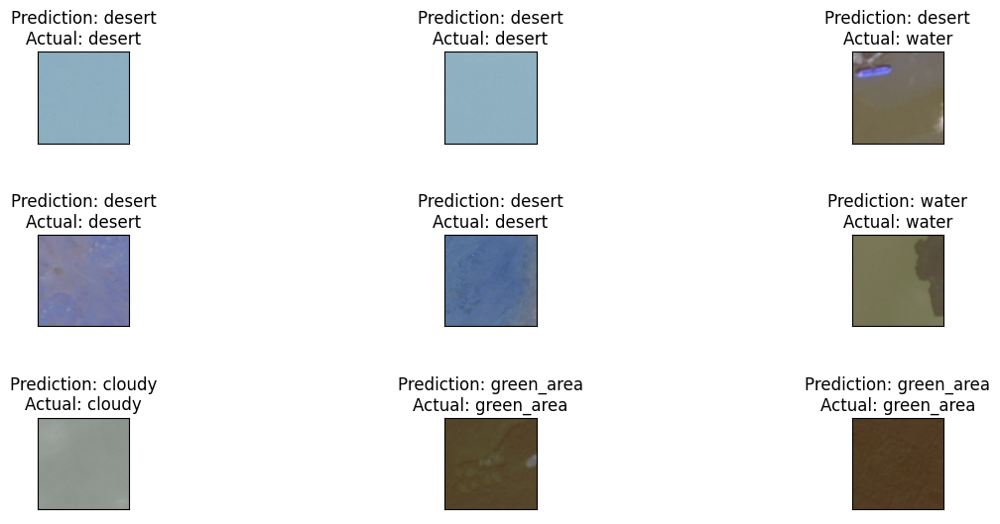

In [23]:
fig, axs = plt.subplots(3, 3, figsize = (15, 6))
fig.subplots_adjust(hspace = 1)
axs = axs.flatten()

for i, img in enumerate(batch):

    # determine label for each prediction, set title
    for key, value in class_labels.items():
        if class_result[i] == key:
            title = 'Prediction: {}\nActual: {}'.format(class_labels[key], class_labels[labels[i]])
            axs[i].set_title(title)
            axs[i].axes.get_xaxis().set_visible(False)
            axs[i].axes.get_yaxis().set_visible(False)
            
    # plot the image
    axs[i].imshow(img)
    
# show the plot
plt.show()

In [30]:
model.save(filepath="D:\kaggle_sat\data")

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op StaticRegexFullMatch in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Select in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op StringJoin in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ShardedFilename in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executi

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executi

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DisableCopyOnRead in device /job:localhost/replica:0/task:0/device:GPU:0
Executi

INFO:tensorflow:Assets written to: D:\kaggle_sat\data\assets


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0


In [1]:
%load_ext tensorboard

In [2]:
%tensorboard --logdir=logs/

Reusing TensorBoard on port 6006 (pid 15892), started 0:01:42 ago. (Use '!kill 15892' to kill it.)

In [13]:
from tensorflow import keras
reconstructed_model = keras.models.load_model('D:\kaggle_sat\data')

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executin

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executi

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localh

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableO

In [40]:
# make dictionary of class labels and names
classes = range(0,4)
names = ['cloudy',
        'desert',
        'green_area',
        'water']

# zip the names and classes to make a dictionary of class_labels
class_labels = dict(zip(classes, names))

# generate batch of 9 images to predict
batch = x[100:109]
labels = np.argmax(y[100:109],axis=-1)
labels_ = y[100:109]

# make predictions
predictions = reconstructed_model.predict(batch, verbose = 1)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [41]:
class_result = np.argmax(predictions,axis=-1)
print (class_result)

[2 3 2 0 0 0 3 0 2]


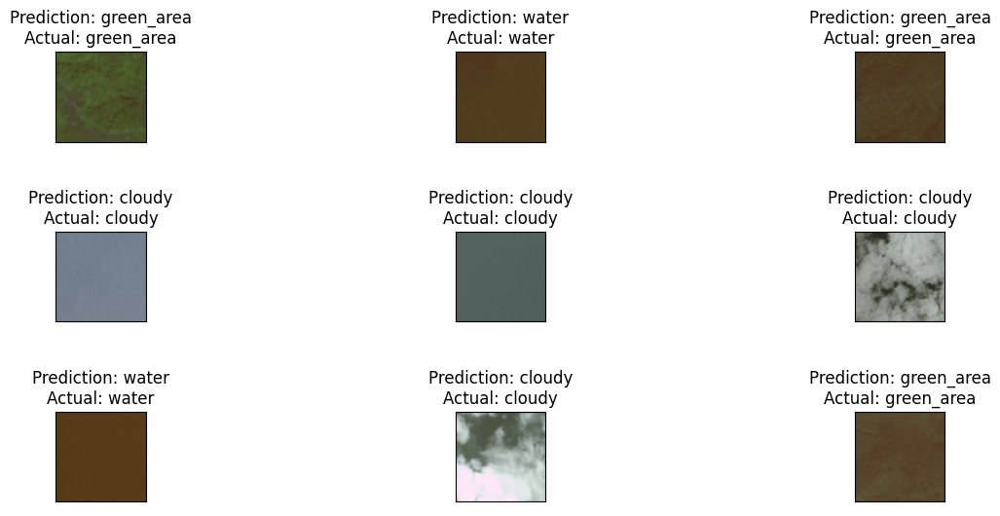

In [42]:
fig, axs = plt.subplots(3, 3, figsize = (15, 6))
fig.subplots_adjust(hspace = 1)
axs = axs.flatten()

for i, img in enumerate(batch):

    # determine label for each prediction, set title
    for key, value in class_labels.items():
        if class_result[i] == key:
            title = 'Prediction: {}\nActual: {}'.format(class_labels[key], class_labels[labels[i]])
            axs[i].set_title(title)
            axs[i].axes.get_xaxis().set_visible(False)
            axs[i].axes.get_yaxis().set_visible(False)
            
    # plot the image
    axs[i].imshow(img)
    
# show the plot
plt.show()

In [43]:
from sklearn.metrics import confusion_matrix
predictions = reconstructed_model.predict(x, verbose = 1)
class_result = np.argmax(predictions,axis=-1)
y_test = np.argmax(y,axis=-1)
print(confusion_matrix(y_test,class_result.round()))


Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

In [53]:
print("Evaluate on test data")
results = reconstructed_model.evaluate(x[100:200], y[100:200], batch_size=8)
print("test loss, test acc:", round(results[0], 2), round(results[1], 2))

Evaluate on test data
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device: